In [ ]:
!pip install statsmodels==0.12.1

     |████████████████████████████████| 9.5 MB 6.3 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from pandas.plotting import scatter_matrix
import missingno as msno
import matplotlib.pyplot as plt

In [ ]:
pd.options.display.float_format='{:,.4f}'.format

In [ ]:
df = pd.read_csv('/content/ts_kwh_dataframe.csv')
df = df.drop('Unnamed: 0', axis = 1)
df

,Fecha,kW/h price mean,kW/h price std,Disponibilidad_HIDRAULICA,Disponibilidad_TERMICA,Disponibilidad_SOLAR,Aportes Caudal m3/s,Aportes Energía gWh,Volumen Útil Diario Mm3,Volumen Mm3,Volumen Útil Diario Energía gWh,Volumen Energía gWh,Vertimientos Volumen miles m3,Vertimiento Energía gWh
0,2000-01-01,32.8681,2.8577,172.6811,81.6062,nan,719.1000,56.6773,"5,454.0068","6,024.5120","10,732.3505","11,548.8853","16,212.9922",23.8878
1,2000-01-02,33.0348,3.6742,172.5040,79.4192,nan,768.3400,54.6452,"5,421.8808","5,992.3860","10,712.4928","11,529.0276","14,161.0631",20.5843
2,2000-01-03,37.2723,7.7108,172.3862,79.4102,nan,757.5000,57.4883,"5,390.9129","5,961.4181","10,677.3738","11,493.9081","13,370.1628",19.3694
3,2000-01-04,41.6890,8.1507,171.9537,79.4032,nan,739.9300,58.4182,"5,364.3178","5,934.8230","10,643.9801","11,460.5150","13,292.4191",18.7103
4,2000-01-05,40.8931,7.9562,172.3443,79.4032,nan,729.8500,63.0395,"5,345.9628","5,916.4680","10,614.0214","11,430.5566","16,737.6356",21.1667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7861,2021-07-10,85.1562,3.7852,225.1027,106.3479,nan,"2,758.6370",249.8449,"11,739.2200","14,470.6500","14,126.5203","15,678.8082","29,622.3370",60.7249
7862,2021-07-11,83.3529,0.3735,233.0707,106.3245,nan,"3,598.6330",333.1600,"11,824.9198","14,556.3498","14,211.3838","15,763.6715","65,827.5795",66.4647
7863,2021-07-12,84.9800,0.4186,233.1127,106.3820,nan,"2,912.5250",224.1366,"11,839.7830","14,571.2130","14,213.3817","15,765.6696","65,381.5660",53.1992
7864,2021-07-13,83.6892,0.1406,235.5412,106.2828,nan,"3,296.7080",237.2587,"11,873.2230","14,604.6530","14,223.8340","15,776.1216","42,932.2150",34.5093


In [ ]:
df['Fecha'] = pd.to_datetime(df['Fecha'])
df = df.set_index('Fecha')

In [ ]:
df['Year'] = df.index.year
df['Month'] = df.index.month

#EDA:

## Data structure:

In [ ]:
df.dtypes

kW/h price mean                    float64
kW/h price std                     float64
Disponibilidad_HIDRAULICA          float64
Disponibilidad_TERMICA             float64
Disponibilidad_SOLAR               float64
Aportes Caudal m3/s                float64
Aportes Energía gWh                float64
Volumen Útil Diario Mm3            float64
Volumen Mm3                        float64
Volumen Útil Diario Energía gWh    float64
Volumen Energía gWh                float64
Vertimientos Volumen miles m3      float64
Vertimiento Energía gWh            float64
Year                                 int64
Month                                int64
dtype: object

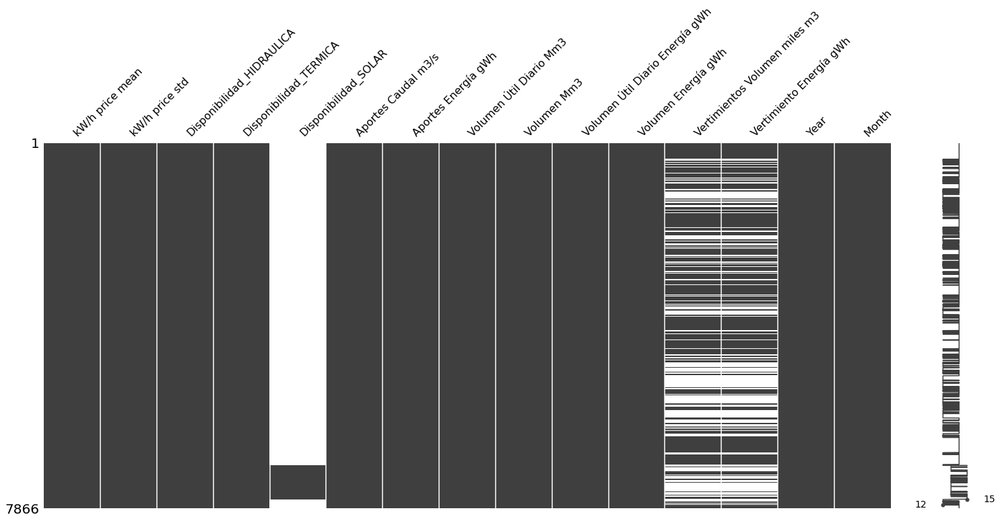

In [ ]:
msno.matrix(df)

In [ ]:
pd.DataFrame(df.isna().sum(), columns=['Missings'])

,Missings
kW/h price mean,0
kW/h price std,0
Disponibilidad_HIDRAULICA,0
Disponibilidad_TERMICA,0
Disponibilidad_SOLAR,7135
Aportes Caudal m3/s,0
Aportes Energía gWh,0
Volumen Útil Diario Mm3,0
Volumen Mm3,0
Volumen Útil Diario Energía gWh,0


## Descriptive statistics:

In [ ]:
df[[ 'kW/h price mean', 'kW/h price std',
       'Disponibilidad_HIDRAULICA', 'Disponibilidad_TERMICA',
       'Disponibilidad_SOLAR', 'Aportes Caudal m3/s']].describe()

,kW/h price mean,kW/h price std,Disponibilidad_HIDRAULICA,Disponibilidad_TERMICA,Disponibilidad_SOLAR,Aportes Caudal m3/s
count,"7,866.0000","7,866.0000","7,866.0000","7,866.0000",731.0000,"7,866.0000"
mean,135.6252,18.2195,191.5593,92.3581,0.7355,"1,699.2571"
std,134.5370,22.1098,21.5015,14.0937,0.4737,749.8535
min,28.8414,0.0000,0.0000,0.0000,0.0023,0.0000
25%,65.6000,5.2340,175.2980,85.3941,0.3691,"1,153.0747"
50%,93.8549,11.9509,185.7926,93.6778,0.4500,"1,622.6130"
75%,159.7140,23.4903,207.3736,99.3840,1.2000,"2,103.8440"
max,"1,942.6928",462.0501,249.0059,148.5874,1.6080,"6,088.9140"


In [ ]:
df[[ 'Aportes Energía gWh',
       'Volumen Útil Diario Mm3', 'Volumen Mm3',
       'Volumen Útil Diario Energía gWh', 'Volumen Energía gWh',
       'Vertimientos Volumen miles m3', 'Vertimiento Energía gWh']].describe()

,Aportes Energía gWh,Volumen Útil Diario Mm3,Volumen Mm3,Volumen Útil Diario Energía gWh,Volumen Energía gWh,Vertimientos Volumen miles m3,Vertimiento Energía gWh
count,"7,866.0000","7,866.0000","7,866.0000","7,866.0000","7,866.0000","4,945.0000","4,945.0000"
mean,140.8939,"6,309.8131","8,261.7664","10,519.6631","11,715.5082","11,859.7959",11.3155
std,70.4382,"1,892.3548","2,262.7321","1,983.6521","2,008.1893","18,656.4698",17.3853
min,25.2534,"2,229.8790","4,051.0550","5,405.0078","6,907.0382",0.0000,0.0000
25%,89.5840,"5,049.4127","6,736.0645","9,151.4417","10,281.0671",992.5660,0.8195
50%,129.9833,"5,967.7160","7,731.4585","10,742.6588","11,907.8903","4,732.1300",4.0155
75%,175.8679,"6,988.9313","8,938.8250","12,167.0539","13,348.1890","14,010.8600",14.1713
max,591.2453,"12,155.4460","14,888.8860","14,501.5791","15,972.6098","153,542.8180",140.5255


## Scatter Matrix:

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f984d0cba10>,
      dtype=object)

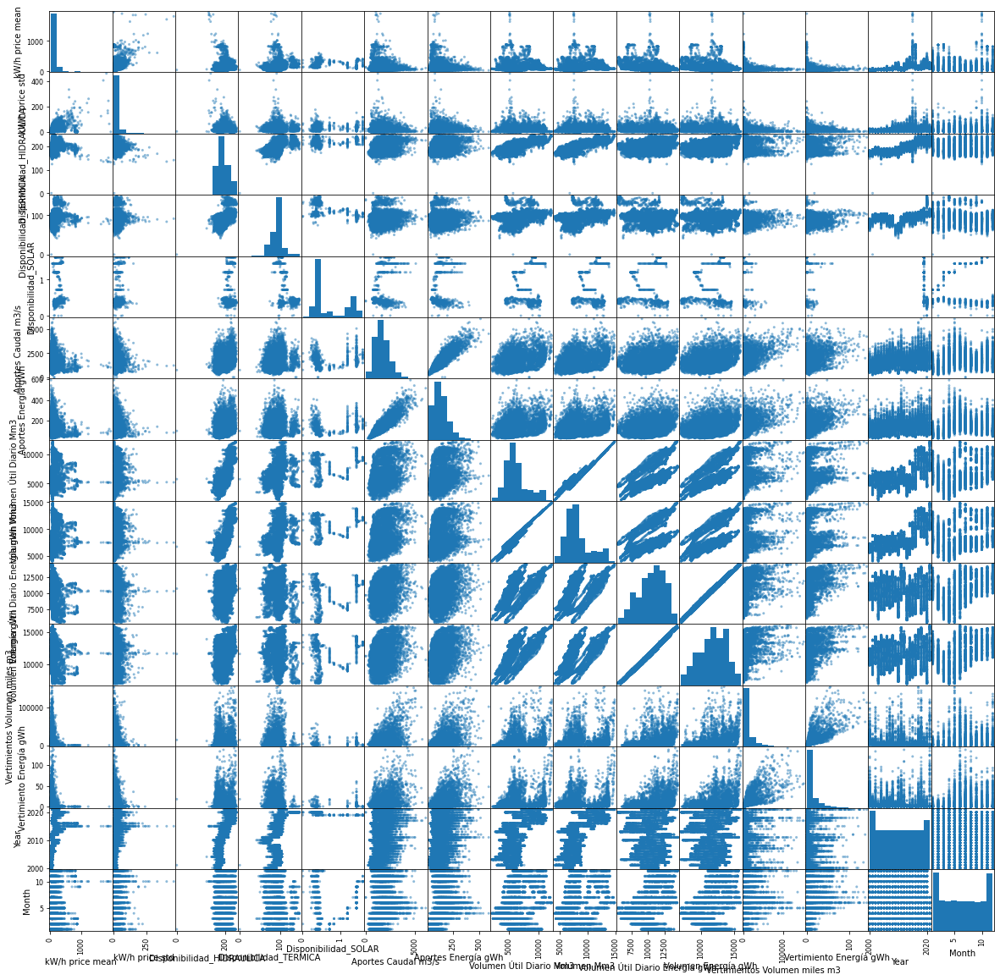

In [ ]:
scatter_matrix(df, figsize=(20,20))

## Correlations:

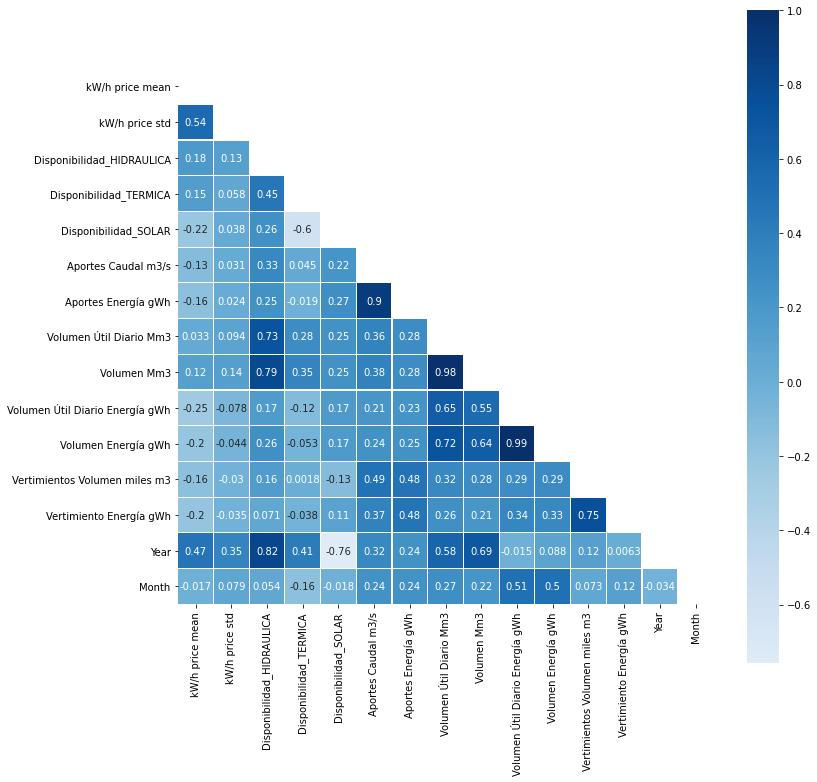

In [ ]:
# Compute the correlation matrix
corr = df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 12))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap='Blues', vmax=1, center=0,
            square=True, linewidths=.1, annot = True)

## Jointplots grouped by year:

In [ ]:
list_to_plot = ['kW/h price mean','Disponibilidad_HIDRAULICA',
       'Disponibilidad_TERMICA', 'Disponibilidad_SOLAR', 'Aportes Caudal m3/s',
       'Aportes Energía gWh', 'Volumen Útil Diario Mm3', 'Volumen Mm3',
       'Volumen Útil Diario Energía gWh', 'Volumen Energía gWh',
       'Vertimientos Volumen miles m3', 'Vertimiento Energía gWh']

a


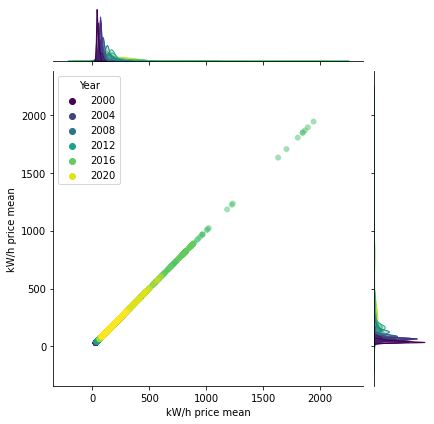

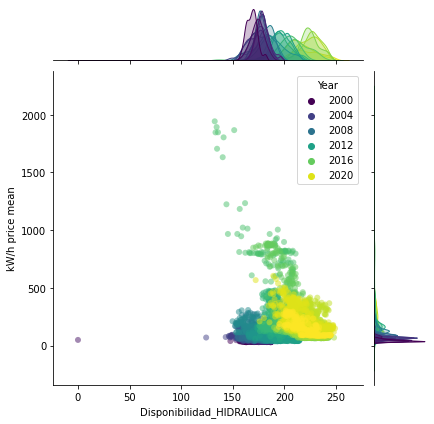

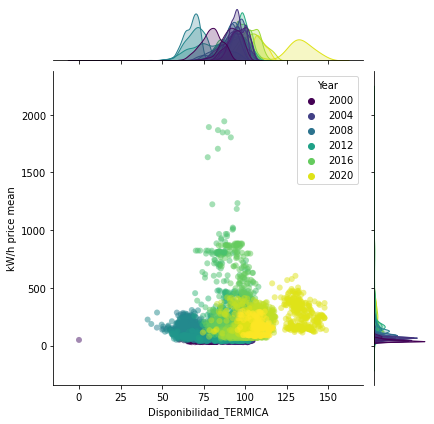

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

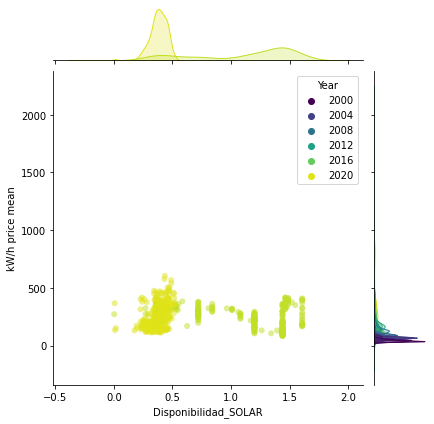

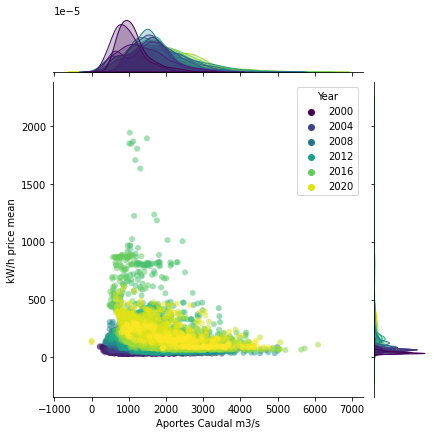

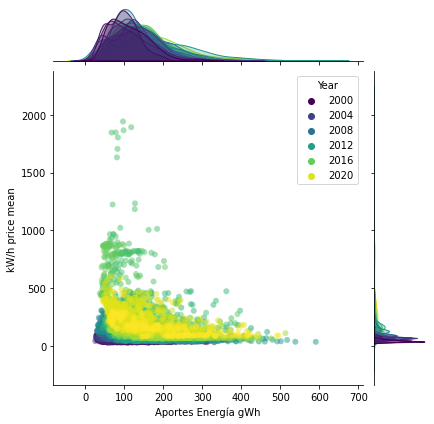

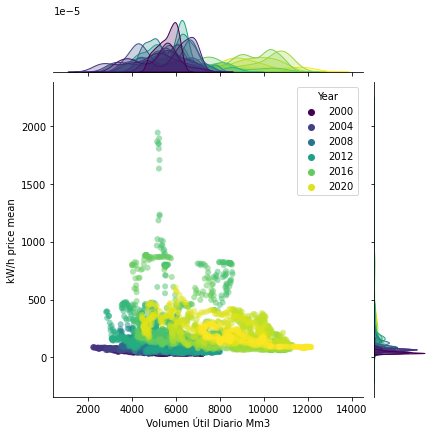

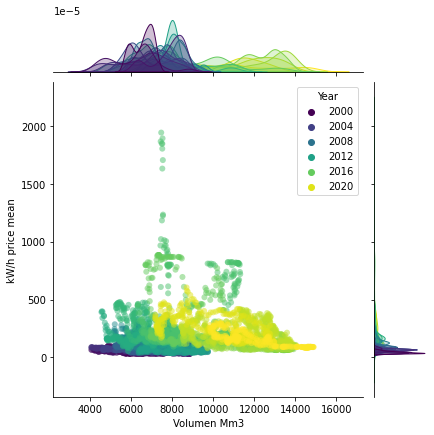

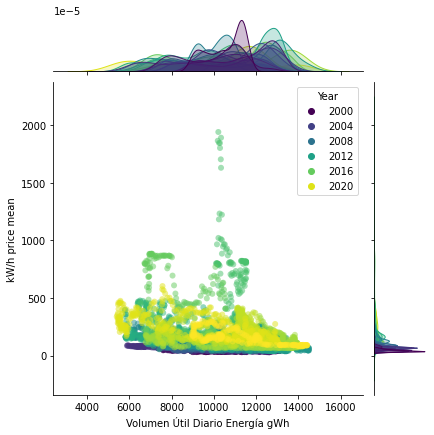

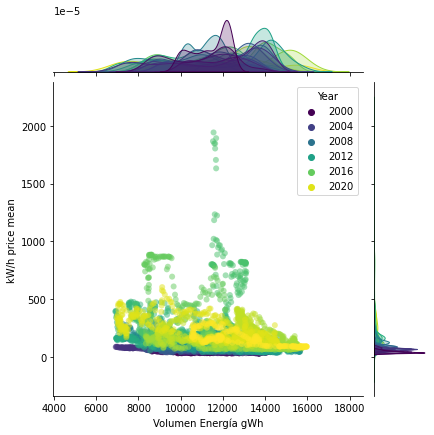

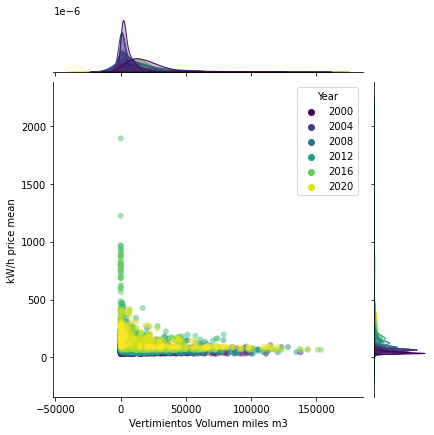

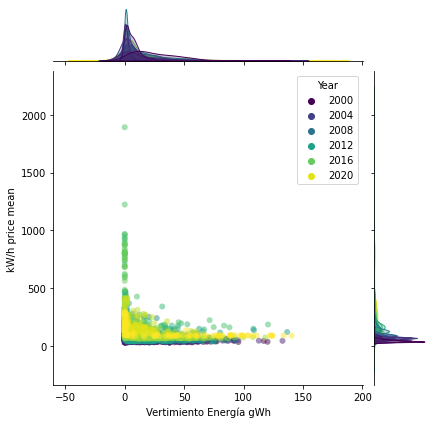

In [ ]:
print('a')
for i in list_to_plot:
  sns.jointplot(data = df, y='kW/h price mean', x = i, hue = 'Year', alpha=.5, linewidth=0, palette = 'viridis')
  plt.show()

In [ ]:
df.columns

Index(['kW/h price mean', 'kW/h price std', 'Disponibilidad_HIDRAULICA',
       'Disponibilidad_TERMICA', 'Disponibilidad_SOLAR', 'Aportes Caudal m3/s',
       'Aportes Energía gWh', 'Volumen Útil Diario Mm3', 'Volumen Mm3',
       'Volumen Útil Diario Energía gWh', 'Volumen Energía gWh',
       'Vertimientos Volumen miles m3', 'Vertimiento Energía gWh', 'Year',
       'Month'],
      dtype='object')

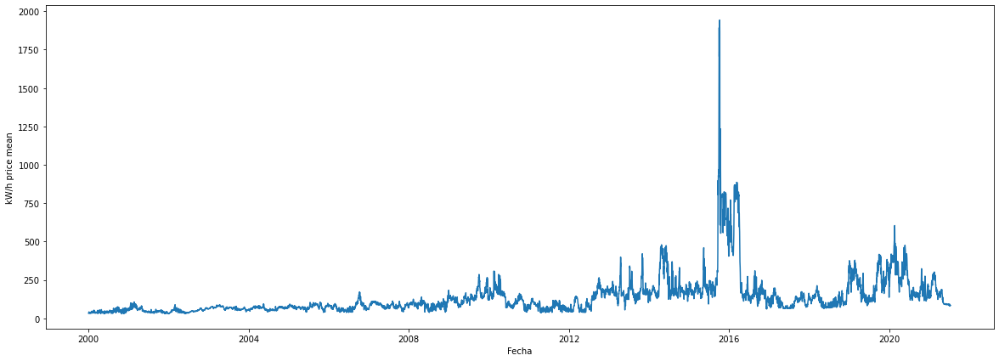

In [ ]:
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=df, y ='kW/h price mean', x='Fecha')

## Time Series Plots:

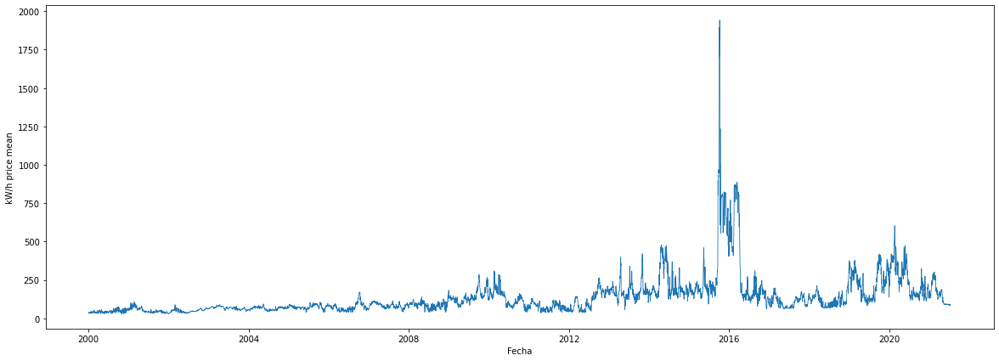

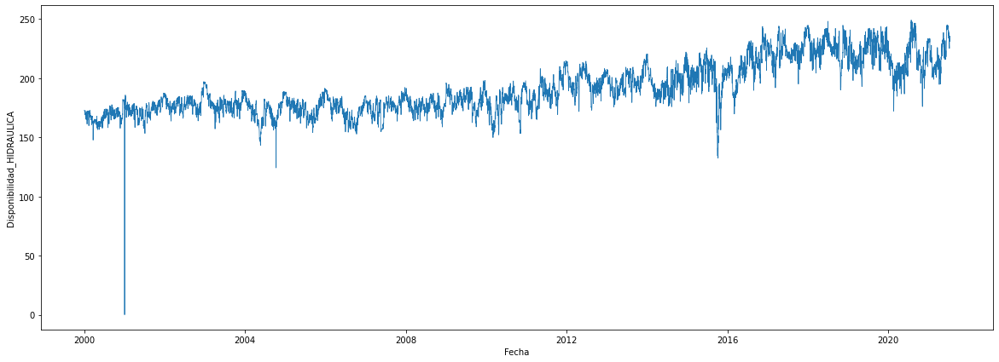

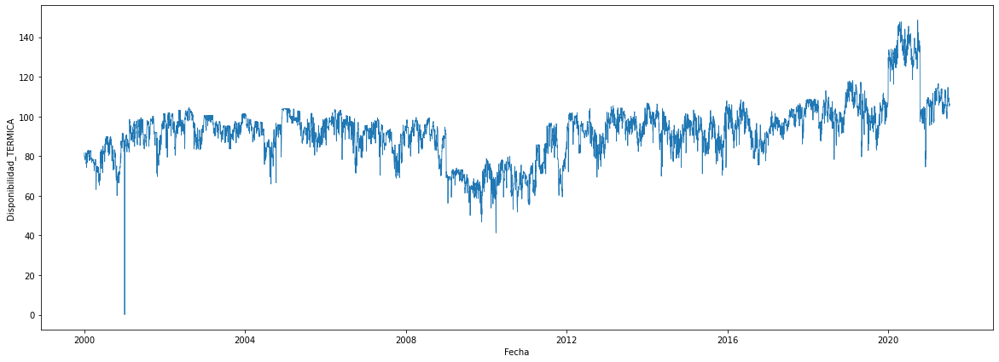

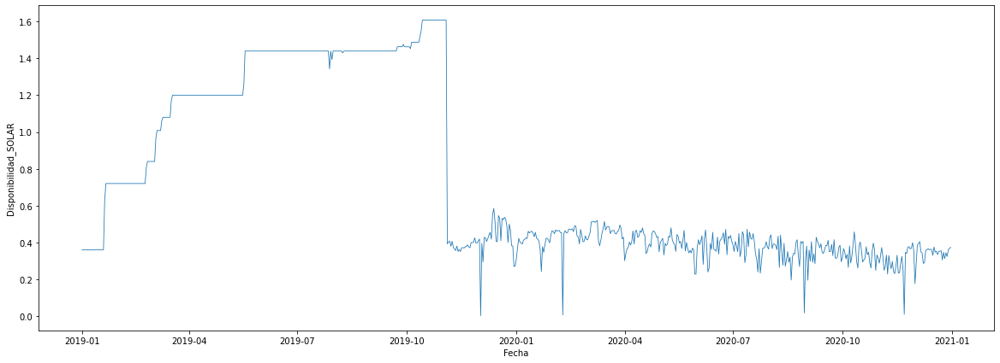

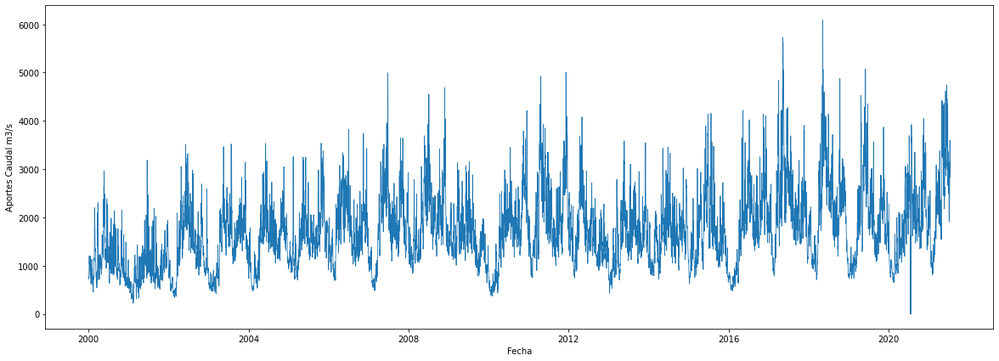

...

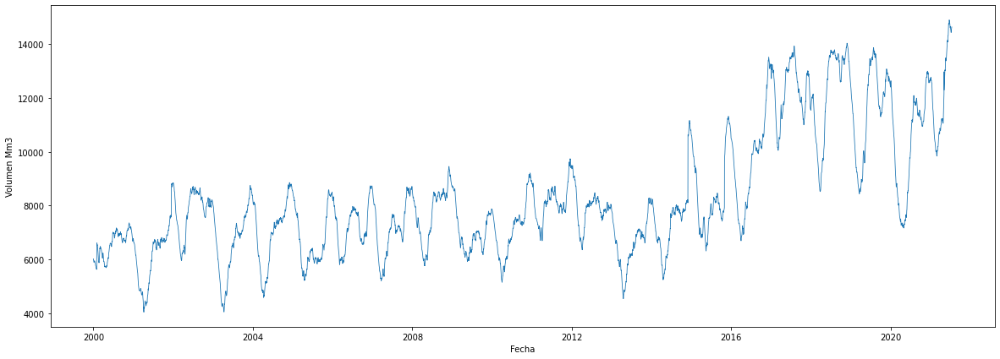

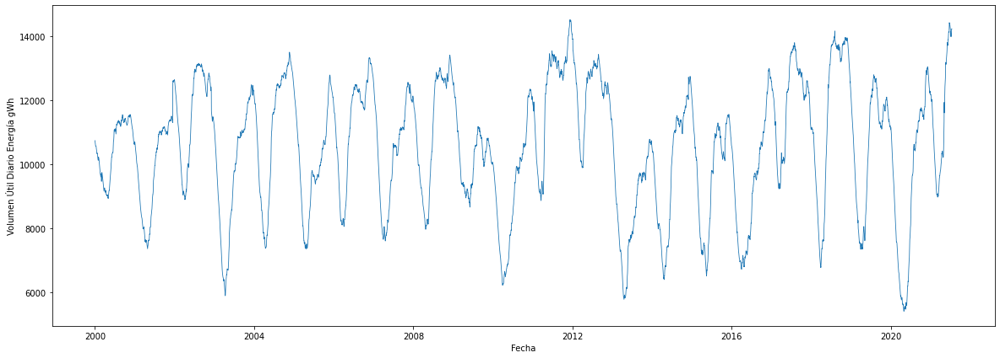

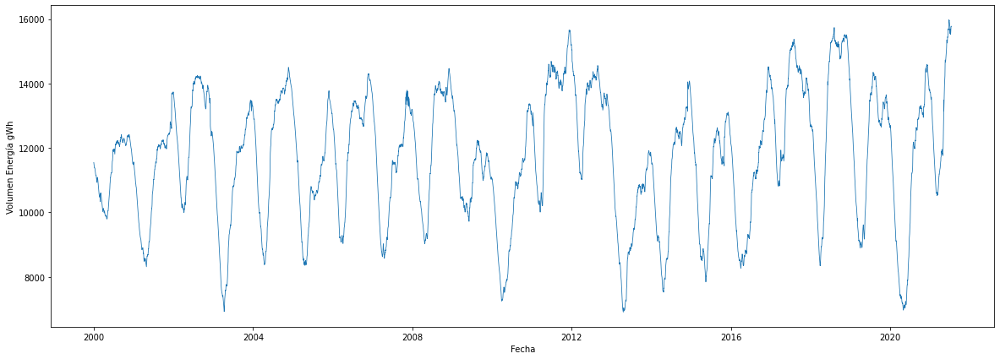

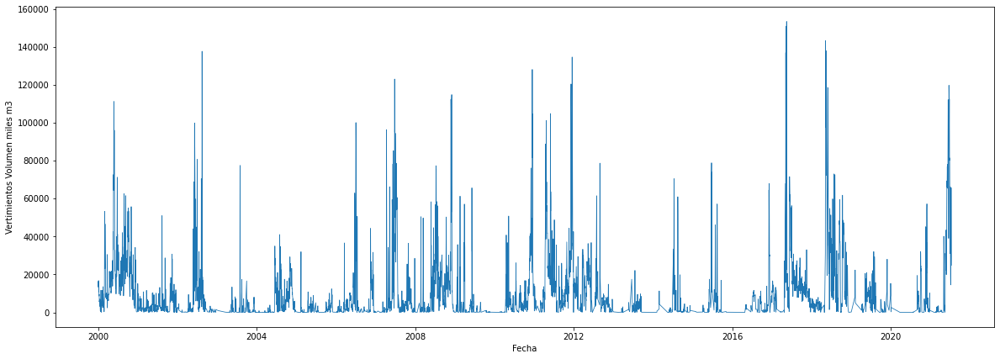

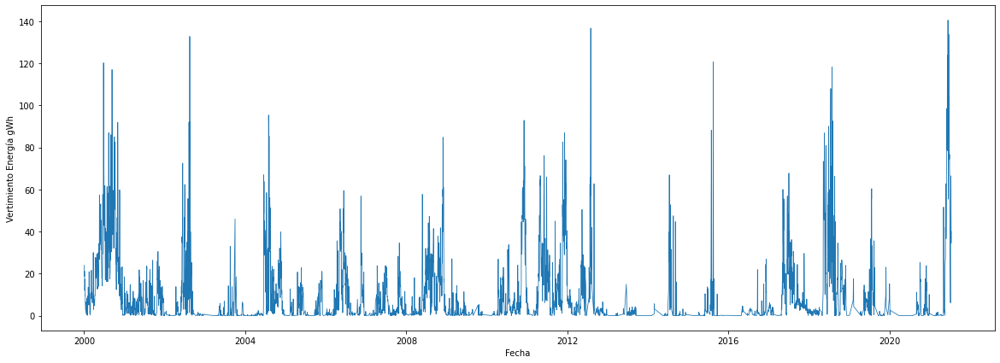

In [ ]:
for i in list_to_plot:
  fig, ax = plt.subplots(figsize=(20,7))
  sns.lineplot(data = df, y=i, x = 'Fecha', linewidth=.8)
  plt.show()

## Time series: Density function grouped by Year:

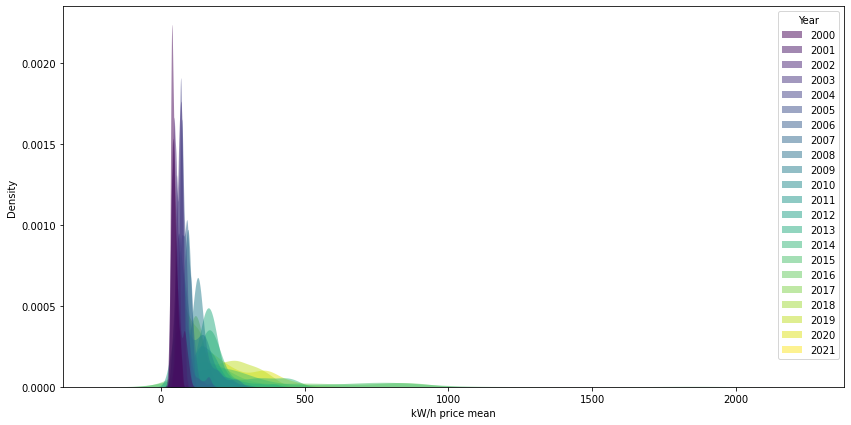

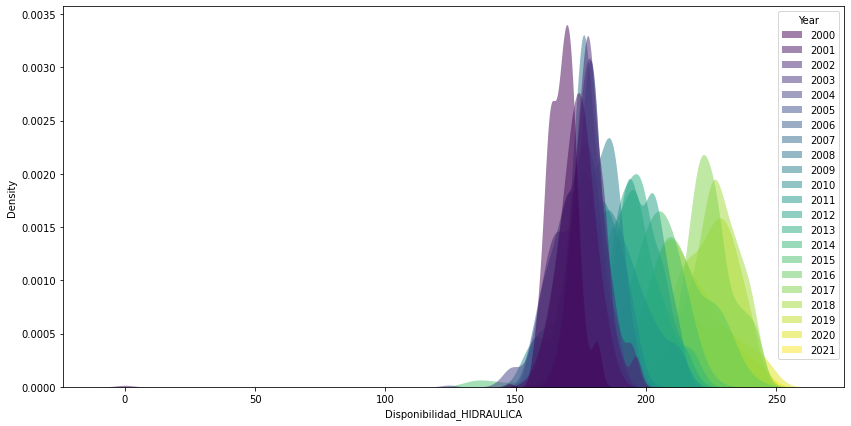

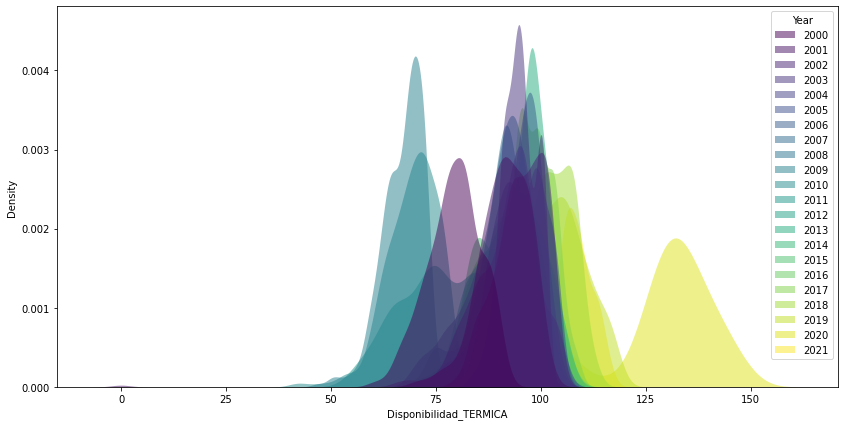

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

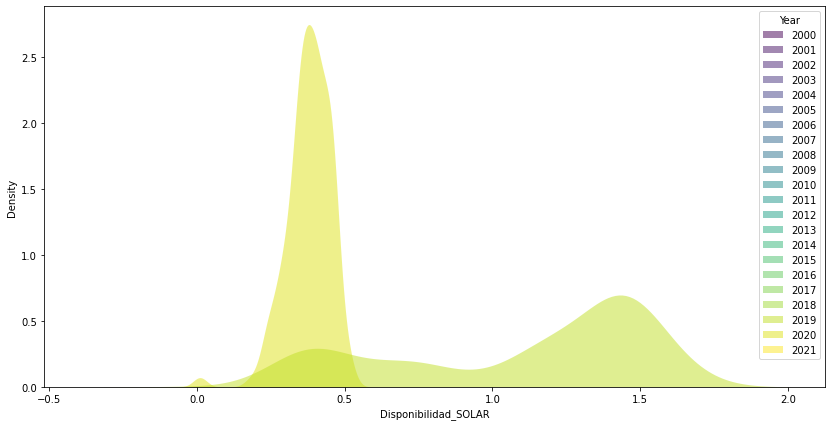

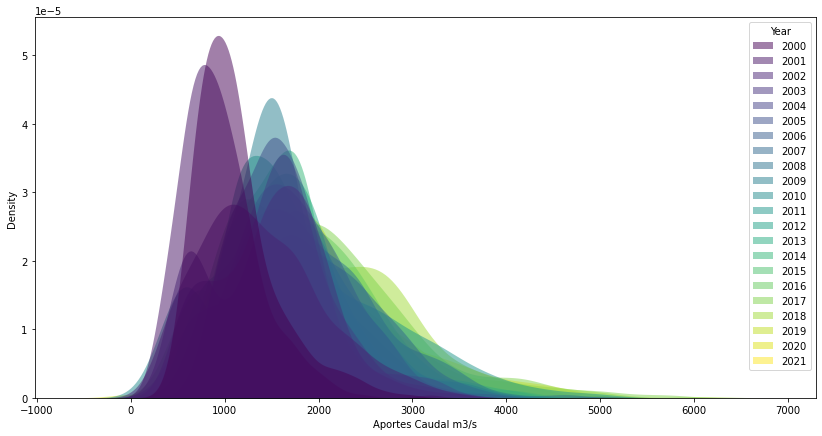

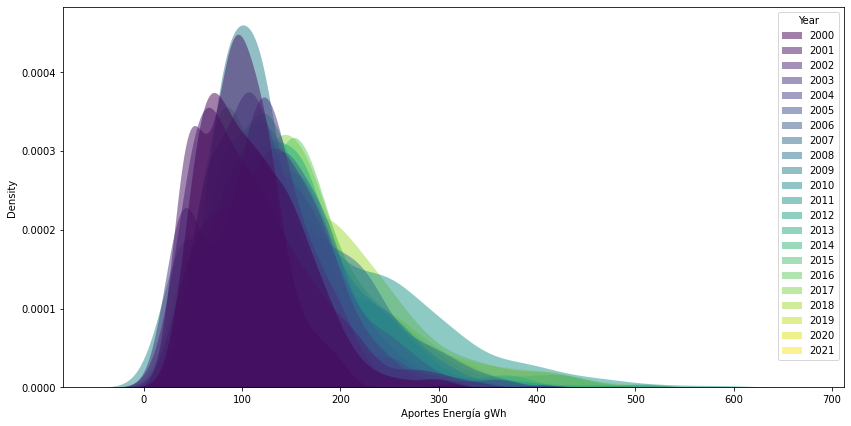

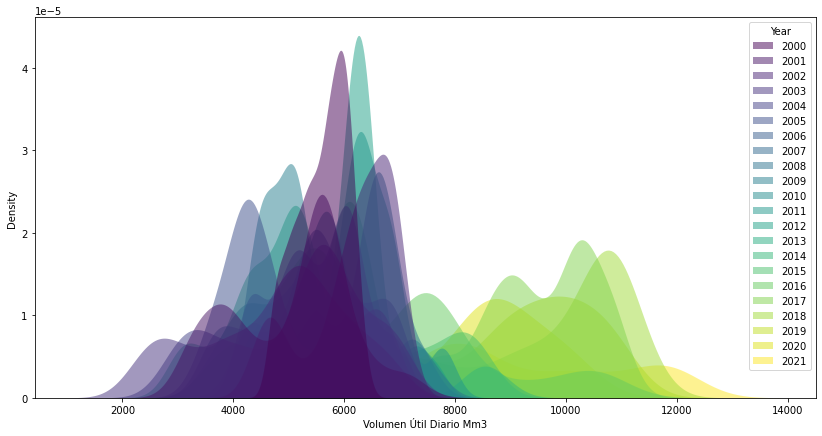

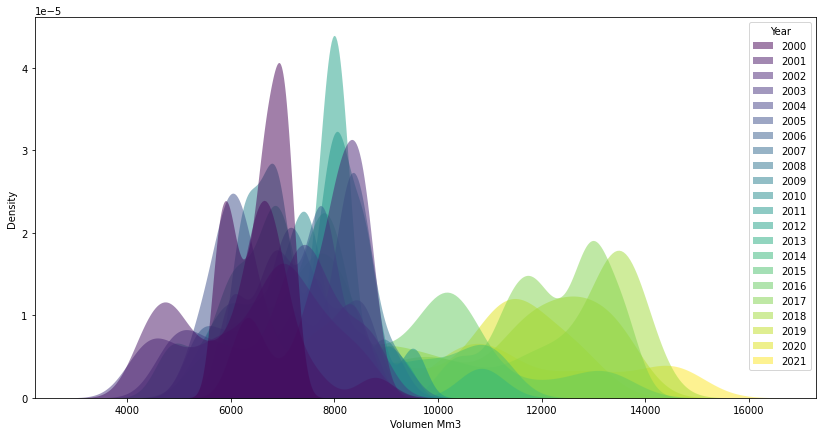

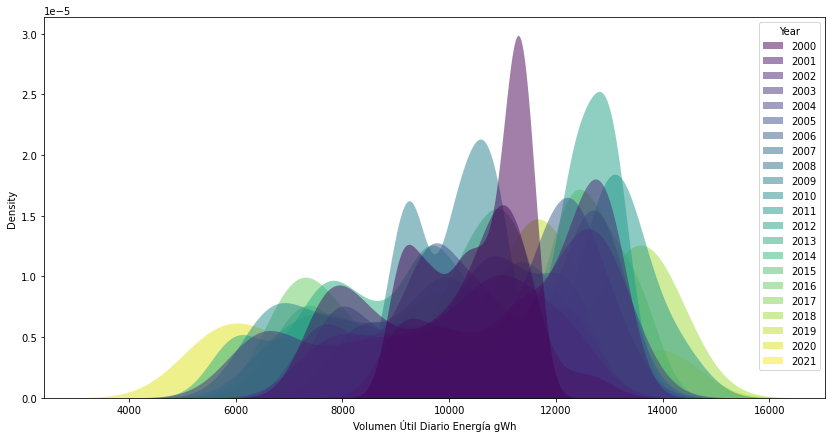

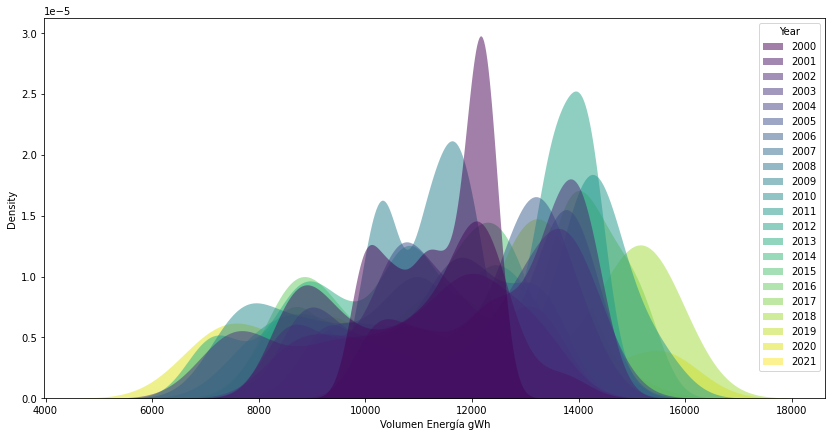

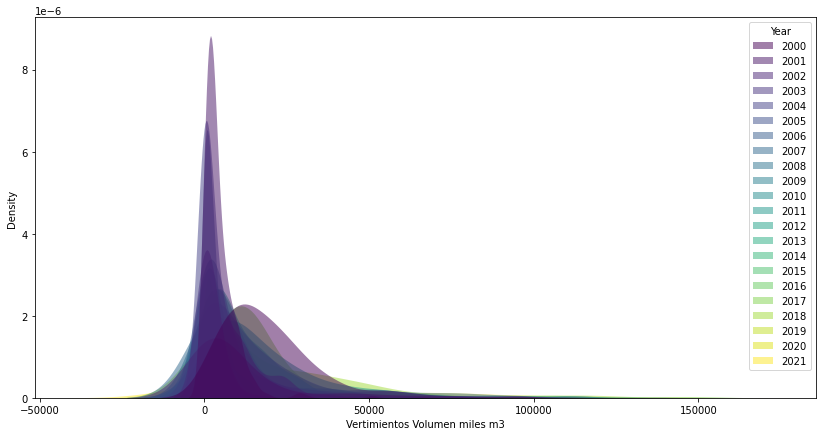

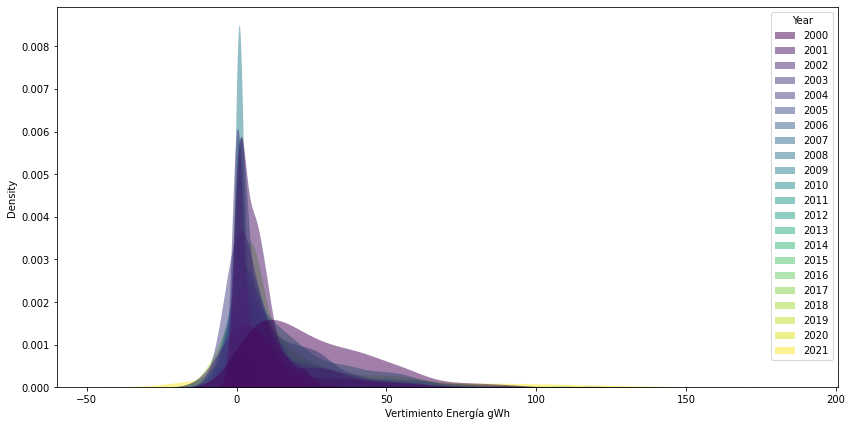

In [ ]:
for i in list_to_plot:
  fig, ax = plt.subplots(figsize=(14,7), )
  sns.kdeplot(data = df, x=i, hue = 'Year', fill=True, alpha=.5, linewidth=0, palette = 'viridis')
  plt.show()

## ADF Test for Stationarity:

In [ ]:
from statsmodels.tsa.stattools import adfuller
for i in list_to_plot:
  X = df[i].values
  X = np.nan_to_num(X)
  result = adfuller(X)
  print(i), print('ADF Statistic: %f' % result[0]), print('p-value: %f' % result[1]), print('Critical Values:')
  for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

kW/h price mean
ADF Statistic: -5.265702
p-value: 0.000006
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_HIDRAULICA
ADF Statistic: -3.321264
p-value: 0.013954
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_TERMICA
ADF Statistic: -4.359068
p-value: 0.000350
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_SOLAR
ADF Statistic: -2.927499
p-value: 0.042242
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Aportes Caudal m3/s
ADF Statistic: -7.864387
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Aportes Energía gWh
ADF Statistic: -7.488760
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Útil Diario Mm3
ADF Statistic: -5.164584
p-value: 0.000010
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Mm3
ADF Statistic: -4.218851
p-value: 0.000612
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Útil Diario Energía gWh
ADF Statistic: -8.560194
p-val

## Lagplots:

kW/h price mean


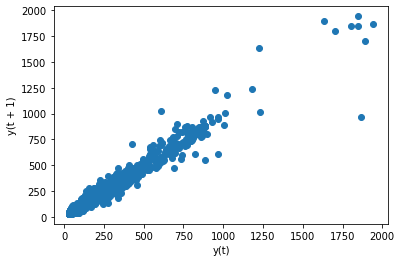

Disponibilidad_HIDRAULICA


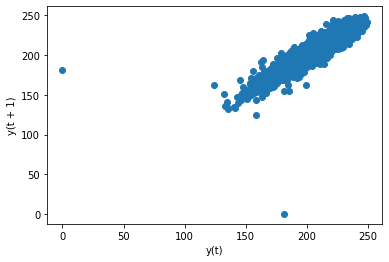

Disponibilidad_TERMICA


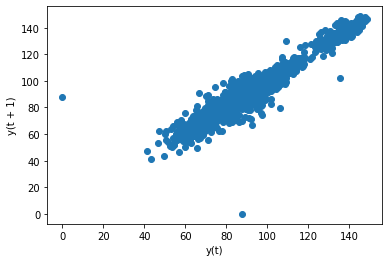

Disponibilidad_SOLAR


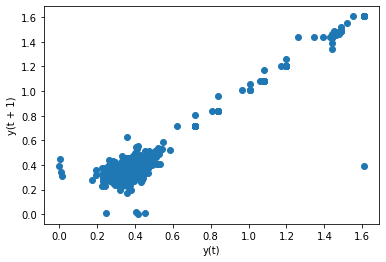

Aportes Caudal m3/s


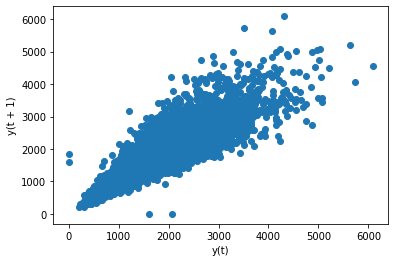

Aportes Energía gWh


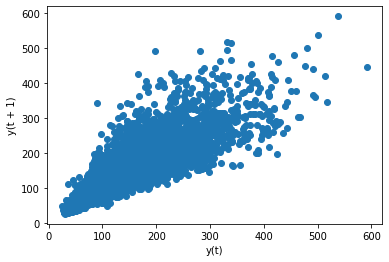

Volumen Útil Diario Mm3


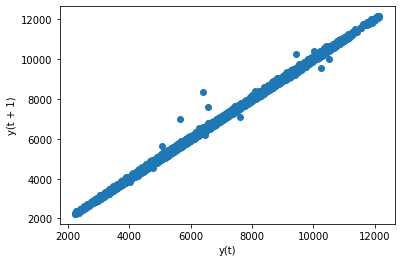

Volumen Mm3


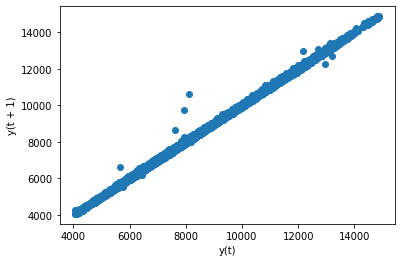

Volumen Útil Diario Energía gWh


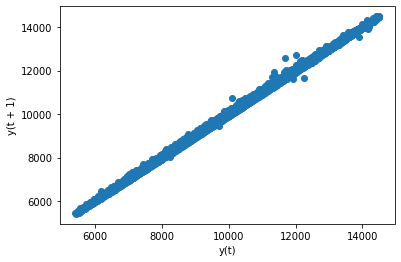

Volumen Energía gWh


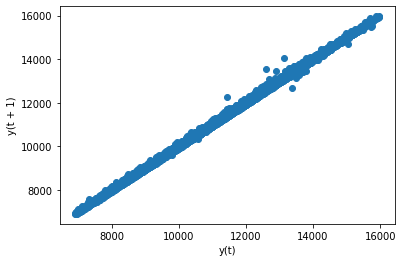

Vertimientos Volumen miles m3


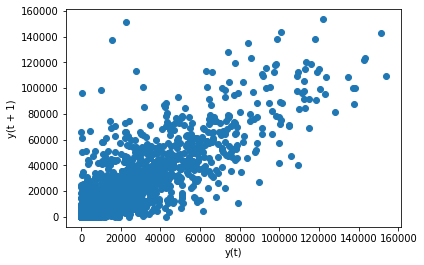

Vertimiento Energía gWh


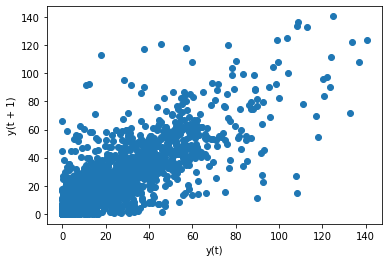

In [ ]:
from pandas.plotting import lag_plot
for i in list_to_plot:
  print(i)
  lag_plot(df[i])
  plt.show()

# First Difference:

In [ ]:
df_diff = df.diff()
df_diff['Year'] = df['Year']
df_diff['Month'] = df['Month']

## Correlations:

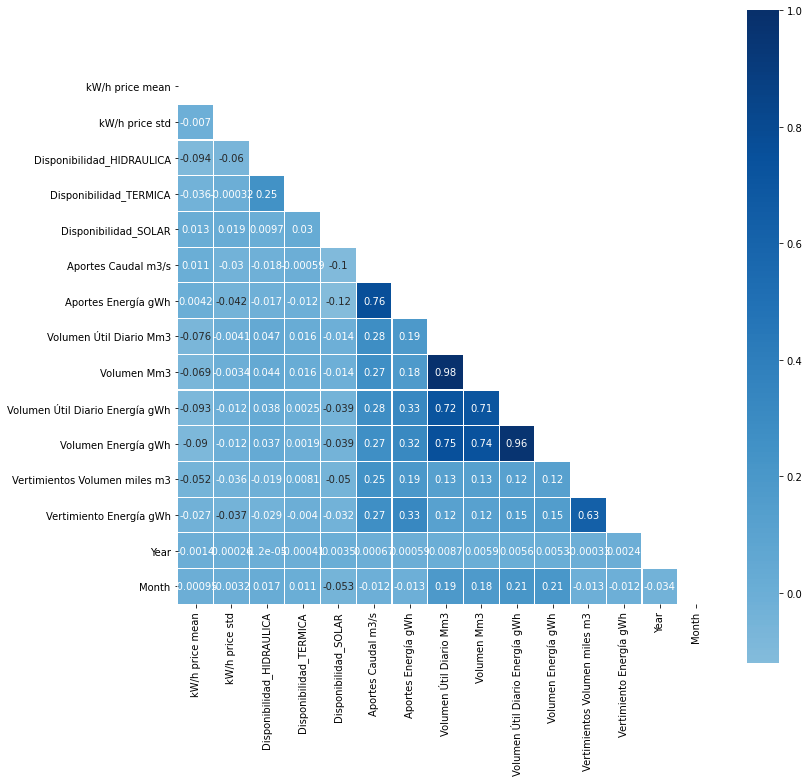

In [ ]:
# Compute the correlation matrix
corr_diff = df_diff.corr(method='pearson')

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr_diff, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 12))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_diff, mask=mask, cmap='Blues', vmax=1, center=0,
            square=True, linewidths=.1, annot = True)

## Jointplots:

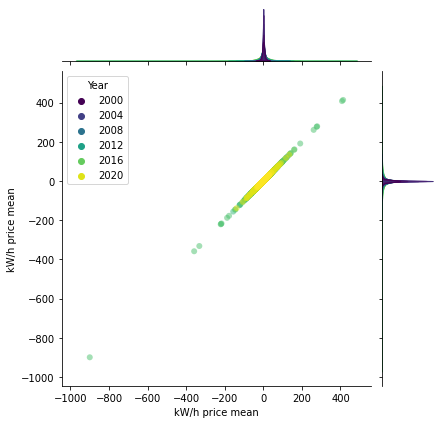

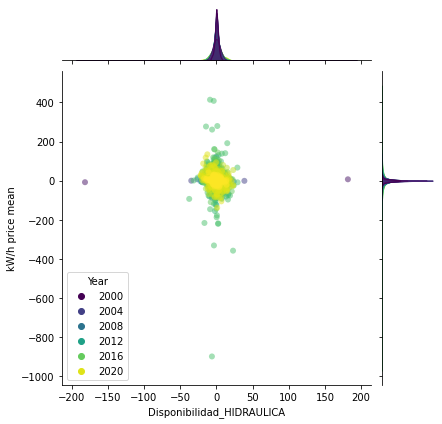

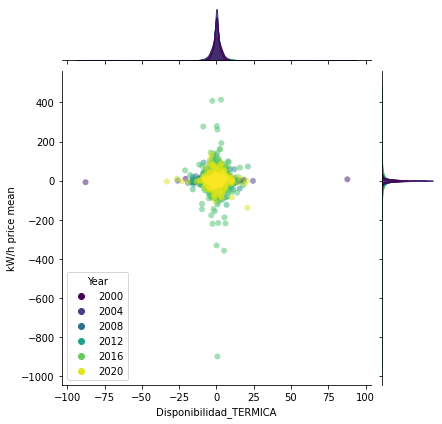

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

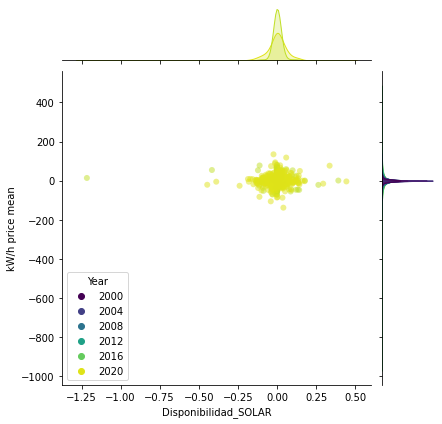

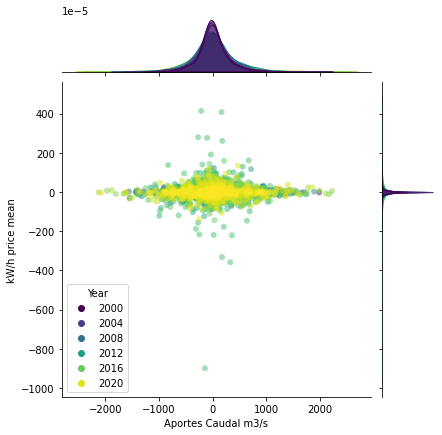

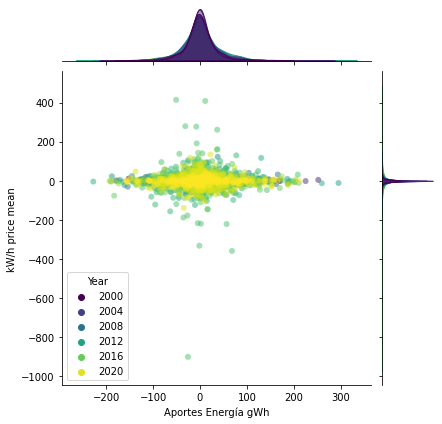

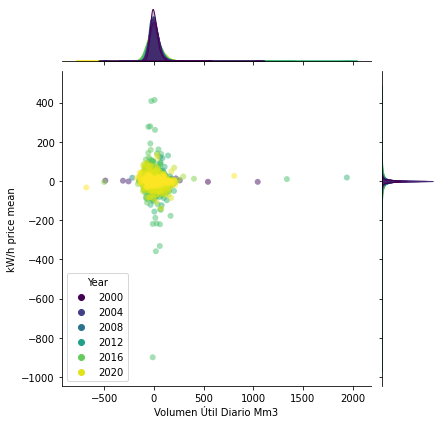

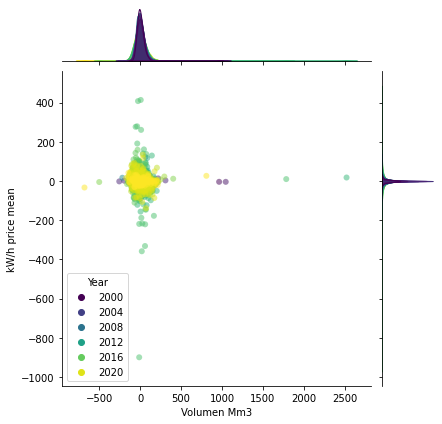

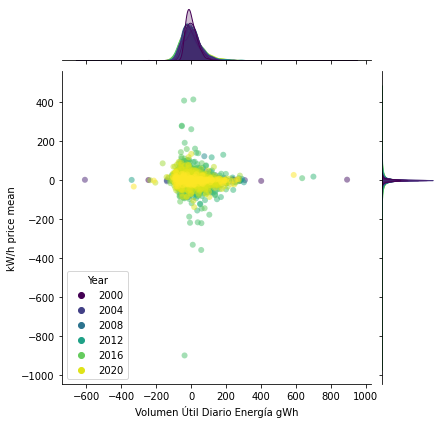

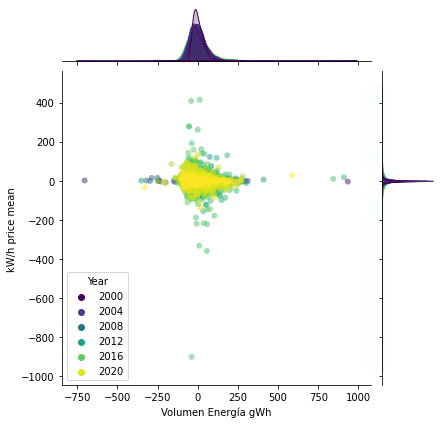

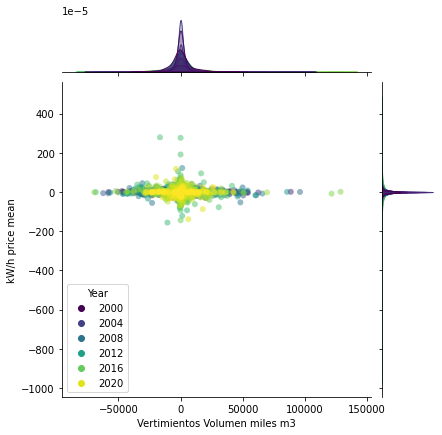

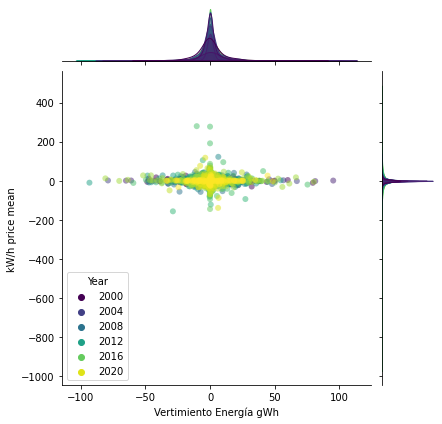

In [ ]:
for i in list_to_plot:
  sns.jointplot(data = df_diff, y='kW/h price mean', x = i, hue = 'Year', alpha=.5, linewidth=0, palette = 'viridis')
  plt.show()

## First Difference plots:

a


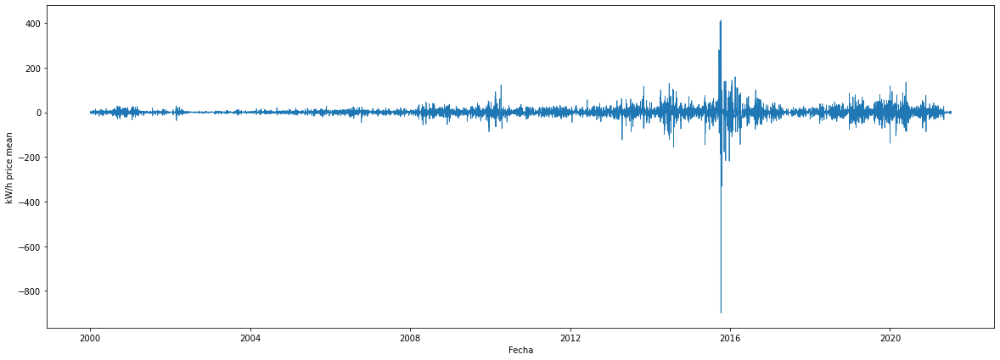

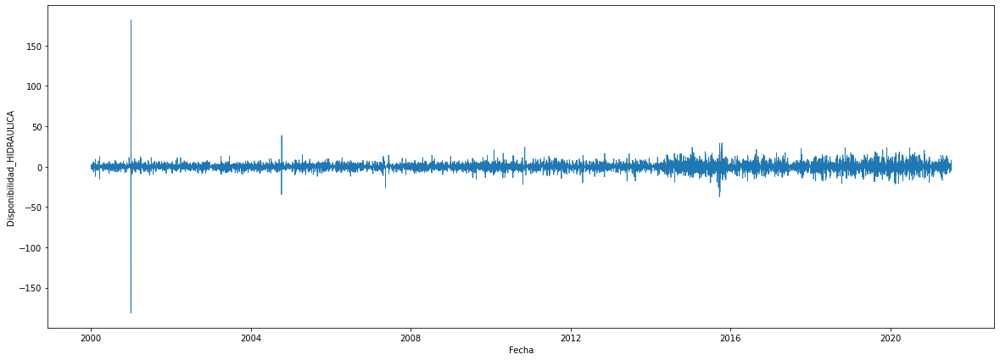

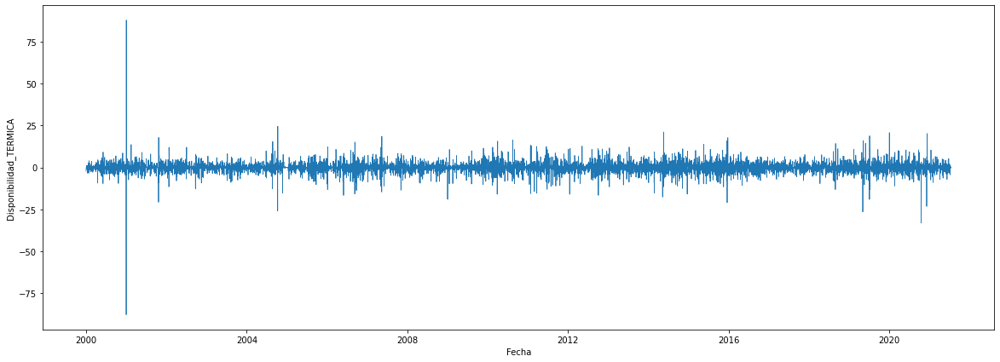

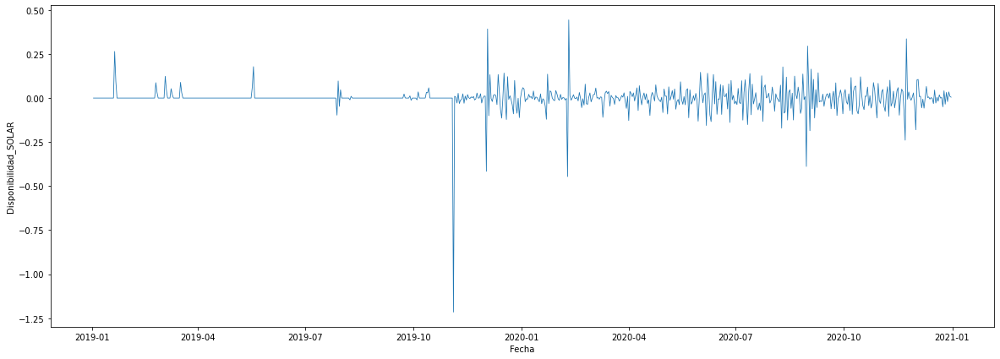

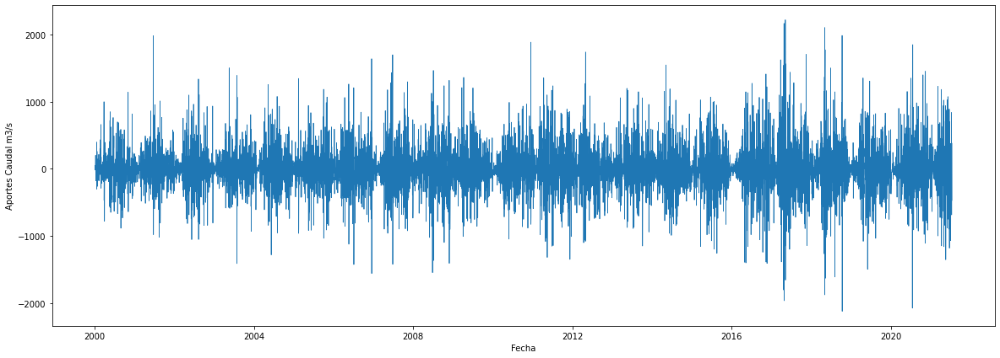

...

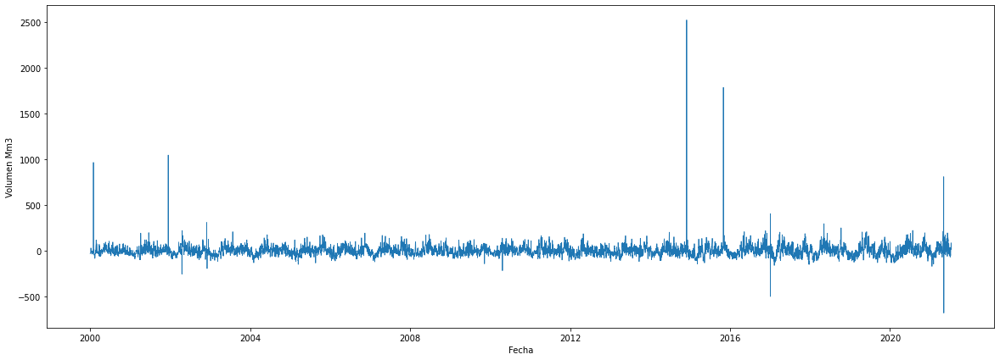

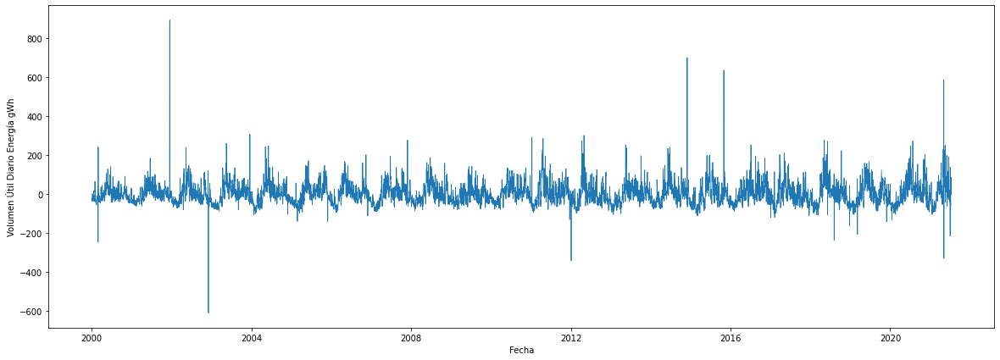

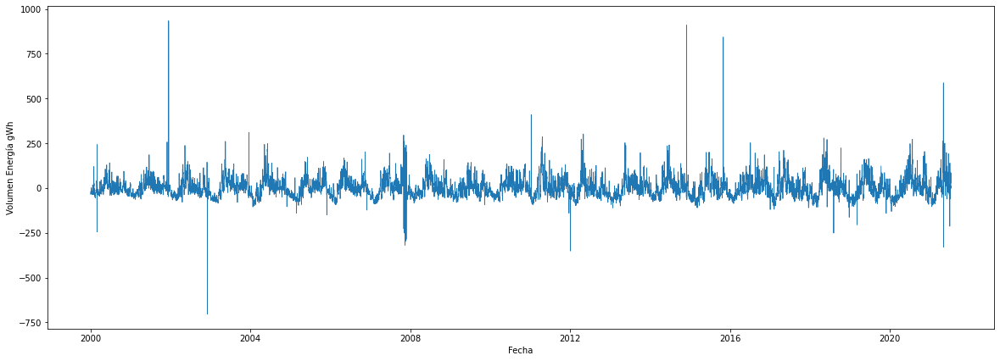

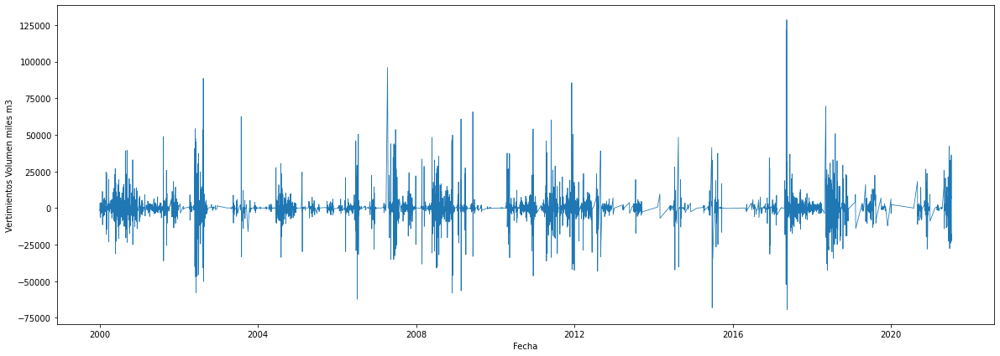

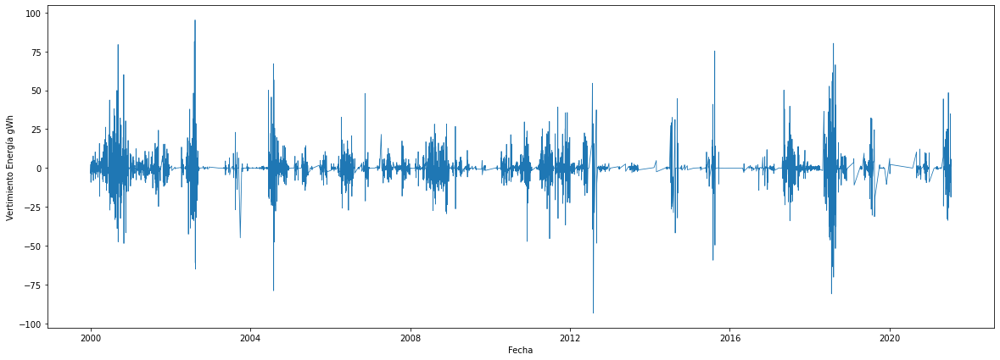

In [ ]:
print('a')
for i in list_to_plot:
  fig, ax = plt.subplots(figsize=(20,7))
  sns.lineplot(data = df_diff, y=i, x = 'Fecha', linewidth=.8)
  plt.show()

## First Difference Density Function grouped by year:

a


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

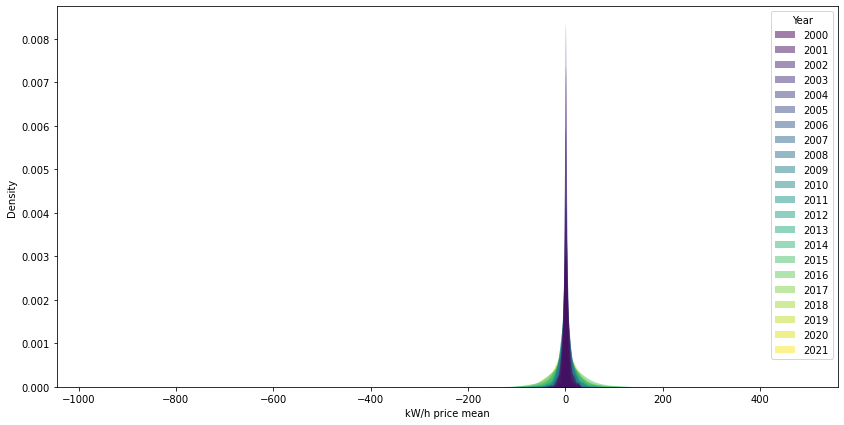

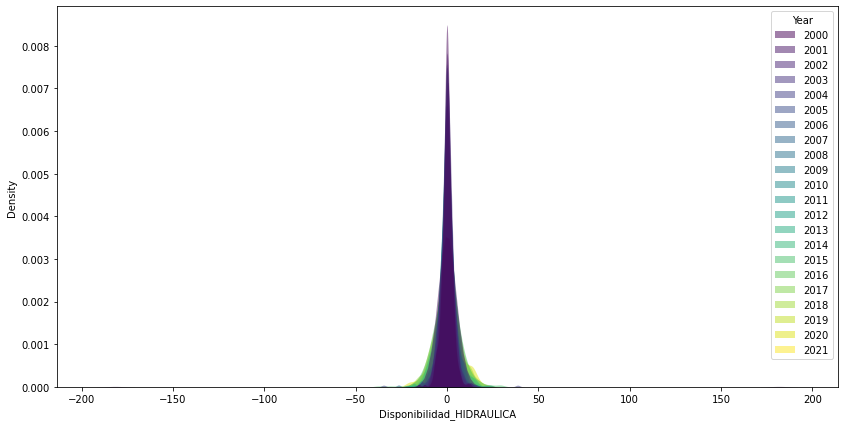

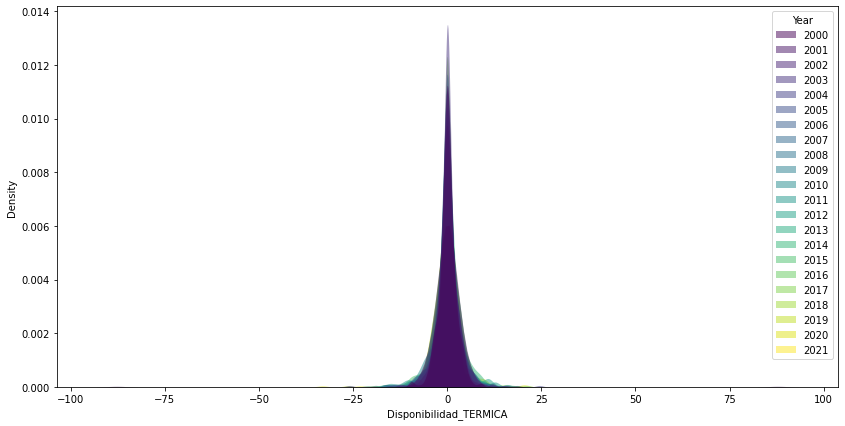

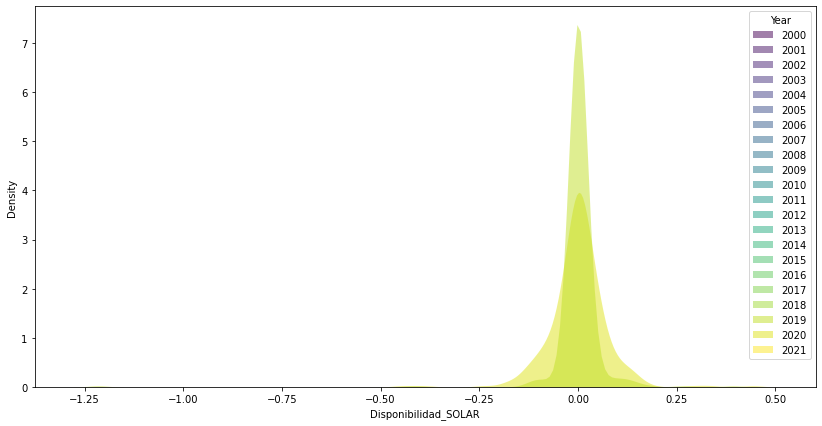

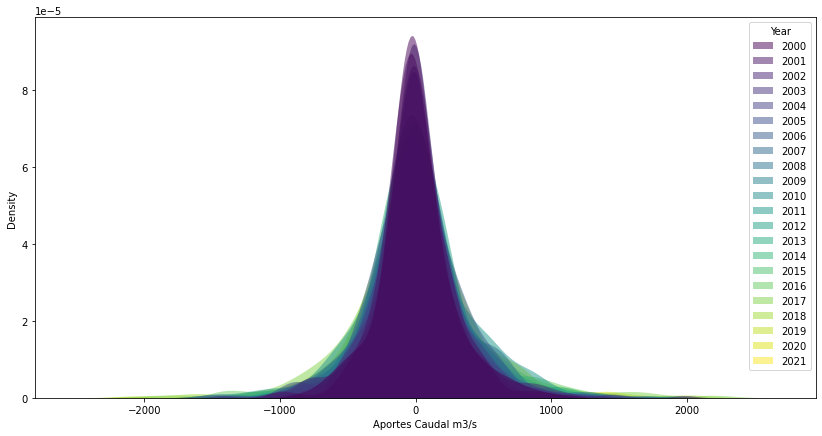

...

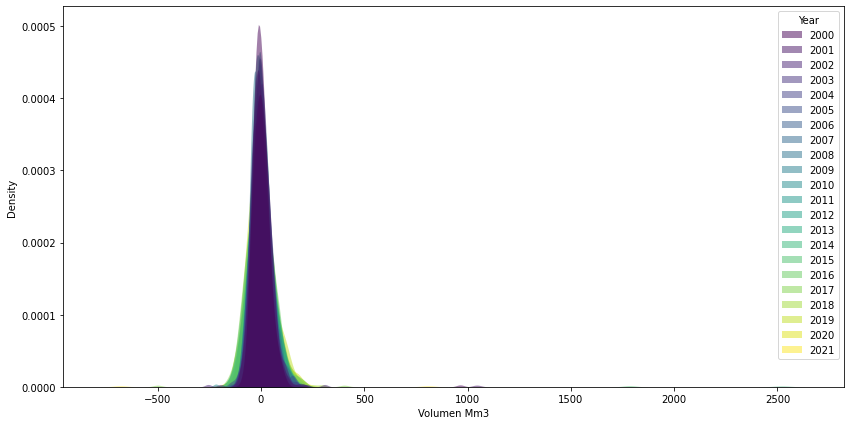

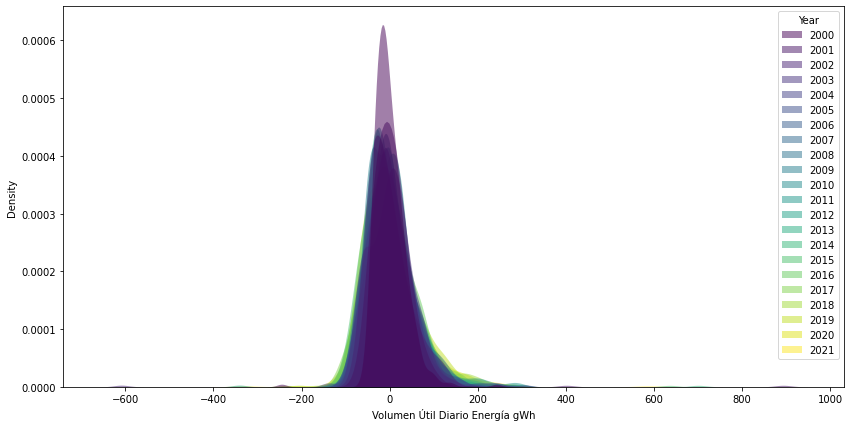

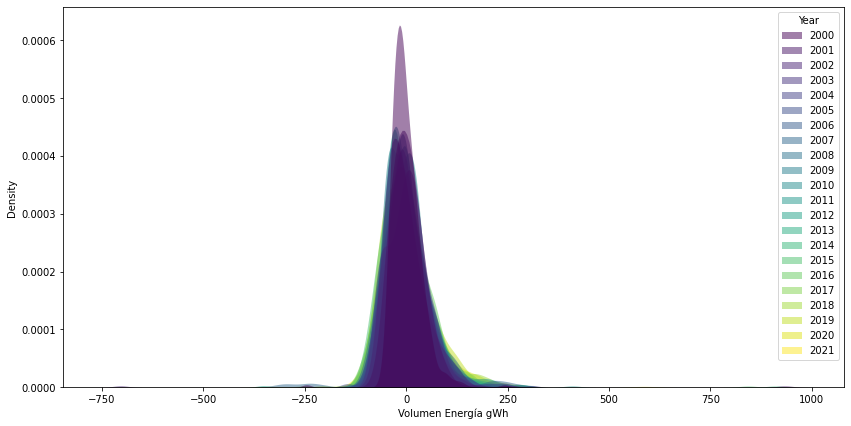

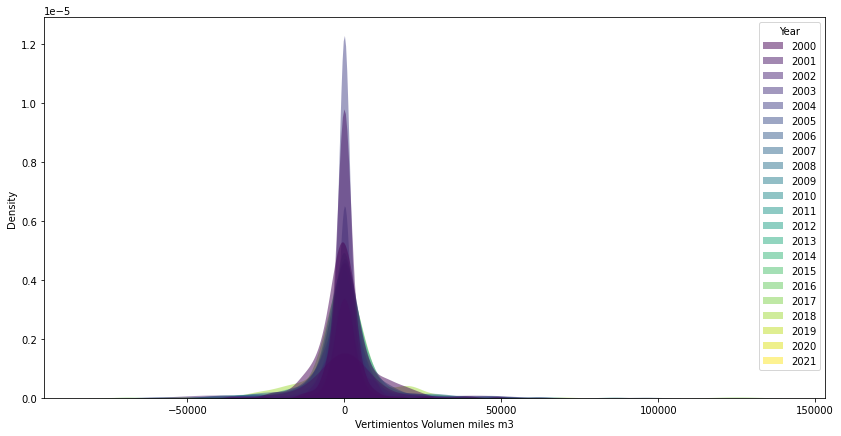

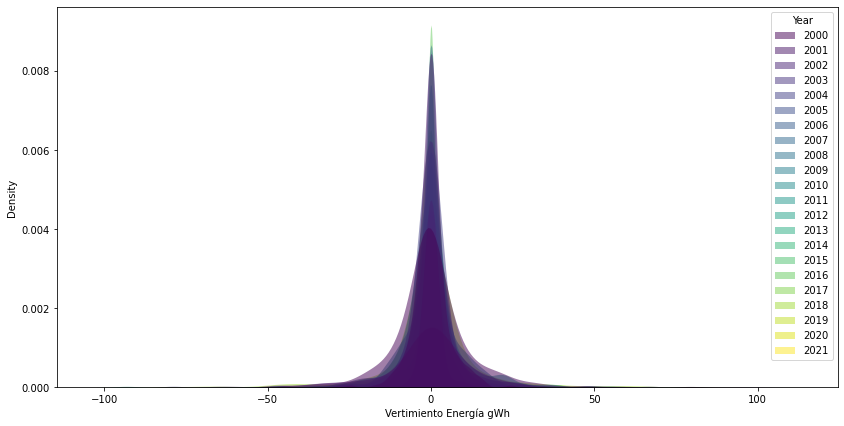

In [ ]:
print('a')
for i in list_to_plot:
  fig, ax = plt.subplots(figsize=(14,7))
  sns.kdeplot(data = df_diff, x=i, hue = 'Year', fill=True, alpha=.5, linewidth=0, palette = 'viridis')

## First Difference Time Series ADF Test:

In [ ]:
from statsmodels.tsa.stattools import adfuller
for i in list_to_plot:
  X = df_diff[i].values
  X = np.nan_to_num(X)
  result = adfuller(X)
  print(i), print('ADF Statistic: %f' % result[0]), print('p-value: %f' % result[1]), print('Critical Values:')
  for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

kW/h price mean
ADF Statistic: -17.408643
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_HIDRAULICA
ADF Statistic: -17.542752
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_TERMICA
ADF Statistic: -22.017038
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_SOLAR
ADF Statistic: -16.006918
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Aportes Caudal m3/s
ADF Statistic: -25.517893
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Aportes Energía gWh
ADF Statistic: -26.584909
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Útil Diario Mm3
ADF Statistic: -11.735317
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Mm3
ADF Statistic: -12.039872
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Útil Diario Energía gWh
ADF Statistic: -9.0184

# Concave Transformation:

In [ ]:
df_log = np.log(df + 1)
df_log['Year'] = df['Year']
df_log['Month'] = df['Month']

## Correlations:

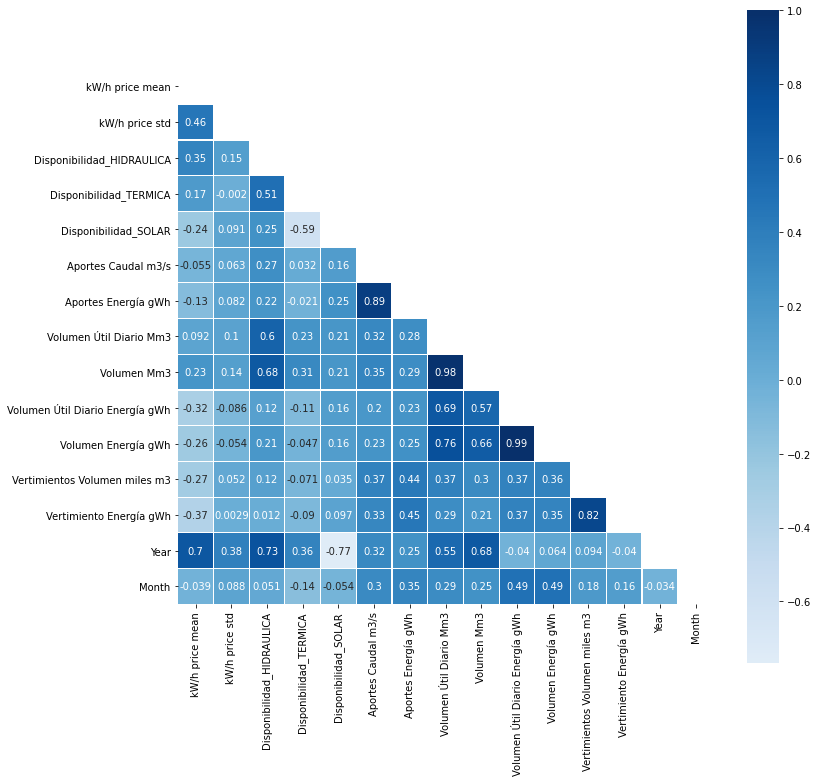

In [ ]:
# Compute the correlation matrix
corr_log = df_log.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr_log, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 12))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_log, mask=mask, cmap='Blues', vmax=1, center=0,
            square=True, linewidths=.1, annot = True)

## Jointplots:

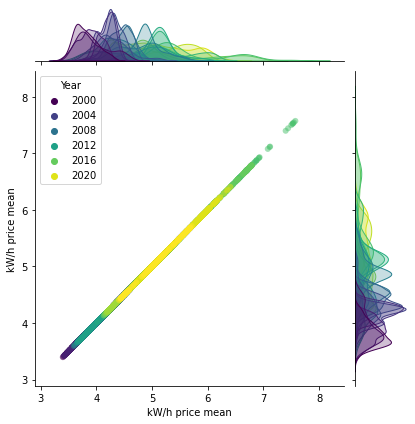

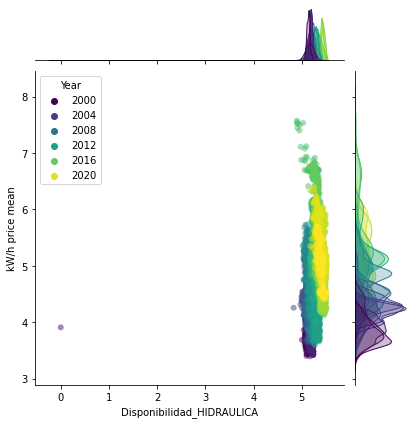

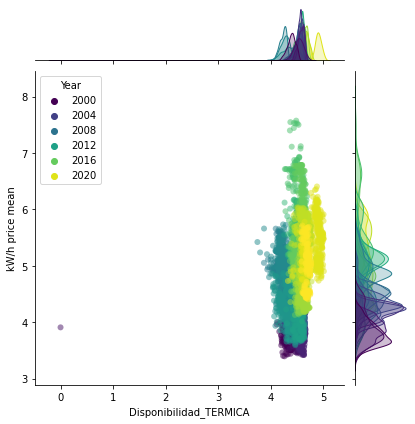

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

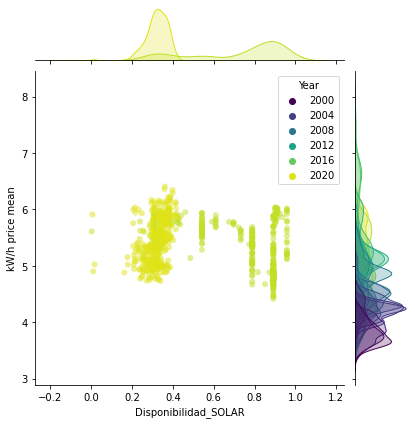

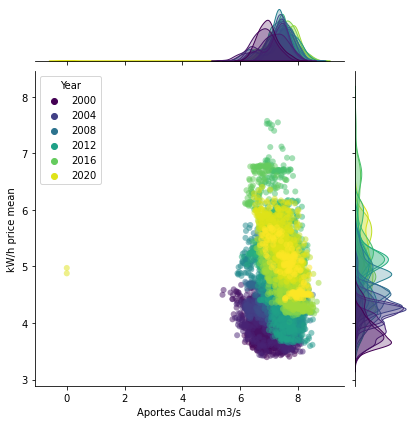

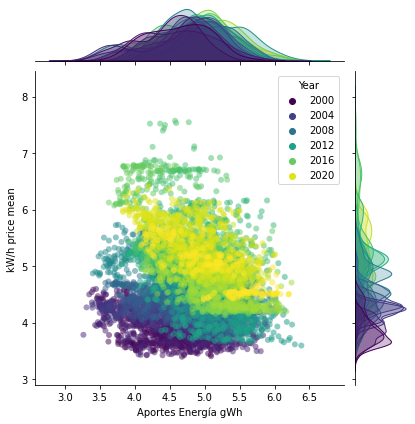

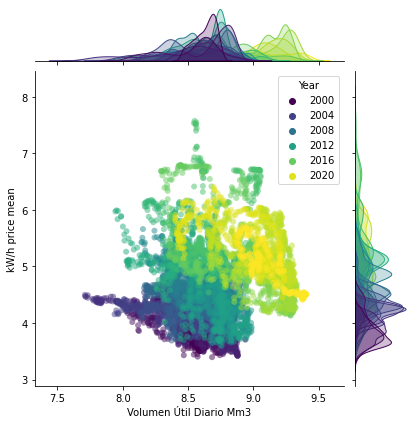

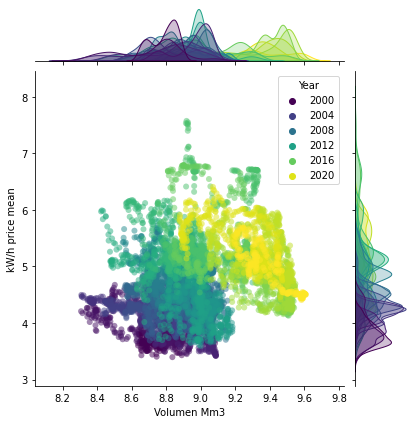

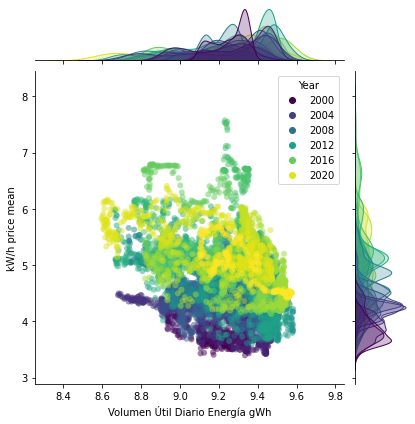

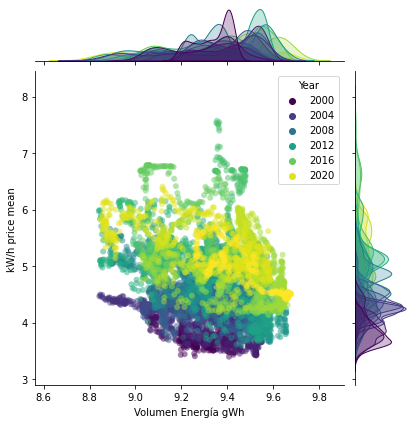

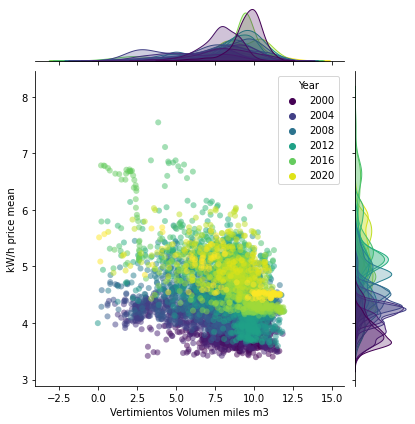

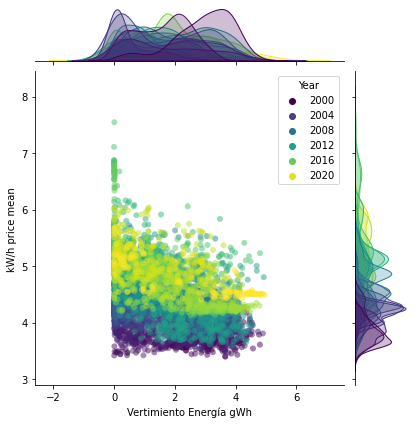

In [ ]:
for i in list_to_plot:
  sns.jointplot(data = df_log, y='kW/h price mean', x = i, hue = 'Year', alpha=.5, linewidth=0, palette = 'viridis')
  plt.show()

## Log plots:

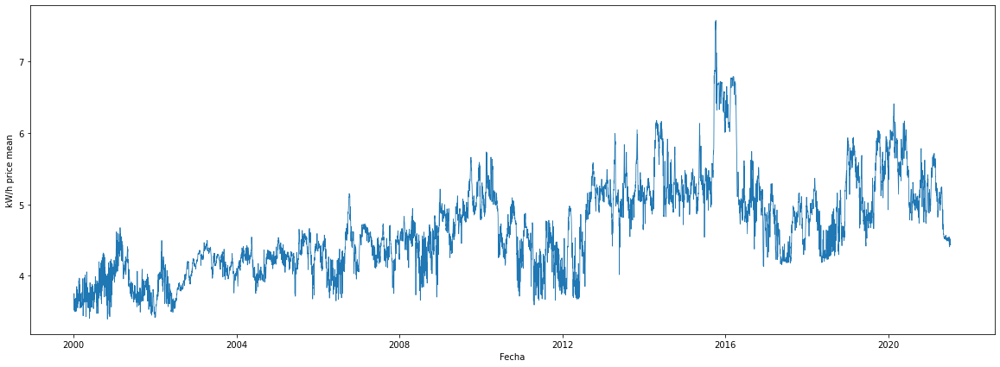

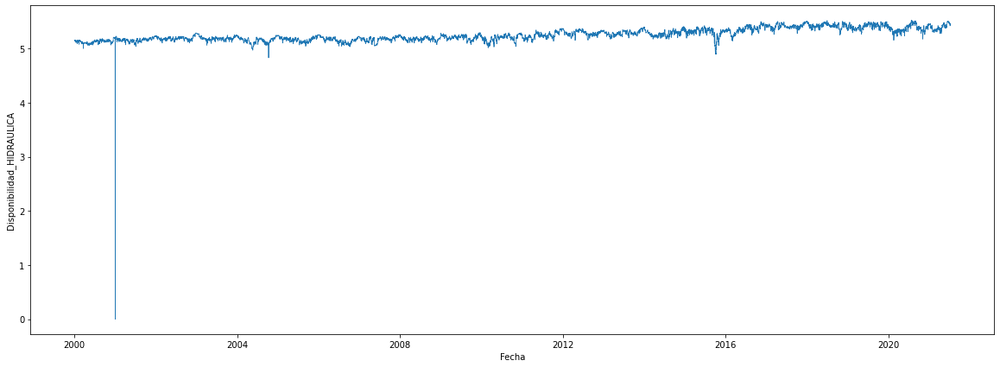

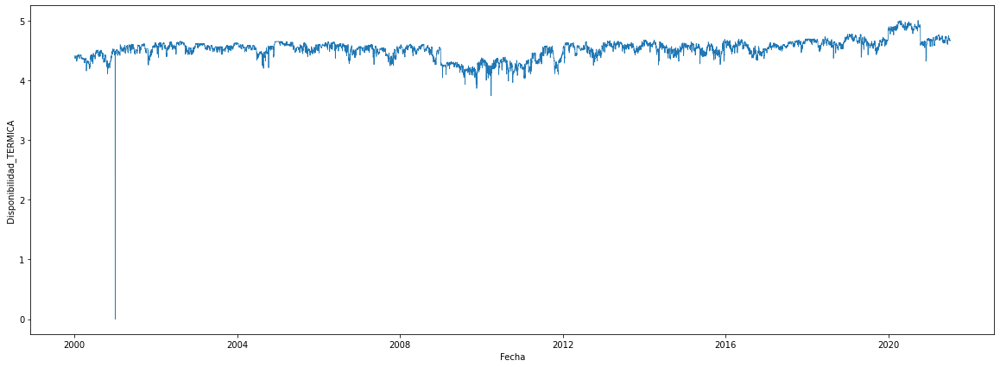

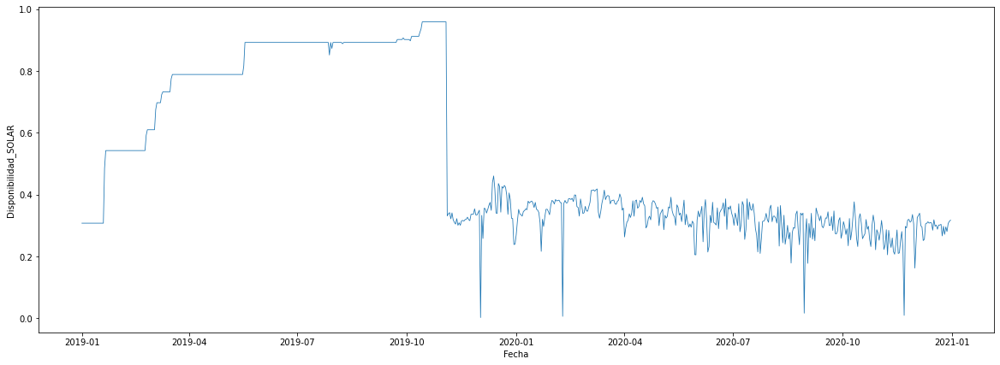

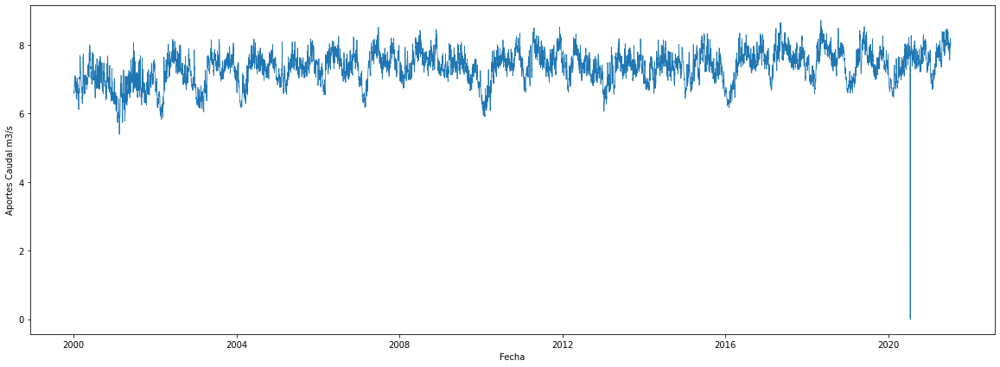

...

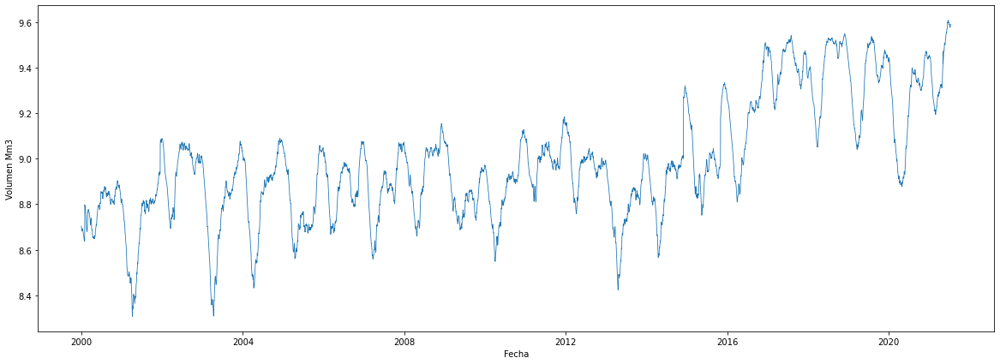

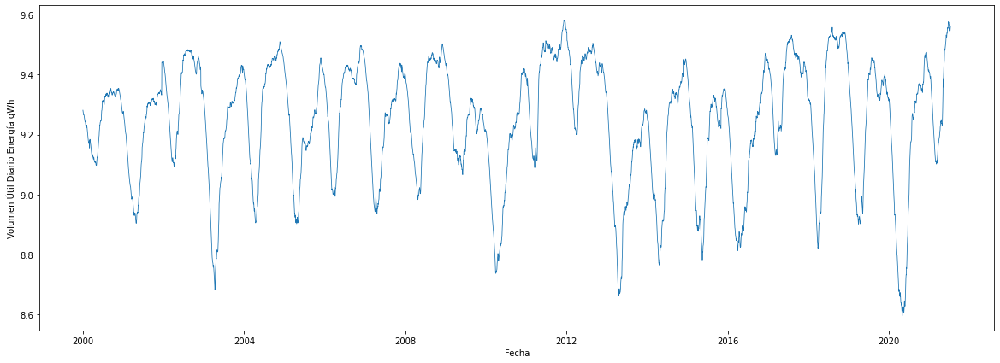

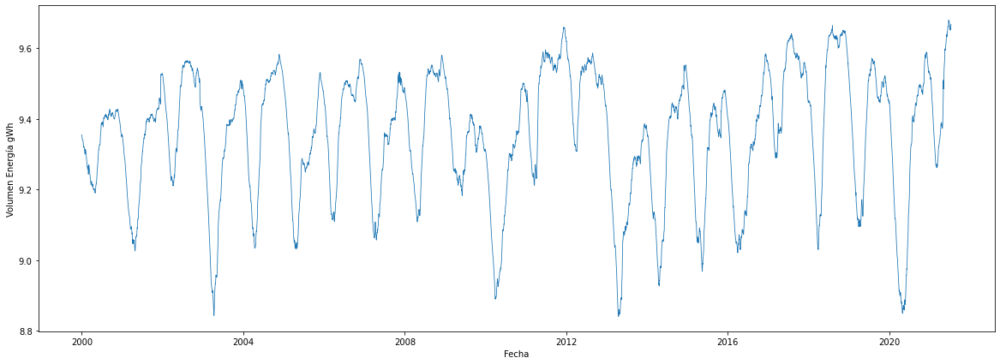

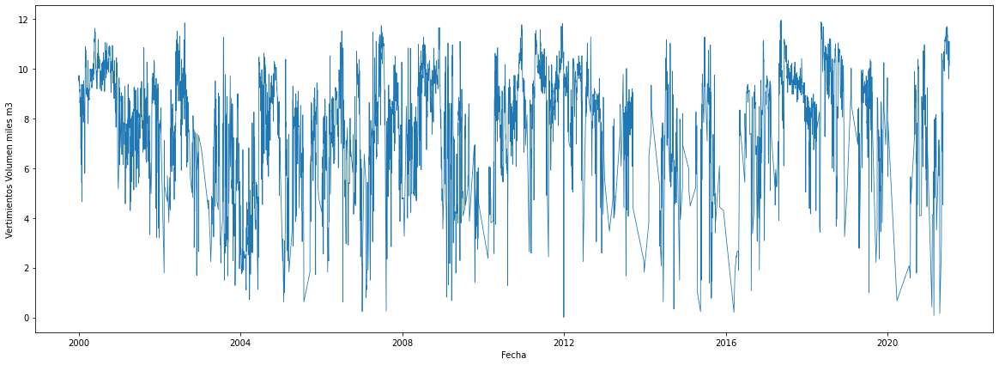

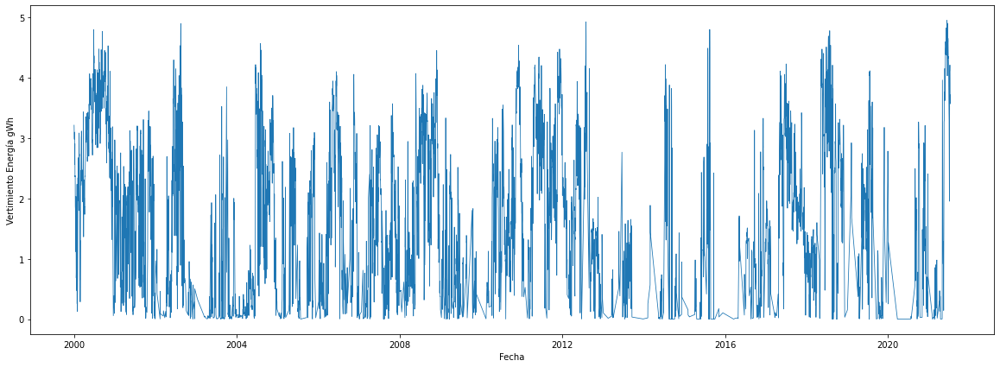

In [ ]:
for i in list_to_plot:
  fig, ax = plt.subplots(figsize=(20,7))
  sns.lineplot(data = df_log, y=i, x = 'Fecha', linewidth=.8)
  plt.show()

## Log Density Functions:

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

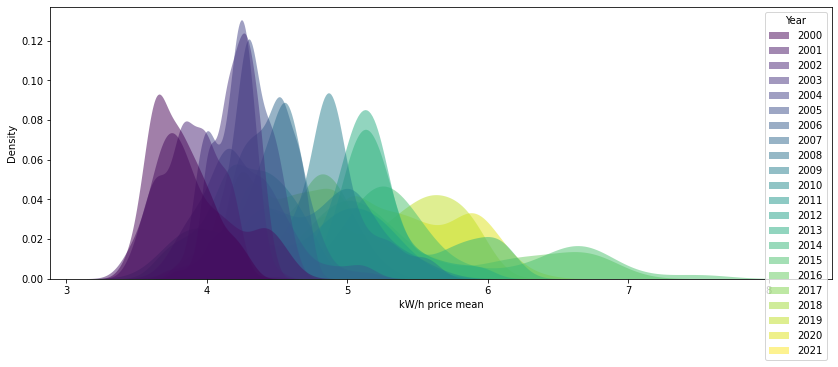

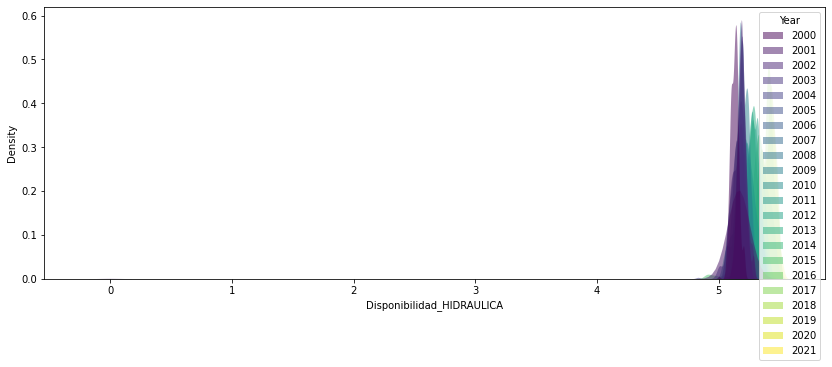

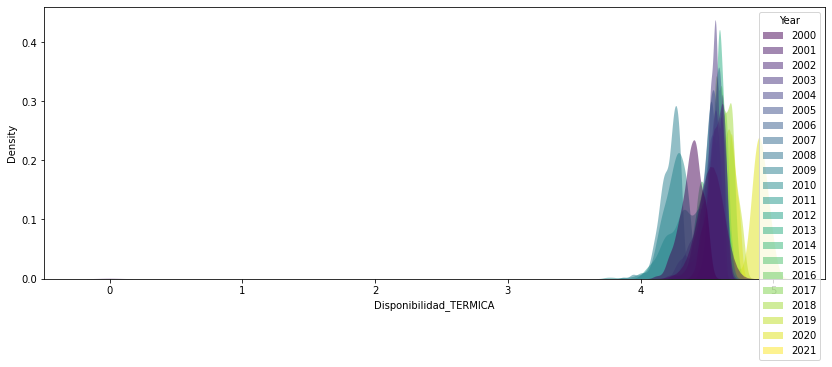

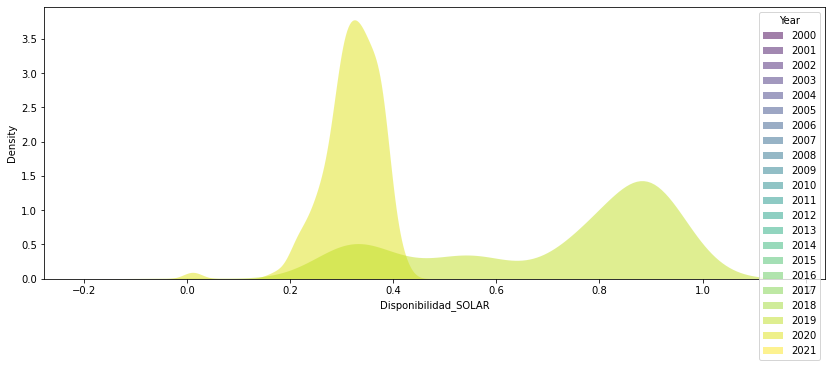

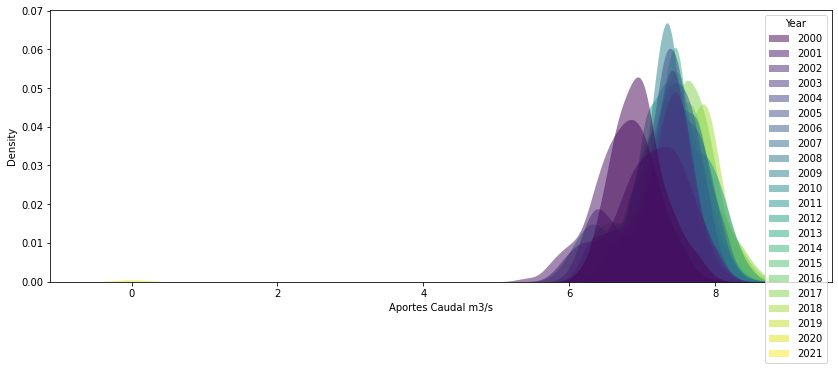

...

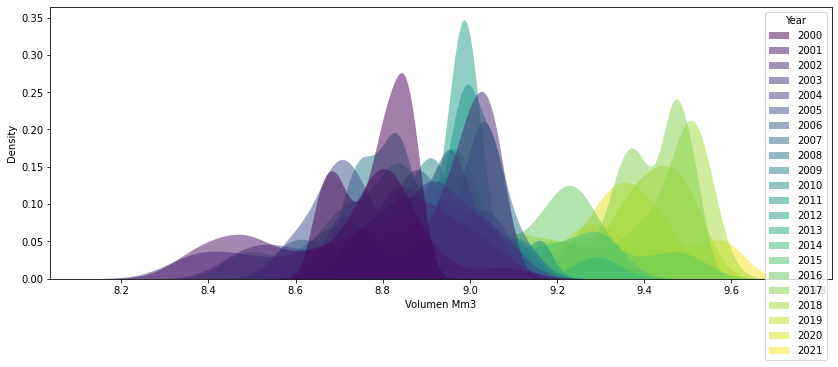

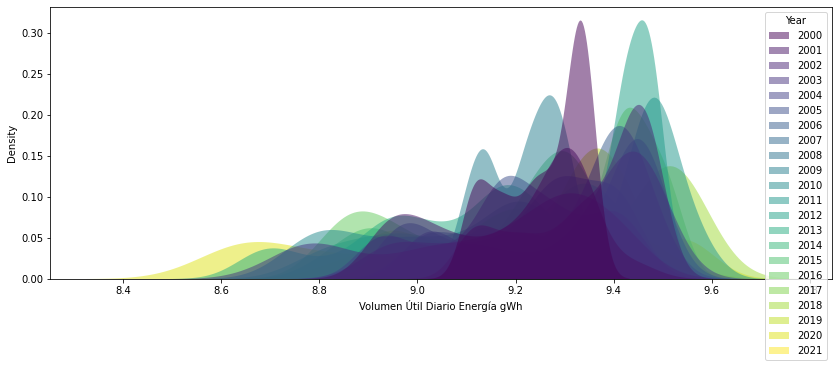

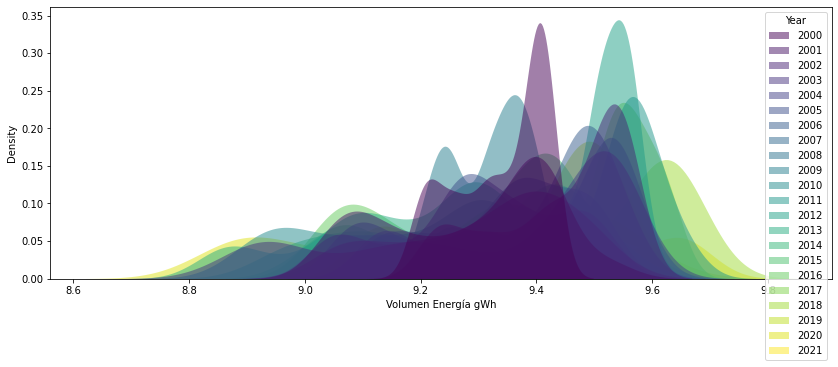

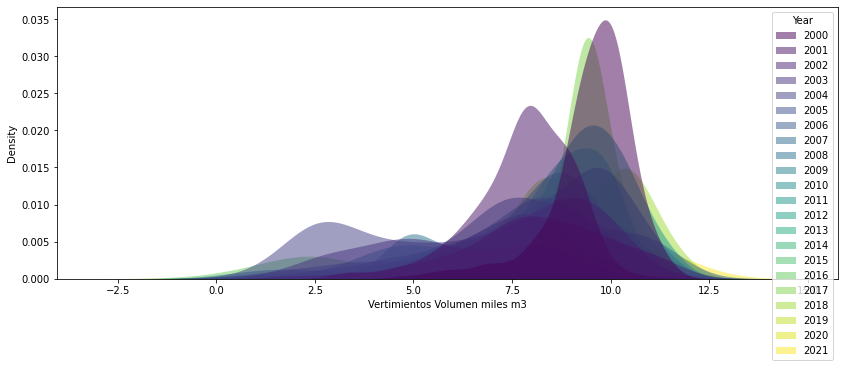

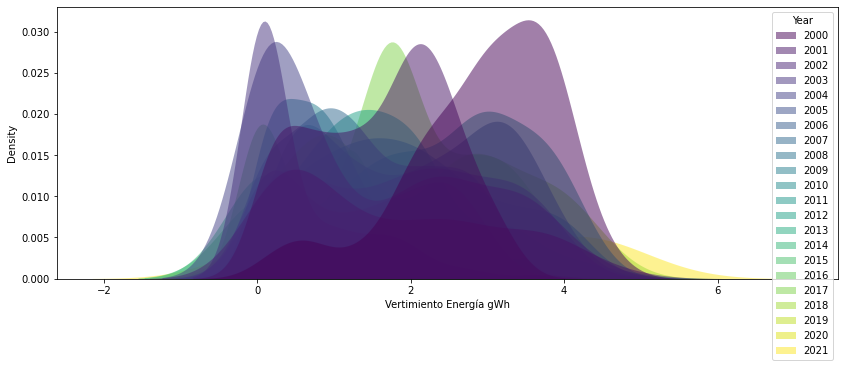

In [ ]:
for i in list_to_plot:
  fig, ax = plt.subplots(figsize=(14,5))
  sns.kdeplot(data = df_log, x=i, hue = 'Year', fill=True, alpha=.5, linewidth=0, palette = 'viridis')

## Log ADF Tests:

In [ ]:
for i in list_to_plot:
  X = df_log[i].fillna(0)
  result = adfuller(X)
  print(i), print('ADF Statistic: %f' % result[0]), print('p-value: %f' % result[1]), print('Critical Values:')
  for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

kW/h price mean
ADF Statistic: -4.166376
p-value: 0.000751
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_HIDRAULICA
ADF Statistic: -3.588113
p-value: 0.005992
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_TERMICA
ADF Statistic: -4.766252
p-value: 0.000063
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_SOLAR
ADF Statistic: -2.737266
p-value: 0.067809
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Aportes Caudal m3/s
ADF Statistic: -7.182758
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Aportes Energía gWh
ADF Statistic: -7.326371
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Útil Diario Mm3
ADF Statistic: -6.363663
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Mm3
ADF Statistic: -5.142287
p-value: 0.000012
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Útil Diario Energía gWh
ADF Statistic: -8.771637
p-val

# Time Series Decomposition:

a


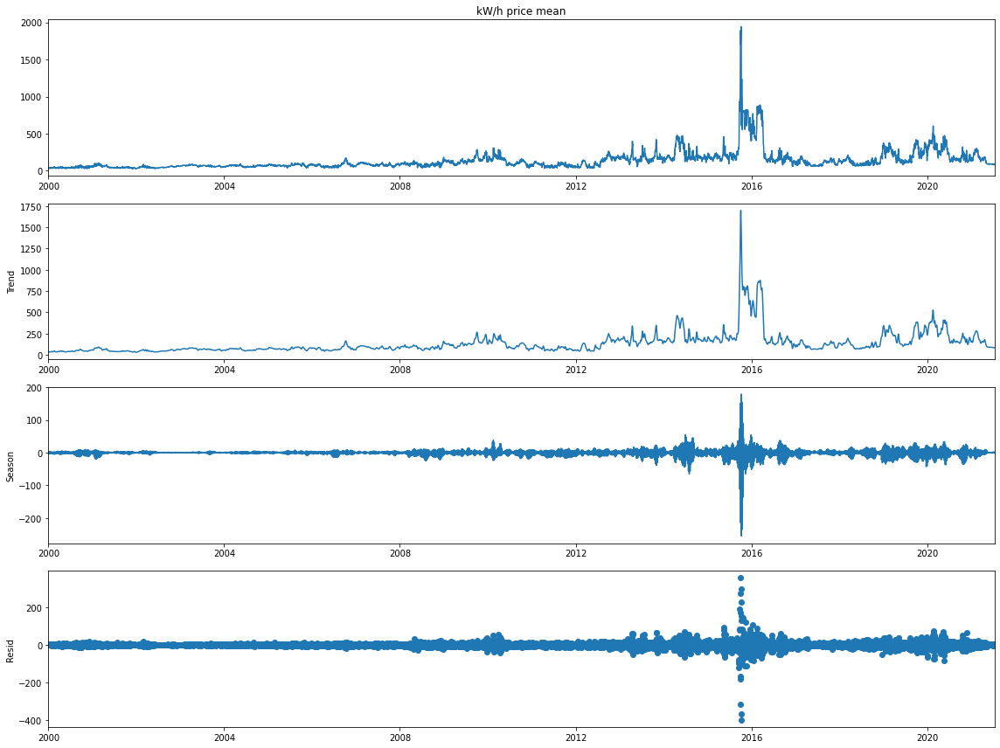

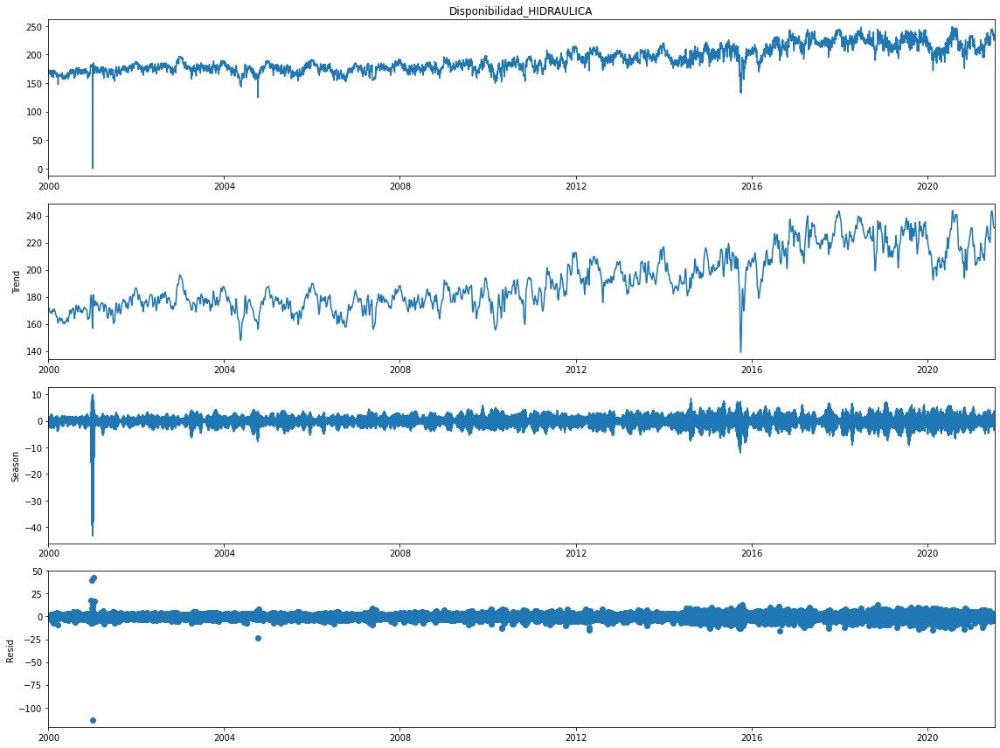

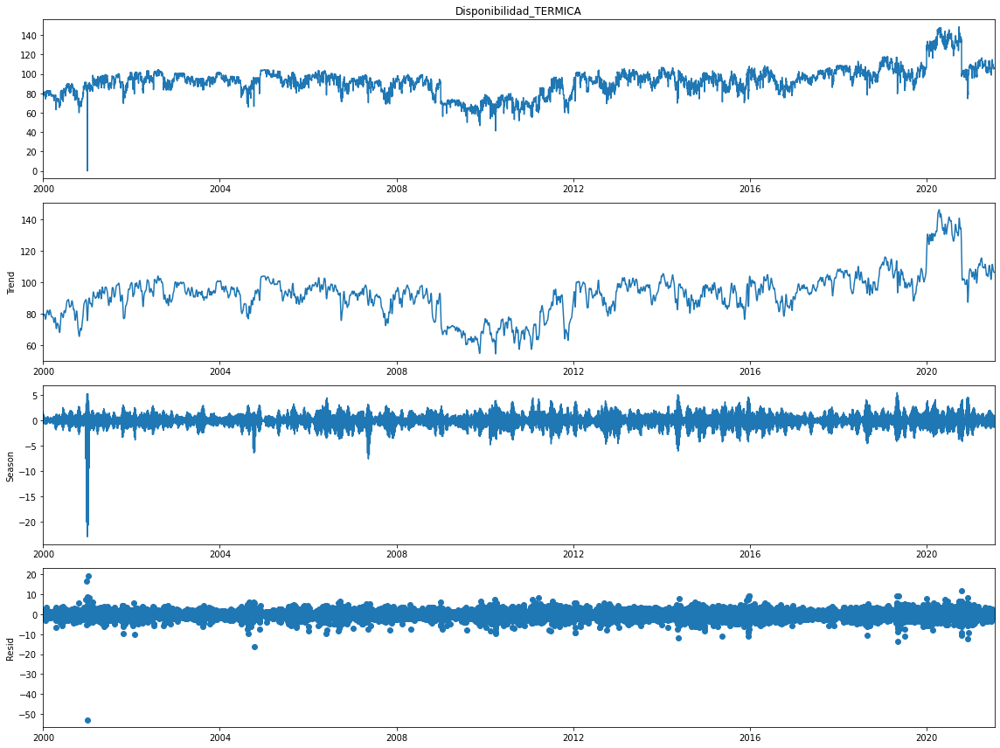

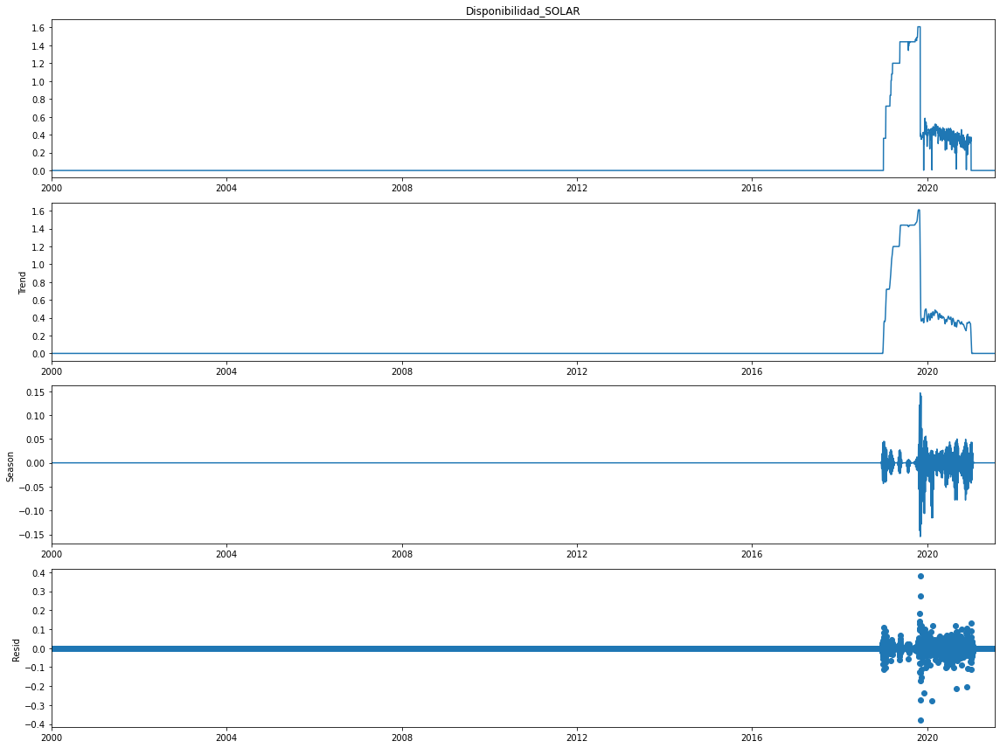

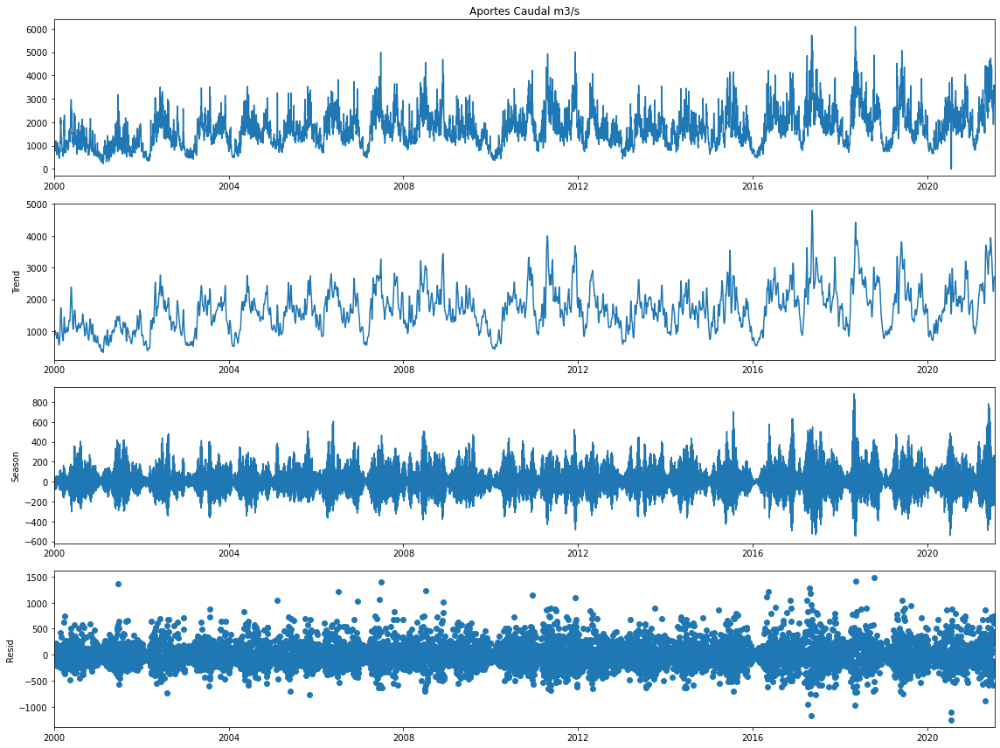

...

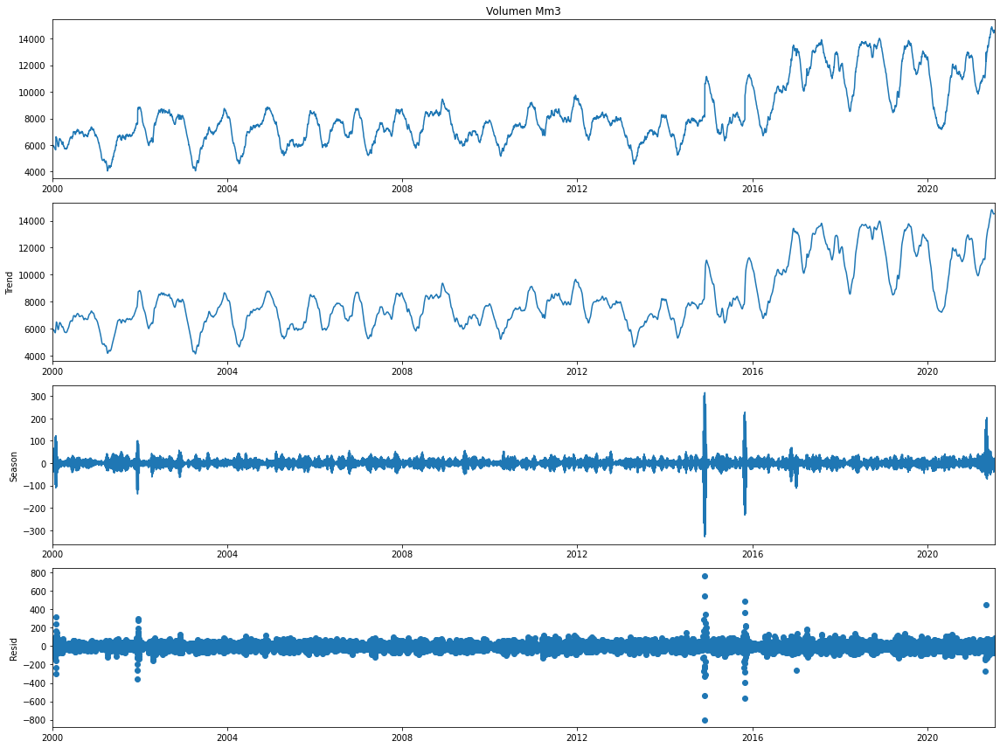

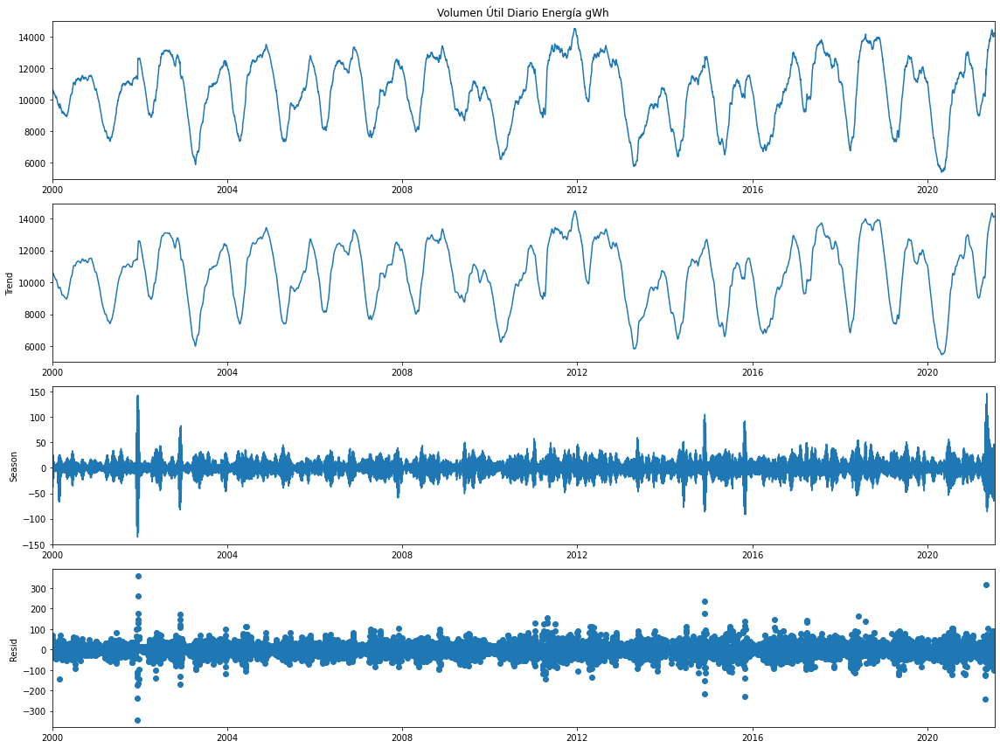

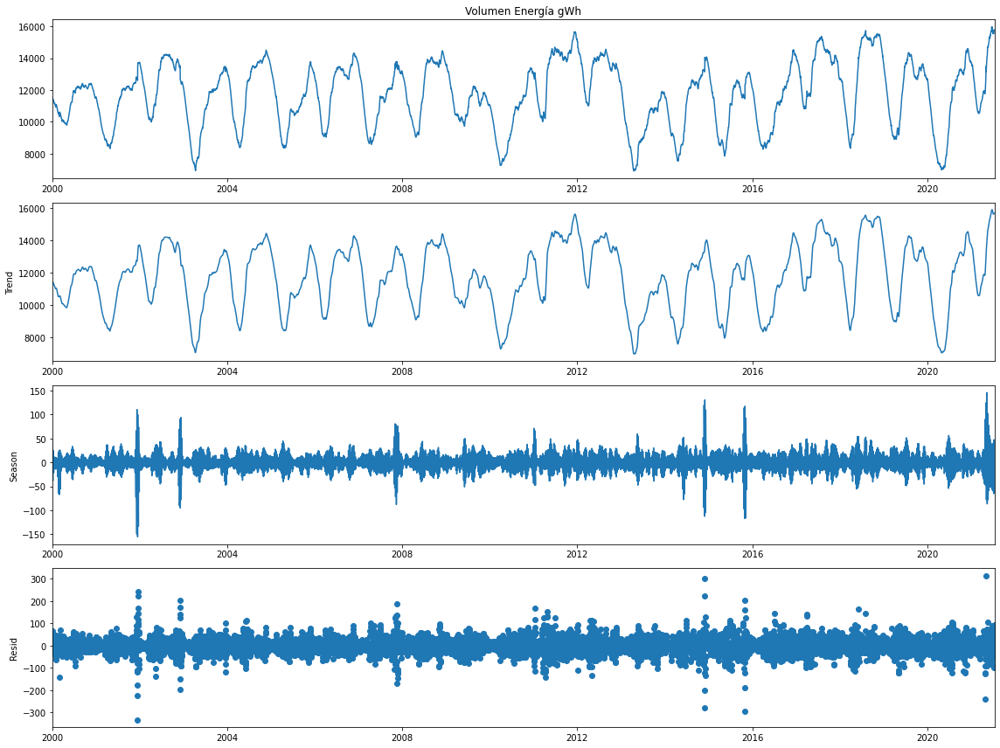

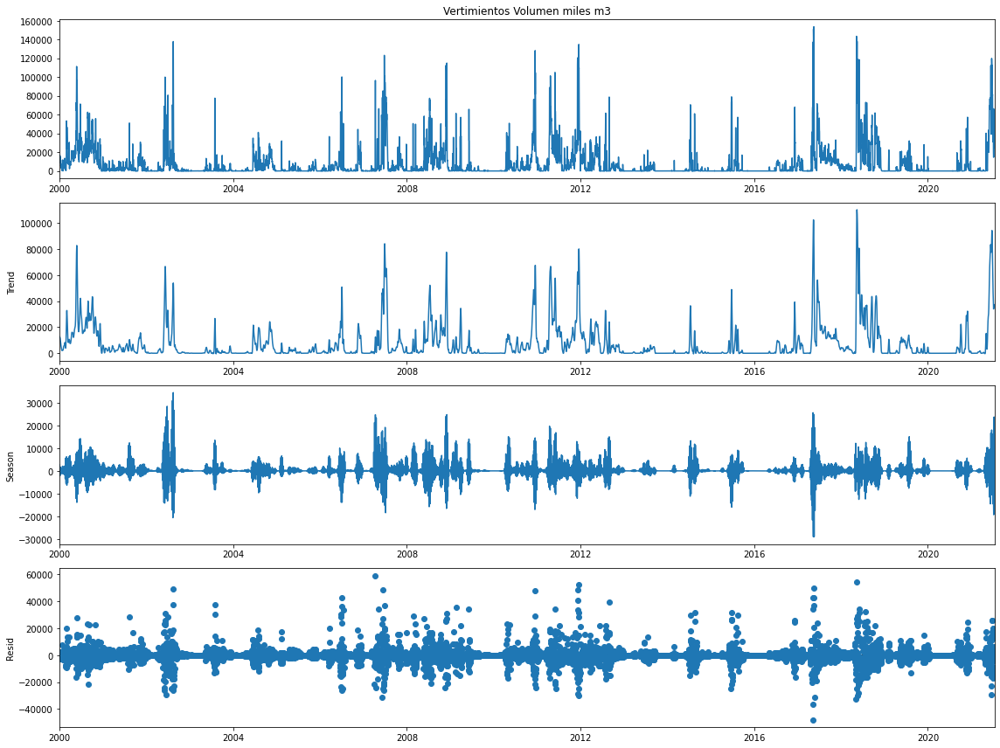

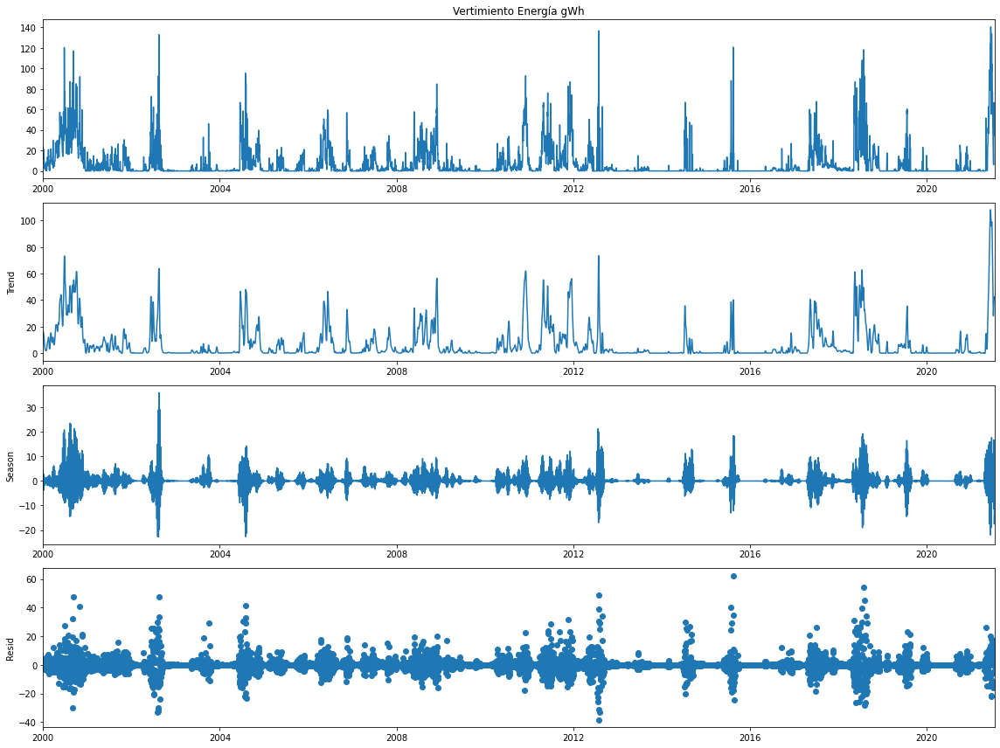

In [ ]:
print('a')
from statsmodels.tsa.seasonal import STL
for i in list_to_plot:
  plt.rc('figure',figsize=(16,12))
  plt.rc('font',size=10)
  Y = df[i].fillna(0)
  stl = STL(Y)
  res = stl.fit()
  fig = res.plot()

## qq plots: Original series vs First Difference:

### qq plots Original Series

a


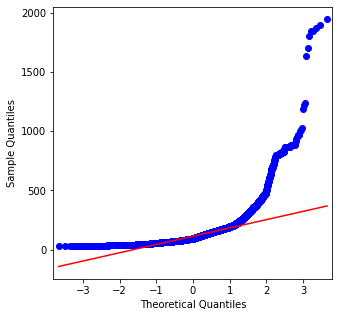

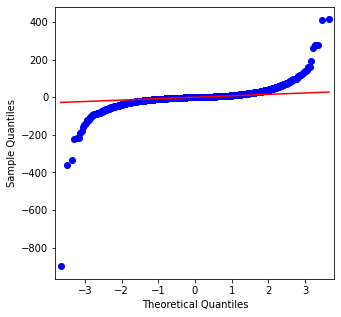

kW/h price mean


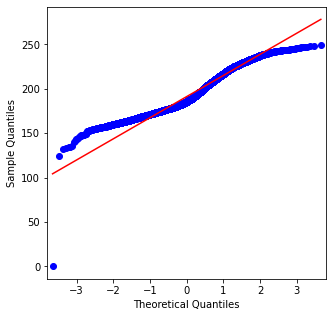

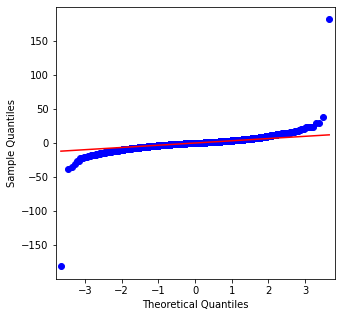

Disponibilidad_HIDRAULICA


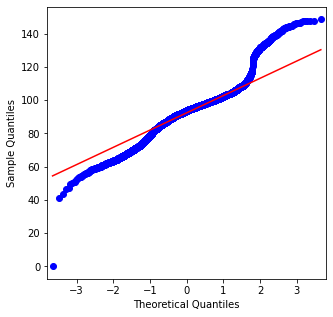

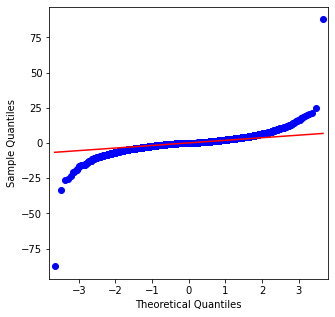

Disponibilidad_TERMICA


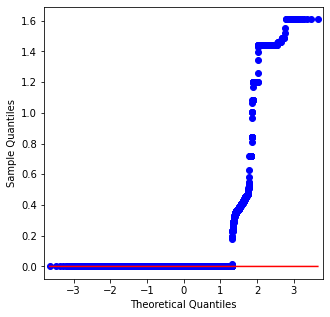

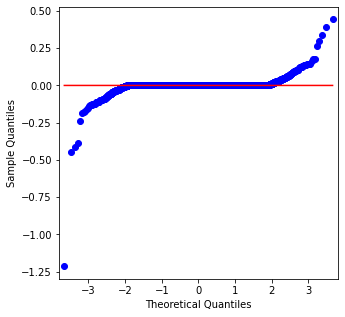

Disponibilidad_SOLAR


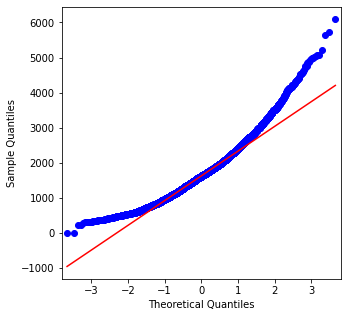

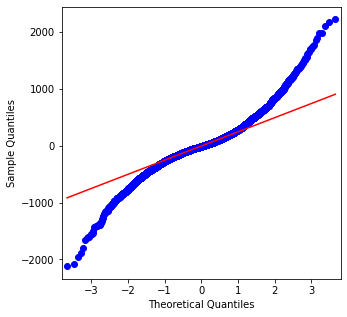

Aportes Caudal m3/s


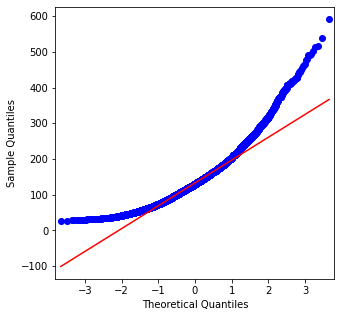

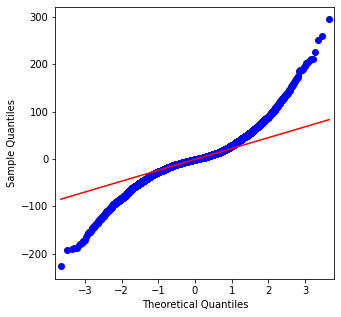

Aportes Energía gWh


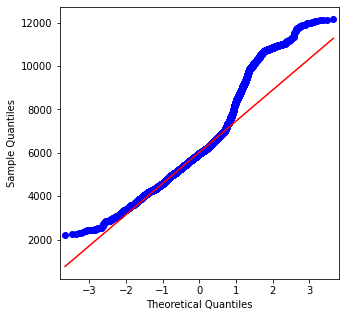

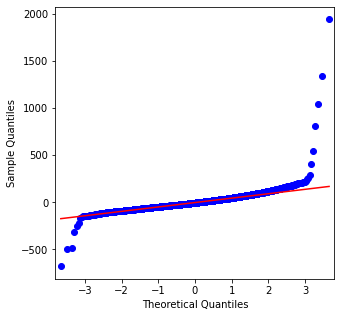

Volumen Útil Diario Mm3


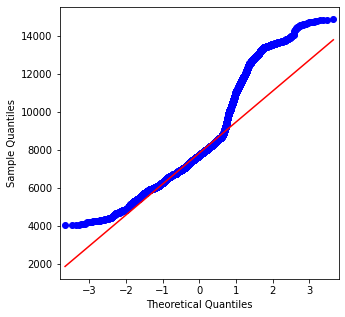

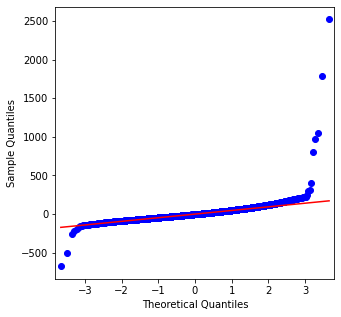

Volumen Mm3


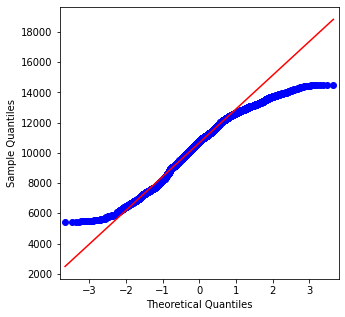

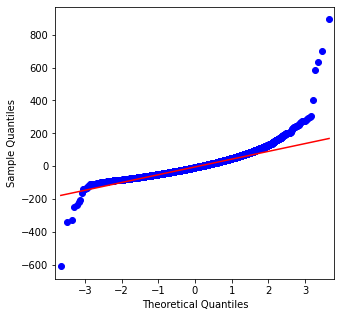

Volumen Útil Diario Energía gWh


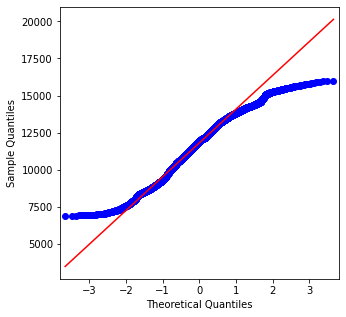

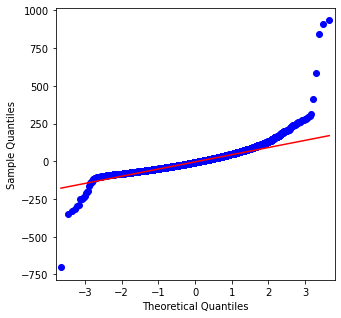

Volumen Energía gWh


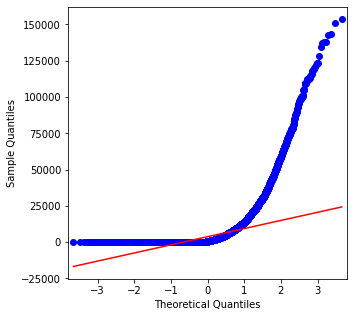

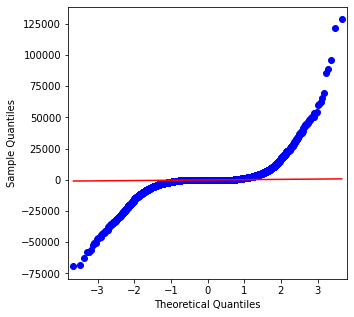

Vertimientos Volumen miles m3


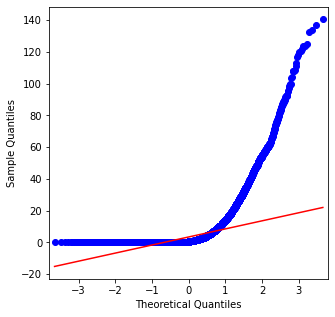

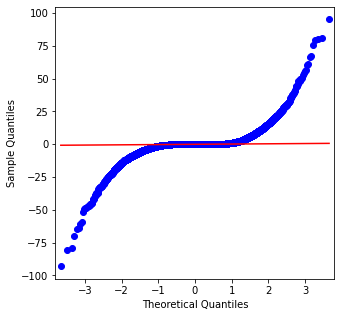

Vertimiento Energía gWh


In [ ]:
print('a')
from statsmodels.graphics.gofplots import qqplot
for i in list_to_plot:
  Y = df[i].fillna(0)
  X = df_diff[i].fillna(0)
  plt.rc('figure',figsize=(5,5), )
  #stl = STL(Y)
  #res = stl.fit()
  qqplot(Y, line='q')
  #qqplot(res.resid, line='q')
  qqplot(X, line='q')
  plt.show()
  print(i)

### qq plots First Difference:

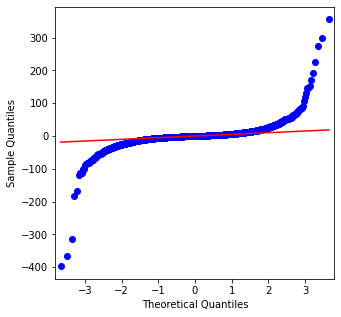

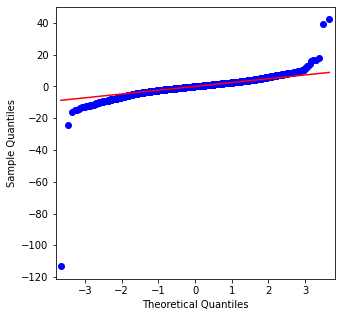

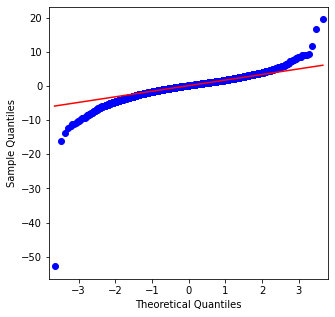

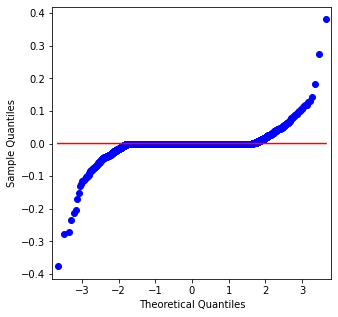

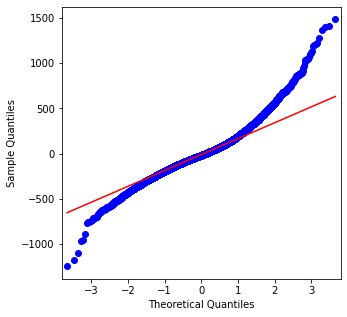

...

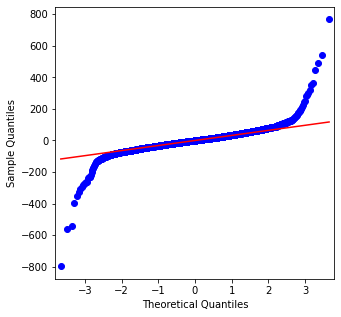

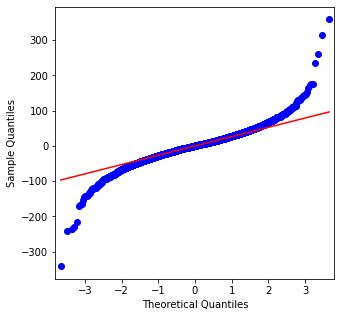

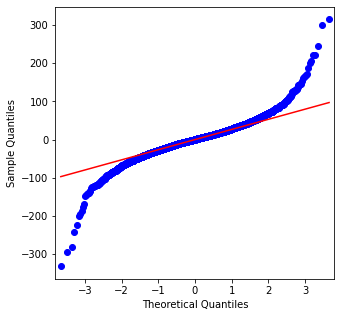

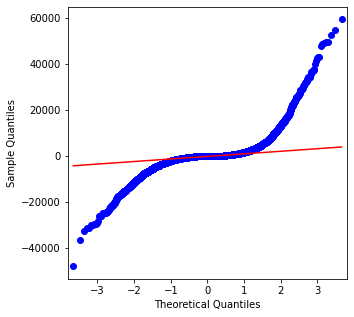

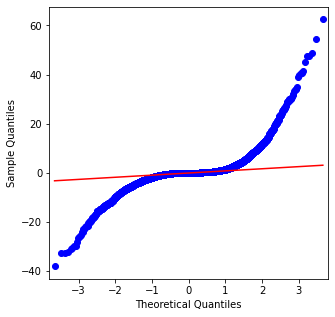

In [ ]:
from statsmodels.graphics.gofplots import qqplot
for i in list_to_plot:
  Y = df[i].fillna(0)
  plt.rc('figure',figsize=(5,5), )
  stl = STL(Y)
  res = stl.fit()
  qqplot(res.resid, line='q')
  plt.show()

## First Difference Lag Plots:

kW/h price mean


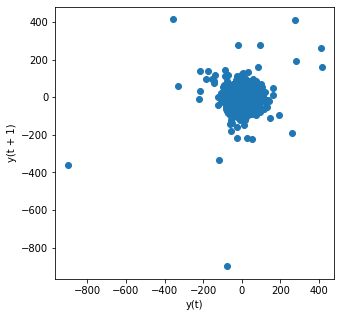

Disponibilidad_HIDRAULICA


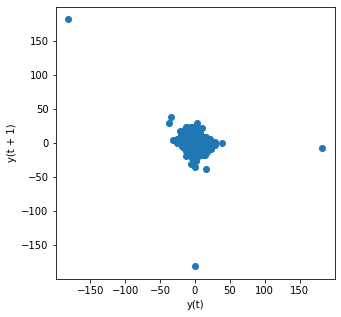

Disponibilidad_TERMICA


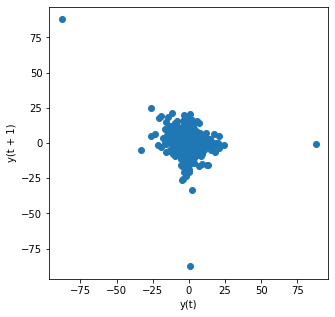

Disponibilidad_SOLAR


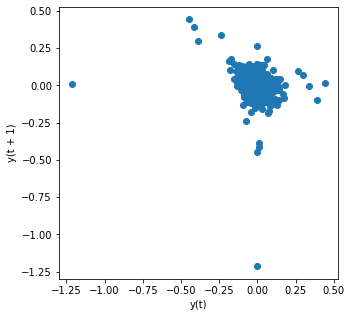

Aportes Caudal m3/s


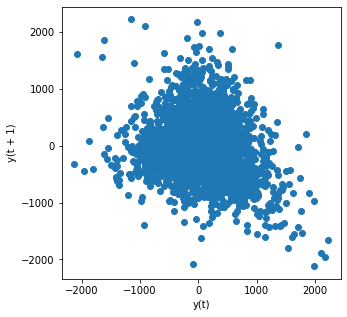

Aportes Energía gWh


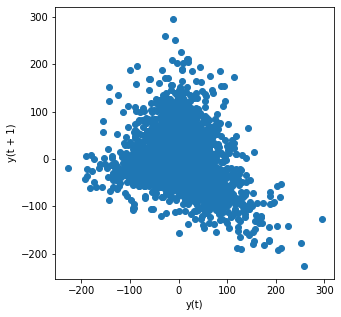

Volumen Útil Diario Mm3


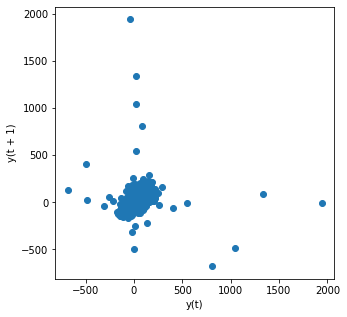

Volumen Mm3


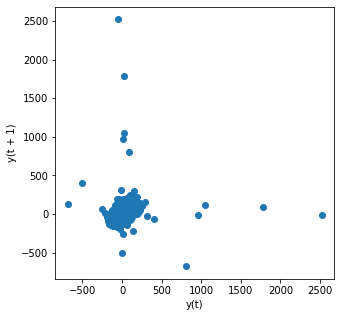

Volumen Útil Diario Energía gWh


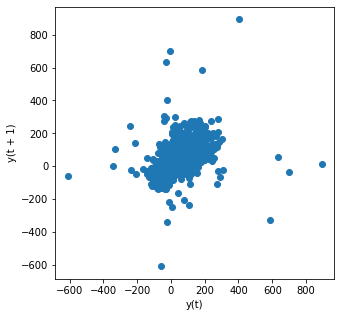

Volumen Energía gWh


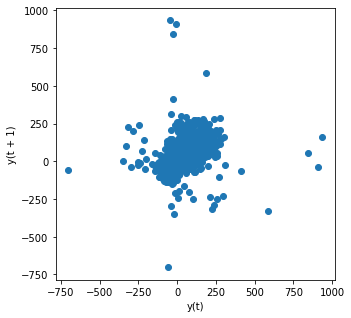

Vertimientos Volumen miles m3


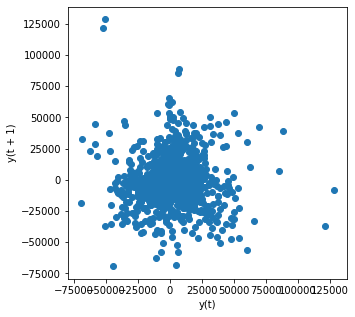

Vertimiento Energía gWh


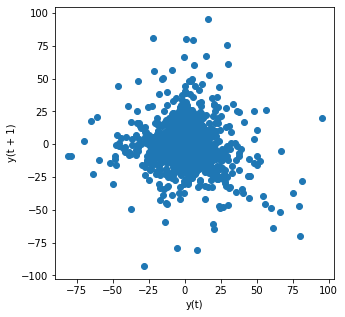

In [ ]:
from pandas.plotting import lag_plot
for i in list_to_plot:
  print(i)
  lag_plot(df_diff[i])
  plt.show()

# Models:

## Autocorrelation Plot:

In [ ]:
from pandas.plotting import autocorrelation_plot

Autocorrelation calculates the strength of the relationship between an observation and observa- tions at prior time steps. We can calculate the autocorrelation of the residual error time series and plot the results. This is called an autocorrelation plot. 

The x-axis shows the lag and the y-axis shows the correlation between an observation and the lag variable, where correlation values are between -1 and 1 for negative and positive correlations respectively.


kW/h price mean


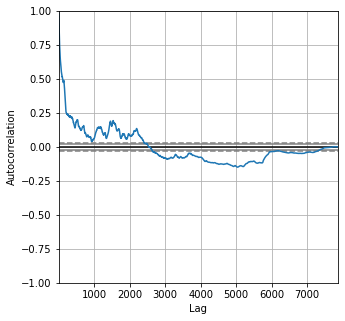

Disponibilidad_HIDRAULICA


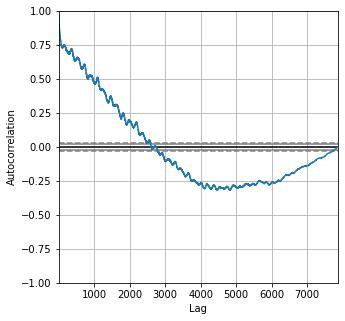

Disponibilidad_TERMICA


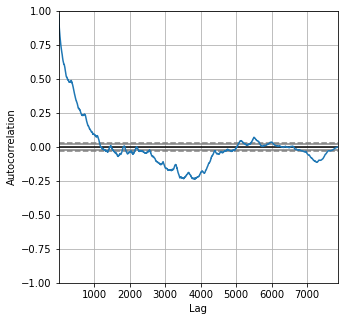

Disponibilidad_SOLAR


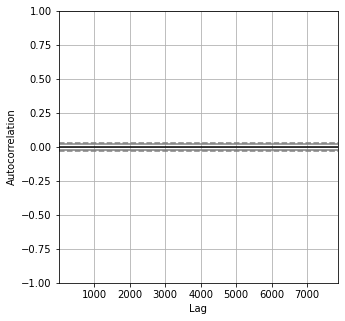

Aportes Caudal m3/s


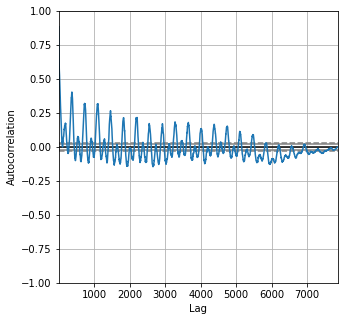

Aportes Energía gWh


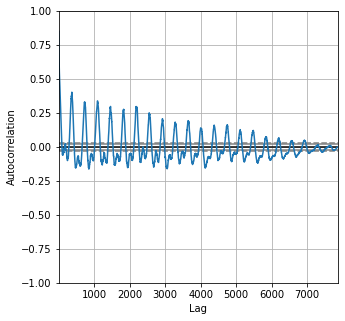

Volumen Útil Diario Mm3


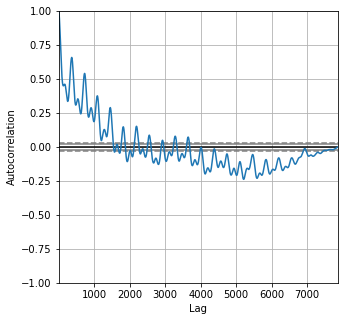

Volumen Mm3


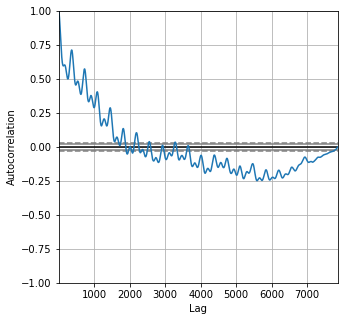

Volumen Útil Diario Energía gWh


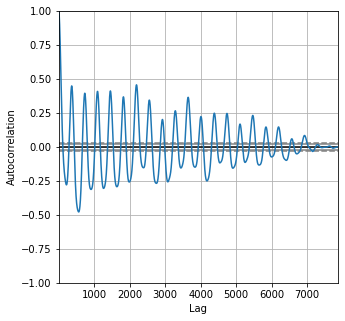

Volumen Energía gWh


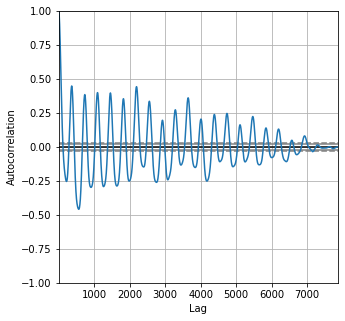

Vertimientos Volumen miles m3


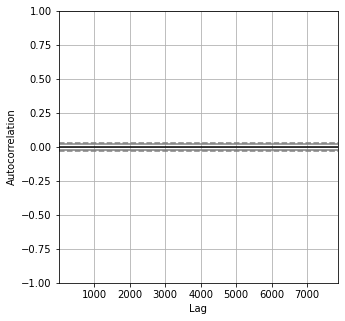

Vertimiento Energía gWh


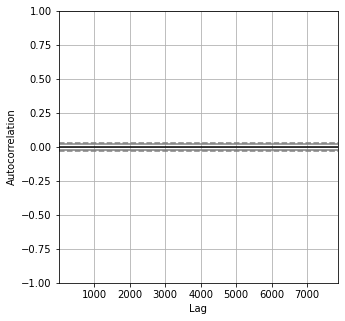

In [ ]:
for i in list_to_plot:
  autocorrelation_plot(df[i])
  print(i)
  plt.show()

kW/h price mean


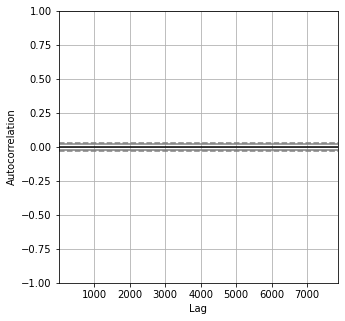

Disponibilidad_HIDRAULICA


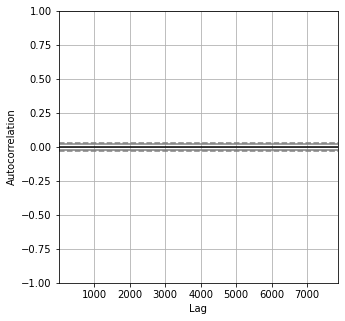

Disponibilidad_TERMICA


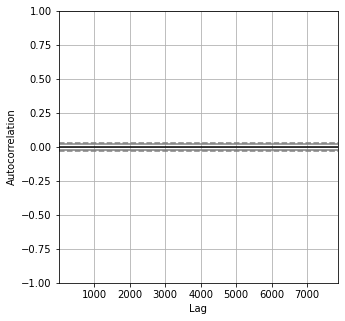

Disponibilidad_SOLAR


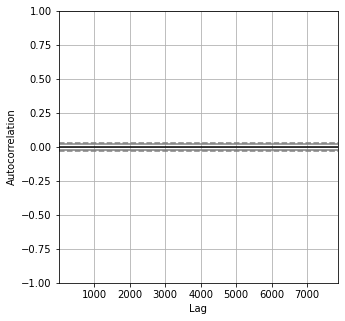

Aportes Caudal m3/s


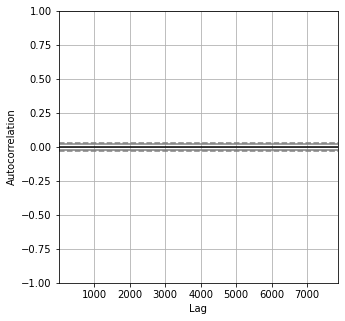

Aportes Energía gWh


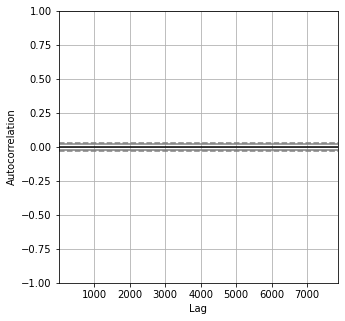

Volumen Útil Diario Mm3


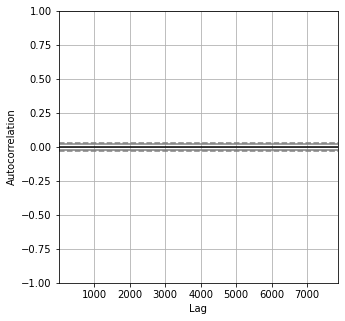

Volumen Mm3


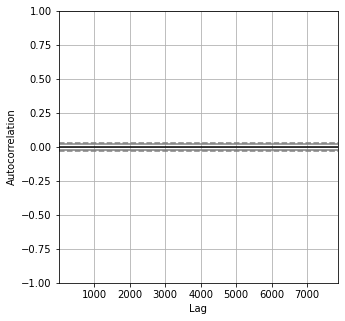

Volumen Útil Diario Energía gWh


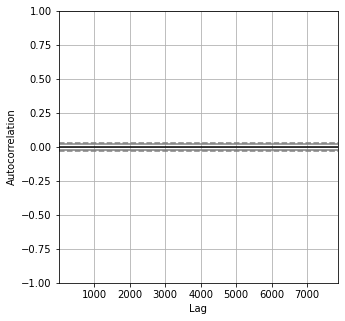

Volumen Energía gWh


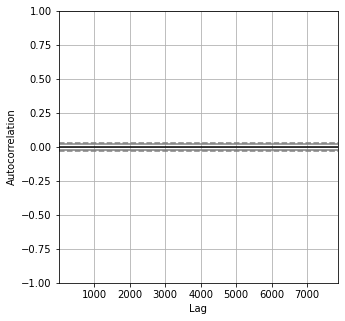

Vertimientos Volumen miles m3


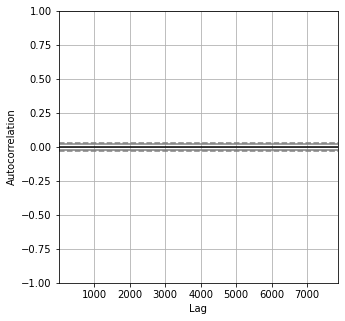

Vertimiento Energía gWh


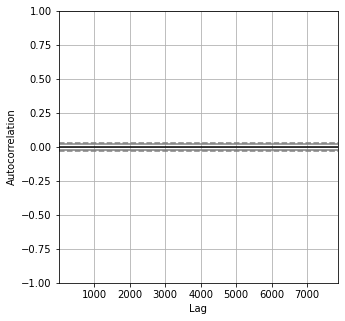

In [ ]:
for i in list_to_plot:
  autocorrelation_plot(df_diff[i])
  print(i)
  plt.show()

## Autocorrelation Function:

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf

We can calculate the correlation for time series observations with observations with previous time steps, called lags. Because the correlation of the time series observations is calculated with values of the same series at previous times, this is called a serial correlation, or an autocorrelation. 

A plot of the autocorrelation of a time series by lag is called the AutoCorrelation Function, or the acronym ACF. This plot is sometimes called a correlogram or an autocorrelation plot.

kW/h price mean


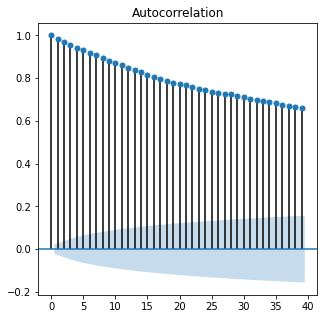

Disponibilidad_HIDRAULICA


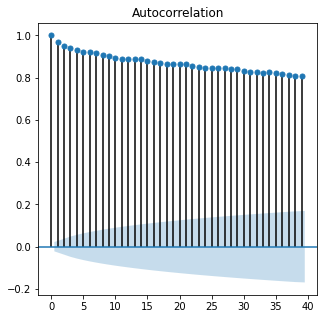

Disponibilidad_TERMICA


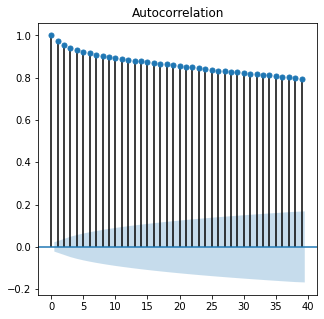

Disponibilidad_SOLAR


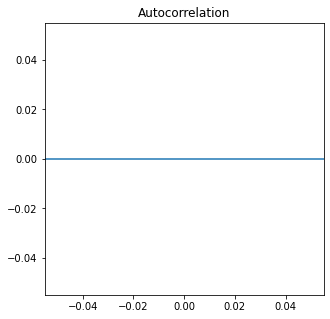

Aportes Caudal m3/s


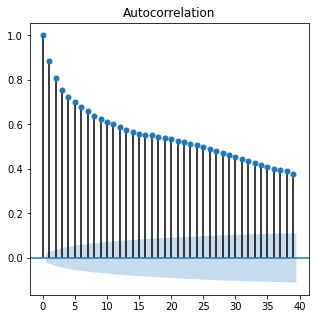

Aportes Energía gWh


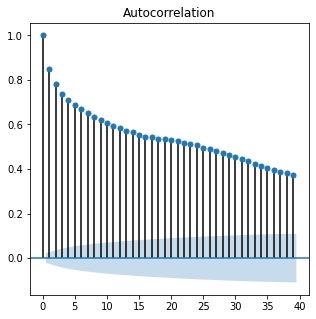

Volumen Útil Diario Mm3


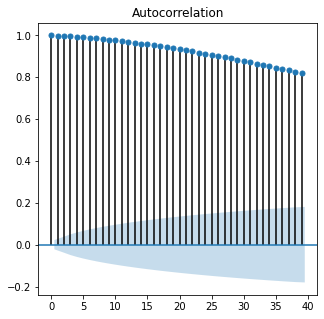

Volumen Mm3


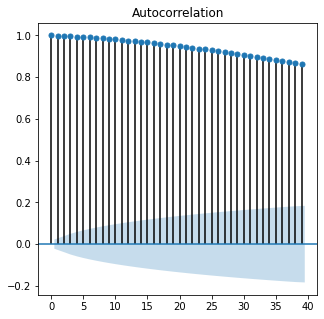

Volumen Útil Diario Energía gWh


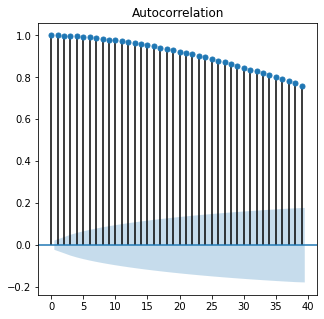

Volumen Energía gWh


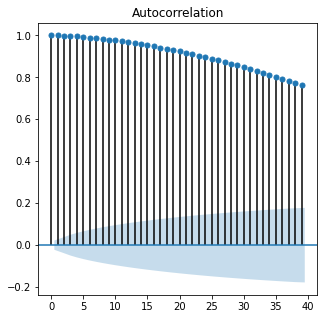

Vertimientos Volumen miles m3


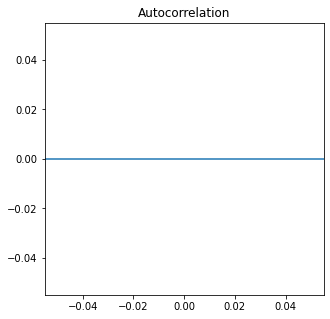

Vertimiento Energía gWh


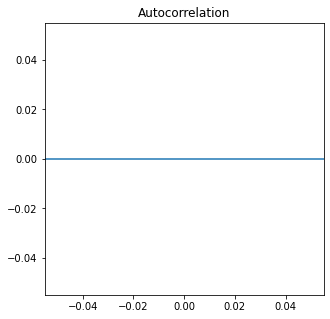

In [ ]:
for i in list_to_plot:
  plot_acf(df[i]) 
  #lag_plot(df[i])
  print(i)
  plt.show()

kW/h price mean


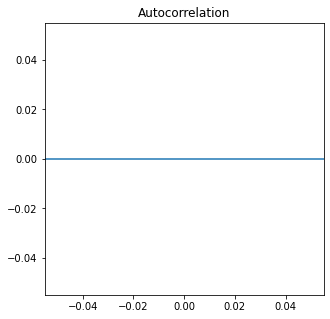

Disponibilidad_HIDRAULICA


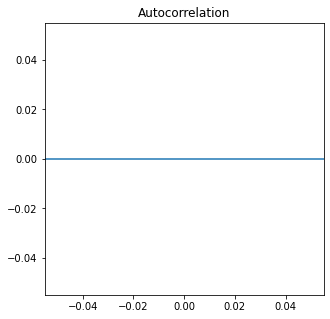

Disponibilidad_TERMICA


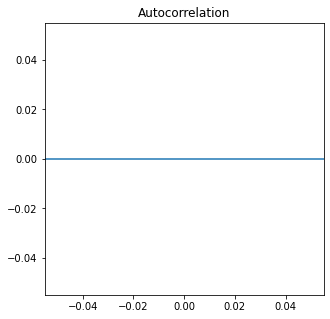

Disponibilidad_SOLAR


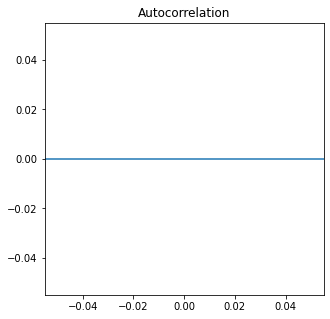

Aportes Caudal m3/s


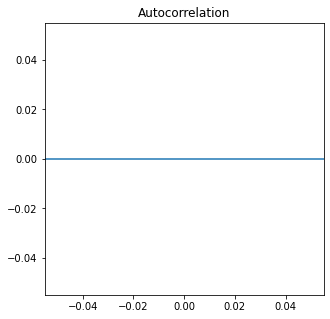

Aportes Energía gWh


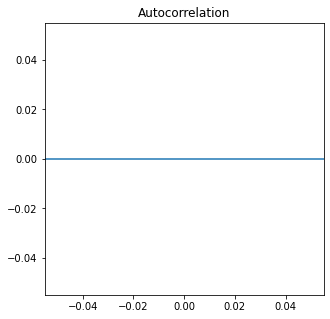

Volumen Útil Diario Mm3


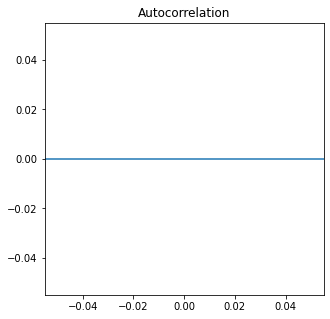

Volumen Mm3


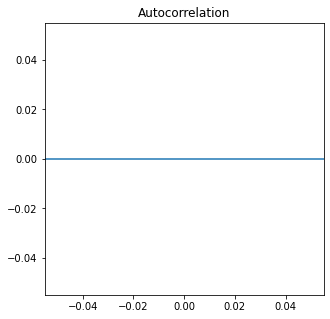

Volumen Útil Diario Energía gWh


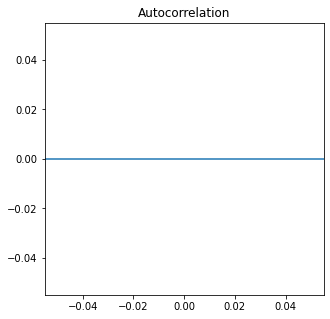

Volumen Energía gWh


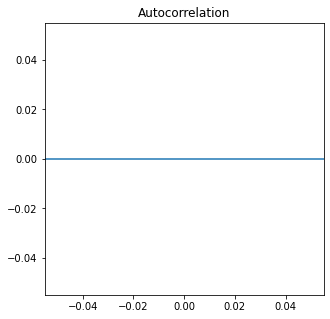

Vertimientos Volumen miles m3


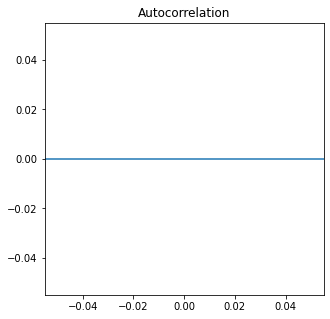

Vertimiento Energía gWh


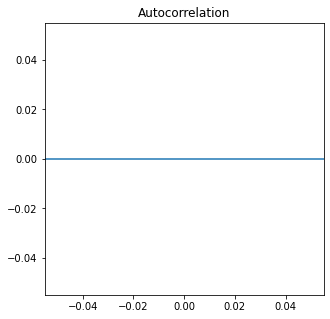

In [ ]:
for i in list_to_plot:
  plot_acf(df_diff[i]) 
  #lag_plot(df_diff[i])
  print(i)
  plt.show()

## Partial Autocorrelation Function:

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf

A partial autocorrelation is a summary of the relationship between an observation in a time series with observations at prior time steps with the relationships of intervening observations removed.

The partial autocorrelation at lag k is the correlation that results after removing the effect of any correlations due to the terms at shorter lags.

kW/h price mean


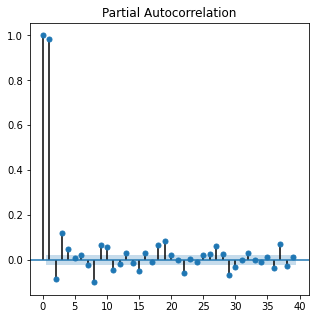

Disponibilidad_HIDRAULICA


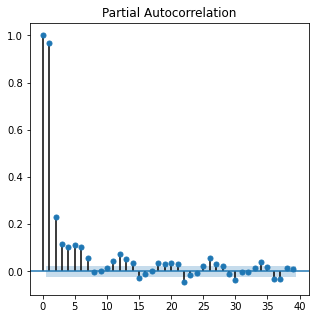

Disponibilidad_TERMICA


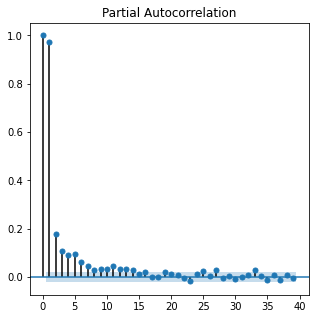

Disponibilidad_SOLAR


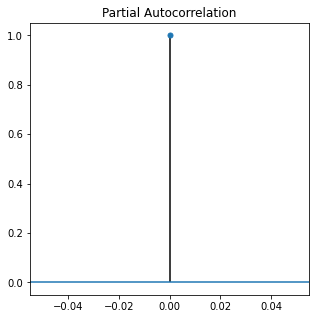

Aportes Caudal m3/s


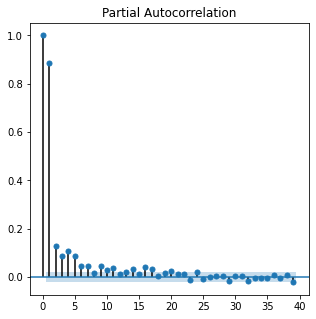

Aportes Energía gWh


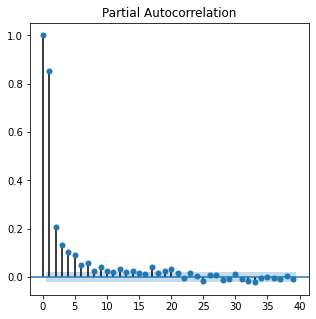

Volumen Útil Diario Mm3


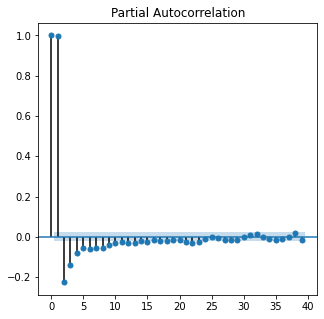

Volumen Mm3


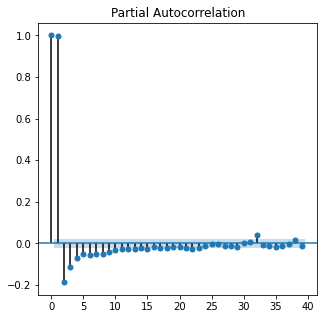

Volumen Útil Diario Energía gWh


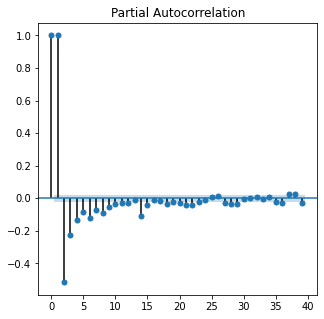

Volumen Energía gWh


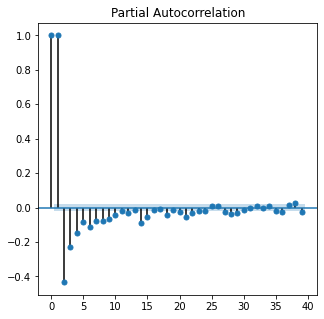

Vertimientos Volumen miles m3


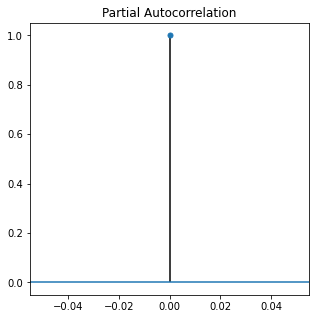

Vertimiento Energía gWh


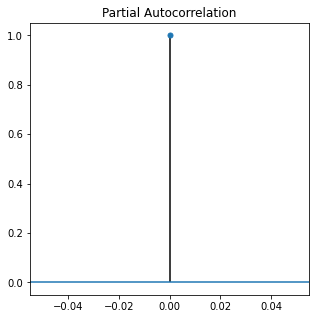

In [ ]:
for i in list_to_plot:
  plot_pacf(df[i]) 
  #lag_plot(df_diff[i])
  print(i)
  plt.show()

kW/h price mean


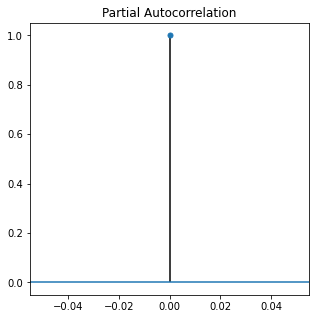

Disponibilidad_HIDRAULICA


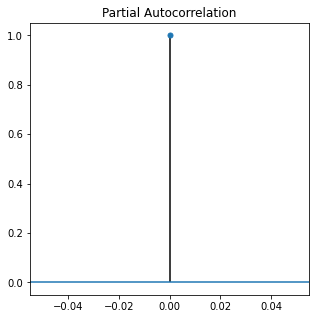

Disponibilidad_TERMICA


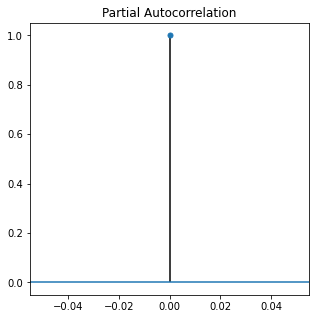

Disponibilidad_SOLAR


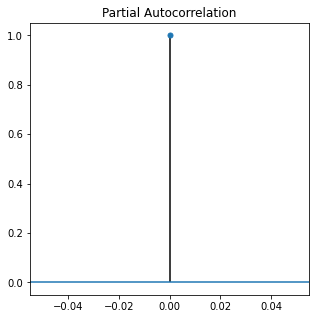

Aportes Caudal m3/s


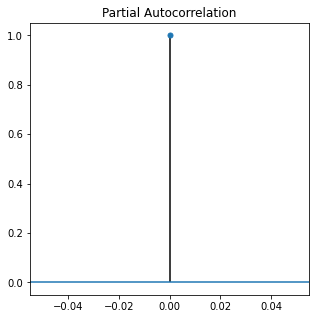

Aportes Energía gWh


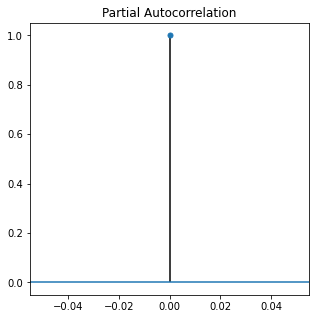

Volumen Útil Diario Mm3


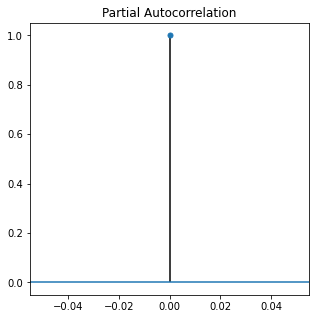

Volumen Mm3


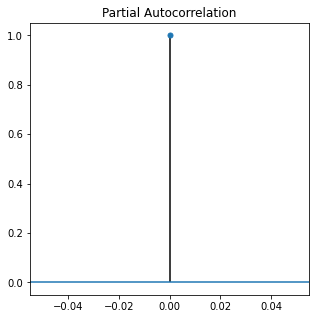

Volumen Útil Diario Energía gWh


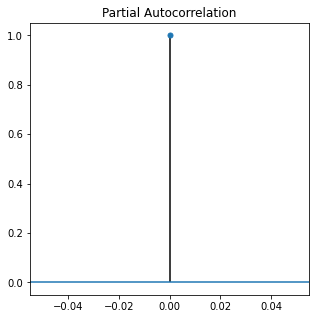

Volumen Energía gWh


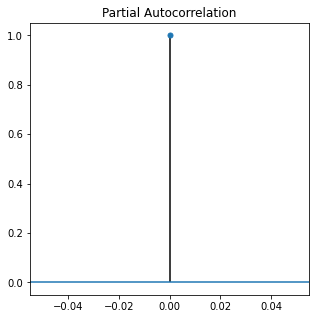

Vertimientos Volumen miles m3


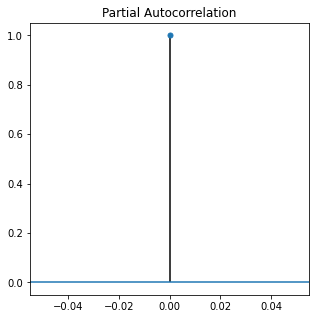

Vertimiento Energía gWh


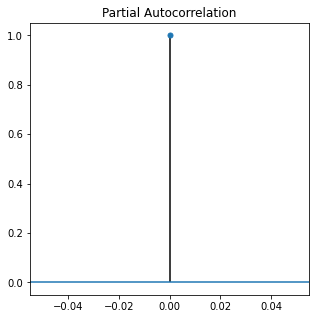

In [ ]:
for i in list_to_plot:
  plot_pacf(df_diff[i]) 
  #lag_plot(df_diff[i])
  print(i)
  plt.show()

## ARIMA

**ARIMA**

The Autoregressive Integrated Moving Average Model, or ARIMA for short is a standard statistical model for time series forecast and analysis. Along with its development, the authors Box and Jenkins also suggest a process for identifying, estimating, and checking models for a specific time series dataset. This process is now referred to as the Box-Jenkins Method.

Each of these components are explicitly specified in the model as a parameter. A standard notation is used of ARIMA(p,d,q) where the parameters are substituted with integer values to quickly indicate the specific ARIMA model being used. The parameters of the ARIMA model are defined as follows:

**p**: The number of lag observations included in the model, also called the lag order.

**d**: The number of times that the raw observations are differenced, also called the degree of differencing.

**q**: The size of the moving average window, also called the order of moving average.

The Box-Jenkins method was proposed by George Box and Gwilym Jenkins in their seminal 1970 textbook Time Series Analysis: Forecasting and Control. The approach starts with the assumption that the process that generated the time series can be approximated using an ARMA model if it is stationary or an ARIMA model if it is non-stationary.

The identification step is further broken down into: Assess whether the time series is stationary, and if not, how many differences are required to make it stationary. Identify the parameters of an ARMA model for the data.


Two diagnostic plots can be used to help choose the p and q parameters of the ARMA or ARIMA. They are:

**Autocorrelation Function (ACF)**. The plot summarizes the correlation of an obser- vation with lag values. The x-axis shows the lag and the y-axis shows the correlation coefficient between -1 and 1 for negative and positive correlation.

**Partial Autocorrelation Function (PACF)**. The plot summarizes the correlations for an observation with lag values that is not accounted for by prior lagged observations.

Both plots are drawn as bar charts showing the 95% and 99% confidence intervals as horizontal lines. Bars that cross these confidence intervals are therefore more significant and worth noting. Some useful patterns you may observe on these plots are:

**The model is AR if the ACF trails off after a lag and has a hard cut-off in the PACF after a lag. This lag is taken as the value for p.**

**The model is MA if the PACF trails off after a lag and has a hard cut-off in the ACF after the lag. This lag value is taken as the value for q.**

The model is a mix of AR and MA if both the ACF and PACF trail off.

**Diagnostic Checking**

The idea of diagnostic checking is to look for evidence that the model is not a good fit for the data. Two useful areas to investigate diagnostics are:

1. **Overfitting**: this means that the model is more complex than it needs to be and captures random noise in the training data. This is a problem for time series forecasting because it negatively impacts the ability of the model to generalize, resulting in poor forecast performance on out-of-sample data.

2. **Residual Errors**: A review of the distribution of errors can help tease out bias in the model. The errors from an ideal model would resemble white noise, that is a Gaussian distribution with a mean of zero and a symmetrical variance. For this, you may use density plots, histograms, and Q-Q plots that compare the distribution of errors to the expected distribution. A non-Gaussian distribution may suggest an opportunity for data pre-processing. A skew in the distribution or a non-zero mean may suggest a bias in forecasts that may be correct.

An ideal model would leave no temporal structure in the time series of forecast residuals. These can be checked by creating ACF and PACF plots of the residual error time series. 

In [ ]:
import statsmodels.api as sm
from statsmodels.tsa.arima_model import ARIMA

In [ ]:
import sys
import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")

In [ ]:
order_model = [(1,0,0),(1,0,1),(1,0,3),(2,0,0),(2,0,1),(2,0,2),(2,0,3),(3,0,1),(3,0,2),(3,0,3)]

### Testing

In [ ]:
#best_model = {}
#model_results = []
#for i in list_to_plot:
#  counter = 0
#  previous_best_aic_model = 0
#  for j in order_model:
    # fit model
#    model = sm.tsa.arima.ARIMA(df_diff[i].dropna(), order=j, dates=np.array(df_diff.reset_index().Fecha[1:]), freq='D')
#    model_fit = model.fit()
#    x = print("Time series ", i, " Model AIC ", model_fit.aic, " Model Specification ", j)
#    model_results.append(x)
#    if counter == 0:
#      previous_best_aic_model = model_fit.aic
#      best_model[i] = j
#      counter +=1
#    else:
#      if previous_best_aic_model > model_fit.aic:
#        previous_best_aic_model = model_fit.aic
#        best_model[i] = j
#        counter +=1
#      else:
#        counter+=1
    # summary of fit model
    # print(model_fit.summary())
    # line plot of residuals
    # residuals = pd.DataFrame(model_fit.resid) 
    # residuals.plot()
    # plt.show()
    # density plot of residuals 
    # residuals.plot(kind='kde') 
    # pyplot.show()
    # summary stats of residuals
    # print(residuals.describe())

### Results:

In [ ]:
best_model = {'Aportes Caudal m3/s': (2, 0, 1),
 'Aportes Energía gWh': (2, 0, 2),
 'Disponibilidad_HIDRAULICA': (3, 0, 3),
 'Disponibilidad_SOLAR': (1, 0, 1),
 'Disponibilidad_TERMICA': (2, 0, 2),
 'Vertimiento Energía gWh': (3, 0, 3),
 'Vertimientos Volumen miles m3': (2, 0, 3),
 'Volumen Energía gWh': (2, 0, 2),
 'Volumen Mm3': (3, 0, 1),
 'Volumen Útil Diario Energía gWh': (3, 0, 1),
 'Volumen Útil Diario Mm3': (3, 0, 1),
 'kW/h price mean': (3, 0, 3)}


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


                                SARIMAX Results                                
Dep. Variable:     Aportes Caudal m3/s   No. Observations:                 7865
Model:                  ARIMA(2, 0, 1)   Log Likelihood              -57050.433
Date:                 Tue, 31 Aug 2021   AIC                         114110.866
Time:                         16:06:40   BIC                         114145.717
Sample:                     01-02-2000   HQIC                        114122.805
                          - 07-14-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2496      1.275      0.196      0.845      -2.249       2.748
ar.L1          0.6372      0.012     55.086      0.000       0.615       0.660
ar.L2          0.0197      0.009      2.218 

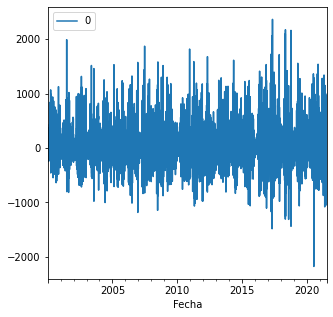

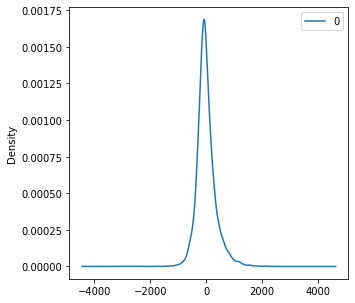

                0
count  7,865.0000
mean       0.0354
std      341.9991
min   -2,174.8173
25%     -194.5347
50%      -43.9970
75%      146.3765
max    2,361.9519


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                                SARIMAX Results                                
Dep. Variable:     Aportes Energía gWh   No. Observations:                 7865
Model:                  ARIMA(2, 0, 2)   Log Likelihood              -39220.473
Date:                 Tue, 31 Aug 2021   AIC                          78452.945
Time:                         16:06:53   BIC                          78494.766
Sample:                     01-02-2000   HQIC                         78467.272
                          - 07-14-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0228      0.121      0.188      0.851      -0.215       0.261
ar.L1          1.1169      0.090     12.366      0.000       0.940       1.294
ar.L2         -0.2557      0.051     -4.990 

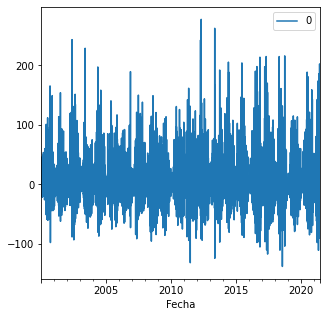

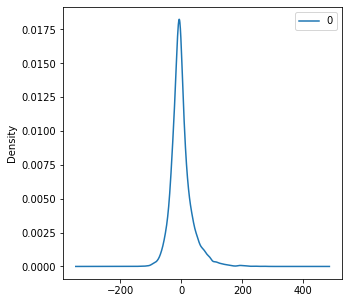

               0
count 7,865.0000
mean      0.0018
std      35.4386
min    -137.8496
25%     -19.2985
50%      -4.9993
75%      12.8768
max     277.3724


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                                   SARIMAX Results                                   
Dep. Variable:     Disponibilidad_HIDRAULICA   No. Observations:                 7865
Model:                        ARIMA(3, 0, 3)   Log Likelihood              -23894.604
Date:                       Tue, 31 Aug 2021   AIC                          47805.209
Time:                               16:07:14   BIC                          47860.970
Sample:                           01-02-2000   HQIC                         47824.311
                                - 07-14-2021                                         
Covariance Type:                         opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0219      0.026     -0.826      0.409      -0.074       0.030
ar.L1          1.7027      0.012    147.324      0.000       1.680       1.

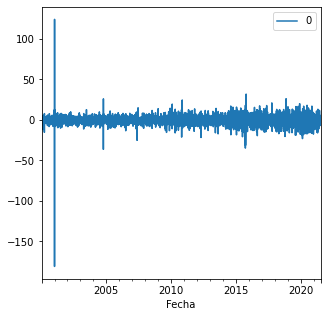

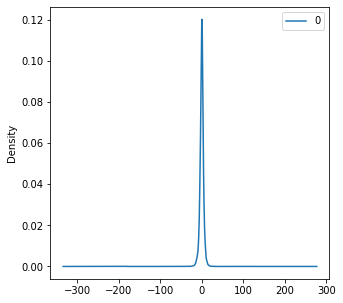

               0
count 7,865.0000
mean      0.0734
std       5.0488
min    -180.8790
25%      -2.1157
50%       0.2429
75%       2.3533
max     124.1815


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                                SARIMAX Results                                 
Dep. Variable:     Disponibilidad_SOLAR   No. Observations:                  730
Model:                   ARIMA(1, 0, 1)   Log Likelihood                 875.575
Date:                  Tue, 31 Aug 2021   AIC                          -1743.150
Time:                          16:07:15   BIC                          -1724.778
Sample:                      01-02-2019   HQIC                         -1736.062
                           - 12-31-2020                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       7.092e-06      0.003      0.003      0.998      -0.005       0.005
ar.L1          0.1093      0.101      1.085      0.278      -0.088       0.307
ma.L1         -0.3863      0.099    

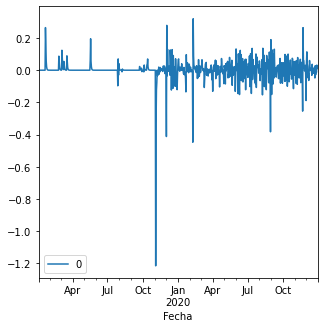

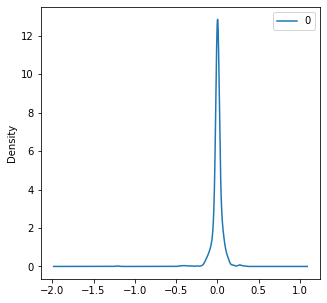

             0
count 730.0000
mean    0.0000
std     0.0730
min    -1.2157
25%    -0.0046
50%    -0.0000
75%     0.0157
max     0.3197


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                                 SARIMAX Results                                  
Dep. Variable:     Disponibilidad_TERMICA   No. Observations:                 7865
Model:                     ARIMA(2, 0, 2)   Log Likelihood              -20403.968
Date:                    Tue, 31 Aug 2021   AIC                          40819.937
Time:                            16:07:28   BIC                          40861.758
Sample:                        01-02-2000   HQIC                         40834.263
                             - 07-14-2021                                         
Covariance Type:                      opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0026      0.006      0.425      0.671      -0.010       0.015
ar.L1          1.5629      0.018     85.395      0.000       1.527       1.599
ar.L2         -0.570

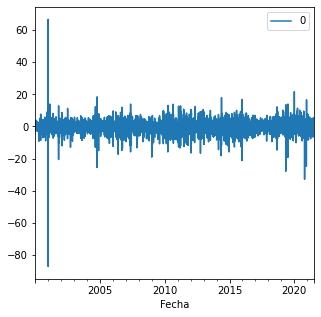

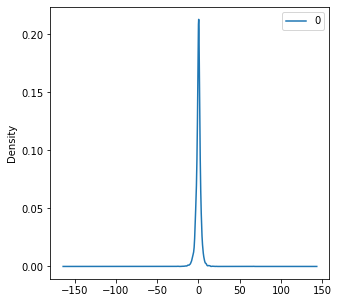

               0
count 7,865.0000
mean      0.0076
std       3.2393
min     -87.1884
25%      -1.2619
50%       0.1922
75%       1.4089
max      66.6876


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


                                  SARIMAX Results                                  
Dep. Variable:     Vertimiento Energía gWh   No. Observations:                 4575
Model:                      ARIMA(3, 0, 3)   Log Likelihood              -16565.146
Date:                     Tue, 31 Aug 2021   AIC                          33146.293
Time:                             16:07:36   BIC                          33197.720
Sample:                                  0   HQIC                         33164.399
                                    - 4575                                         
Covariance Type:                       opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0104      0.053     -0.194      0.846      -0.115       0.094
ar.L1          0.3189      0.075      4.247      0.000       0.172       0.466
ar.L2       

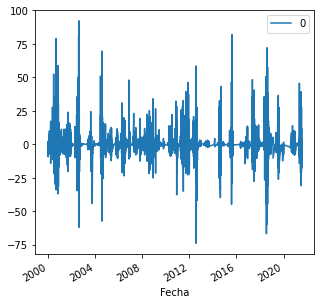

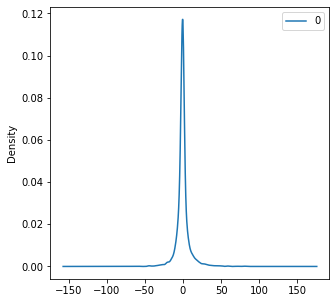

               0
count 4,575.0000
mean     -0.0034
std       9.0424
min     -73.9211
25%      -2.3334
50%      -0.3698
75%       1.2743
max      92.3160


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


                                     SARIMAX Results                                     
Dep. Variable:     Vertimientos Volumen miles m3   No. Observations:                 4575
Model:                            ARIMA(2, 0, 3)   Log Likelihood              -48524.218
Date:                           Tue, 31 Aug 2021   AIC                          97062.436
Time:                                   16:07:41   BIC                          97107.435
Sample:                                        0   HQIC                         97078.279
                                          - 4575                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         20.0122     61.536      0.325      0.745    -100.596     140.621
ar.L1         -0.2834      0.058     -4.898

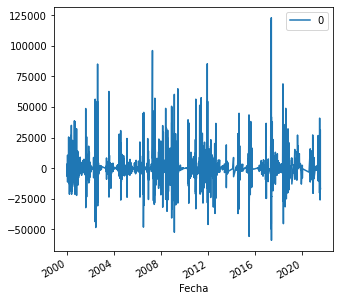

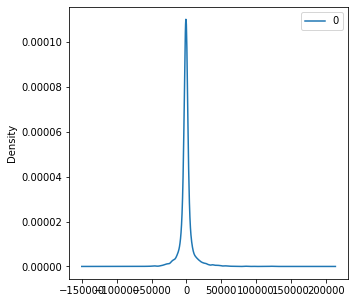

                 0
count   4,575.0000
mean        9.7871
std     9,774.0071
min   -59,091.1325
25%    -2,492.3754
50%      -443.3379
75%     1,466.1631
max   122,913.1000


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters

                                SARIMAX Results                                
Dep. Variable:     Volumen Energía gWh   No. Observations:                 7865
Model:                  ARIMA(2, 0, 2)   Log Likelihood              -41078.810
Date:                 Tue, 31 Aug 2021   AIC                          82169.620
Time:                         16:07:52   BIC                          82211.441
Sample:                     01-02-2000   HQIC                         82183.947
                          - 07-14-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5337      4.687      0.114      0.909      -8.652       9.720
ar.L1          1.5127      0.039     38.388      0.000       1.435       1.590
ar.L2         -0.5239      0.038    -13.941 

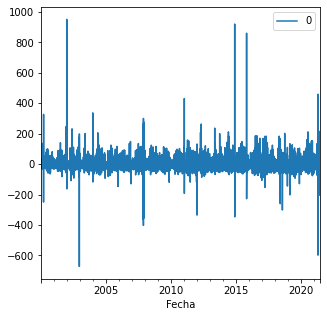

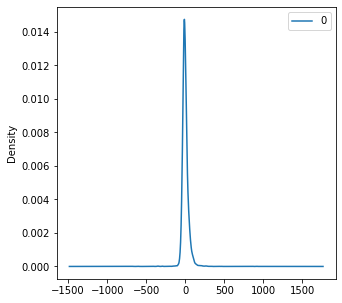

               0
count 7,865.0000
mean      0.0109
std      44.8834
min    -671.9890
25%     -21.8499
50%      -5.6017
75%      15.6568
max     951.1367


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                               SARIMAX Results                                
Dep. Variable:            Volumen Mm3   No. Observations:                 7865
Model:                 ARIMA(3, 0, 1)   Log Likelihood              -43115.943
Date:                Tue, 31 Aug 2021   AIC                          86243.885
Time:                        16:08:01   BIC                          86285.706
Sample:                    01-02-2000   HQIC                         86258.212
                         - 07-14-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0933      3.754      0.291      0.771      -6.264       8.450
ar.L1          1.1632      0.016     70.794      0.000       1.131       1.195
ar.L2         -0.1212      0.006    -20.688      0.0

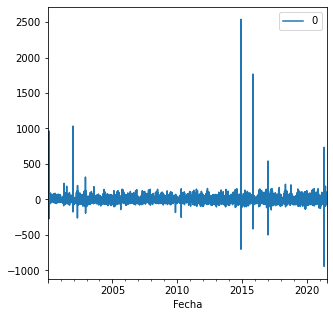

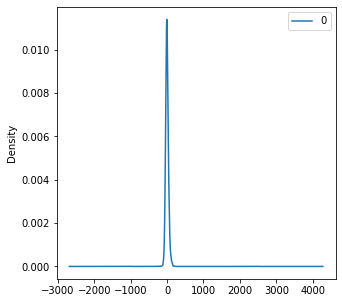

               0
count 7,865.0000
mean      0.0089
std      58.1546
min    -944.6804
25%     -25.8193
50%      -3.6896
75%      20.9355
max   2,538.1019


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                                      SARIMAX Results                                      
Dep. Variable:     Volumen Útil Diario Energía gWh   No. Observations:                 7865
Model:                              ARIMA(3, 0, 1)   Log Likelihood              -40394.674
Date:                             Tue, 31 Aug 2021   AIC                          80801.348
Time:                                     16:08:09   BIC                          80843.169
Sample:                                 01-02-2000   HQIC                         80815.674
                                      - 07-14-2021                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4423      4.567      0.097      0.923      -8.510       9.394
ar.L1          1.3020      

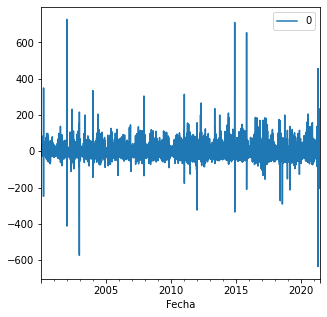

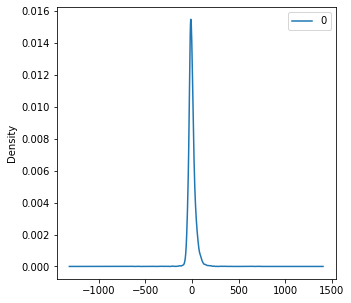

               0
count 7,865.0000
mean      0.0096
std      41.1441
min    -634.8674
25%     -20.8270
50%      -5.3320
75%      14.9921
max     726.5592


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                                  SARIMAX Results                                  
Dep. Variable:     Volumen Útil Diario Mm3   No. Observations:                 7865
Model:                      ARIMA(3, 0, 1)   Log Likelihood              -42373.571
Date:                     Tue, 31 Aug 2021   AIC                          84759.143
Time:                             16:08:17   BIC                          84800.964
Sample:                         01-02-2000   HQIC                         84773.469
                              - 07-14-2021                                         
Covariance Type:                       opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.8185      3.492      0.234      0.815      -6.026       7.663
ar.L1          1.1783      0.015     77.253      0.000       1.148       1.208
ar.L2       

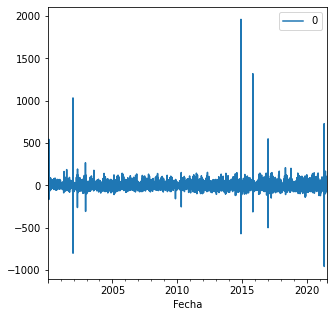

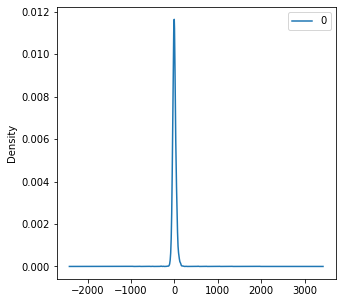

               0
count 7,865.0000
mean      0.0092
std      52.9165
min    -958.0863
25%     -25.2947
50%      -3.2944
75%      21.2414
max   1,962.2459


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters

                               SARIMAX Results                                
Dep. Variable:        kW/h price mean   No. Observations:                 7865
Model:                 ARIMA(3, 0, 3)   Log Likelihood              -35850.859
Date:                Tue, 31 Aug 2021   AIC                          71717.719
Time:                        16:08:38   BIC                          71773.480
Sample:                    01-02-2000   HQIC                         71736.821
                         - 07-14-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0078      0.112      0.070      0.944      -0.212       0.228
ar.L1          0.3140      0.010     31.837      0.000       0.295       0.333
ar.L2         -0.1752      0.008    -21.730      0.0

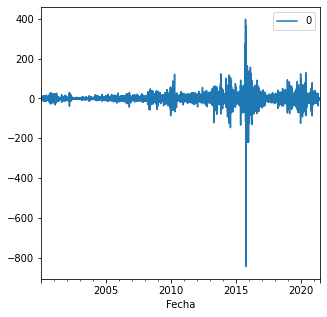

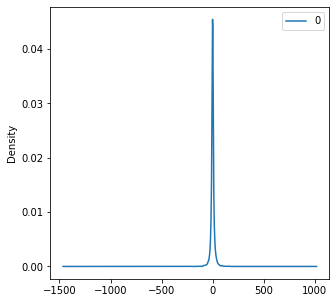

               0
count 7,865.0000
mean      0.0077
std      23.0894
min    -844.4887
25%      -5.5159
50%      -0.2358
75%       5.1436
max     397.4538


In [ ]:
for key in best_model:
  model = sm.tsa.arima.ARIMA(df_diff[key].dropna(), order=best_model[key])
  model_fit = model.fit()
  # print(model_fit.aic, i, j)
  # summary of fit model
  print(model_fit.summary())
  # line plot of residuals
  residuals = pd.DataFrame(model_fit.resid) 
  residuals.plot()
  plt.show()
  # density plot of residuals 
  residuals.plot(kind='kde') 
  plt.show()
  # summary stats of residuals
  print(residuals.describe())

In [ ]:
best_models2 = {'Aportes Caudal m3/s': (12, 0, 12),
 'Aportes Energía gWh': (9, 0, 9),
 'Disponibilidad_HIDRAULICA': (10, 0, 10),
 'Disponibilidad_SOLAR': (10, 0, 10),
 'Disponibilidad_TERMICA': (10, 0, 10),
 'Vertimiento Energía gWh': (5, 0, 5),
 'Vertimientos Volumen miles m3': (5, 0, 5),
 'Volumen Energía gWh': (15, 0, 15),
 'Volumen Mm3': (3, 0, 1),
 'Volumen Útil Diario Energía gWh': (15, 0, 15),
 'Volumen Útil Diario Mm3': (13, 0, 13),
 'kW/h price mean': (15, 0, 15)}

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                                SARIMAX Results                                
Dep. Variable:     Aportes Caudal m3/s   No. Observations:                 7865
Model:                ARIMA(12, 0, 12)   Log Likelihood              -57027.874
Date:                 Tue, 31 Aug 2021   AIC                         114107.748
Time:                         16:10:25   BIC                         114288.973
Sample:                     01-02-2000   HQIC                        114169.831
                          - 07-14-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2651      1.268      0.209      0.834      -2.219       2.749
ar.L1         -0.5671      0.393     -1.444      0.149      -1.337       0.203
ar.L2         -0.5311      0.112     -4.736 

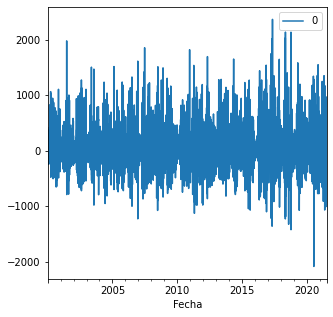

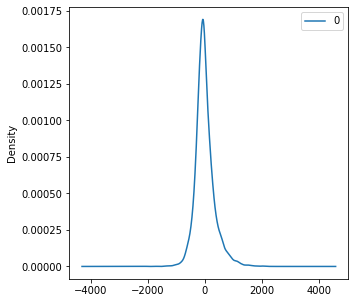

                0
count  7,865.0000
mean      -0.0131
std      341.0134
min   -2,087.9299
25%     -193.4330
50%      -43.7179
75%      146.5423
max    2,366.6370


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters

                                SARIMAX Results                                
Dep. Variable:     Aportes Energía gWh   No. Observations:                 7865
Model:                  ARIMA(9, 0, 9)   Log Likelihood              -39214.690
Date:                 Tue, 31 Aug 2021   AIC                          78469.379
Time:                         16:11:34   BIC                          78608.783
Sample:                     01-02-2000   HQIC                         78517.135
                          - 07-14-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0021      0.122      0.018      0.986      -0.237       0.241
ar.L1          0.0605      0.529      0.114      0.909      -0.976       1.096
ar.L2         -0.0491      0.525     -0.094 

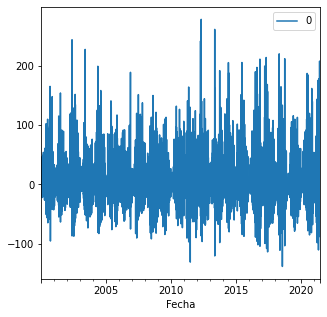

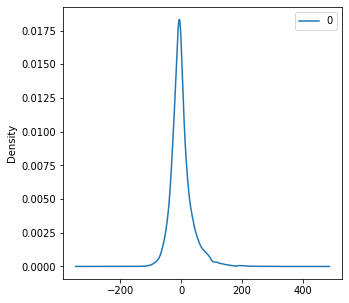

               0
count 7,865.0000
mean      0.0883
std      35.4123
min    -138.1537
25%     -19.2480
50%      -4.8330
75%      12.9113
max     278.1533


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters

                                   SARIMAX Results                                   
Dep. Variable:     Disponibilidad_HIDRAULICA   No. Observations:                 7865
Model:                      ARIMA(10, 0, 10)   Log Likelihood              -23826.213
Date:                       Tue, 31 Aug 2021   AIC                          47696.426
Time:                               16:13:26   BIC                          47849.770
Sample:                           01-02-2000   HQIC                         47748.958
                                - 07-14-2021                                         
Covariance Type:                         opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0070      0.002      3.155      0.002       0.003       0.011
ar.L1         -1.2030      0.396     -3.040      0.002      -1.979      -0.

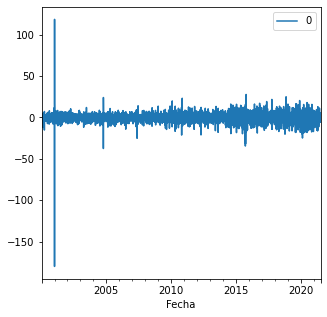

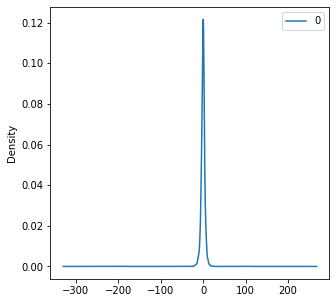

               0
count 7,865.0000
mean      0.0010
std       5.0057
min    -180.0368
25%      -2.1709
50%       0.2078
75%       2.3319
max     118.4525


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters

                                SARIMAX Results                                 
Dep. Variable:     Disponibilidad_SOLAR   No. Observations:                  730
Model:                 ARIMA(10, 0, 10)   Log Likelihood                 877.427
Date:                  Tue, 31 Aug 2021   AIC                          -1710.854
Time:                          16:13:36   BIC                          -1609.807
Sample:                      01-02-2019   HQIC                         -1671.870
                           - 12-31-2020                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0002      0.003      0.057      0.954      -0.005       0.006
ar.L1         -0.1189     33.038     -0.004      0.997     -64.872      64.634
ar.L2          0.0258      3.491    

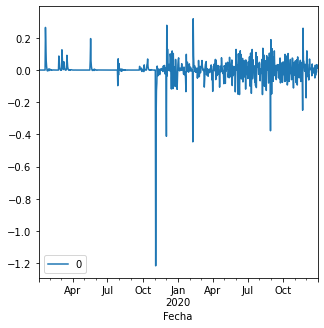

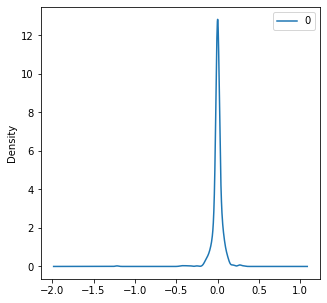

             0
count 730.0000
mean   -0.0002
std     0.0728
min    -1.2159
25%    -0.0046
50%    -0.0002
75%     0.0131
max     0.3183


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters

                                 SARIMAX Results                                  
Dep. Variable:     Disponibilidad_TERMICA   No. Observations:                 7865
Model:                   ARIMA(10, 0, 10)   Log Likelihood              -20394.416
Date:                    Tue, 31 Aug 2021   AIC                          40832.832
Time:                            16:15:13   BIC                          40986.175
Sample:                        01-02-2000   HQIC                         40885.363
                             - 07-14-2021                                         
Covariance Type:                      opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0044      0.009      0.464      0.643      -0.014       0.023
ar.L1         -0.4303      0.117     -3.667      0.000      -0.660      -0.200
ar.L2         -0.080

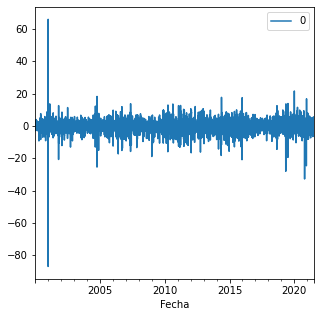

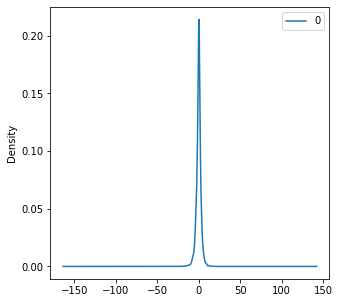

               0
count 7,865.0000
mean     -0.0045
std       3.2354
min     -86.9151
25%      -1.2800
50%       0.1803
75%       1.3991
max      65.9075


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                                  SARIMAX Results                                  
Dep. Variable:     Vertimiento Energía gWh   No. Observations:                 4575
Model:                      ARIMA(5, 0, 5)   Log Likelihood              -16553.295
Date:                     Tue, 31 Aug 2021   AIC                          33130.589
Time:                             16:15:30   BIC                          33207.730
Sample:                                  0   HQIC                         33157.748
                                    - 4575                                         
Covariance Type:                       opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0080      0.026     -0.305      0.760      -0.059       0.043
ar.L1          0.0856      0.054      1.589      0.112      -0.020       0.191
ar.L2       

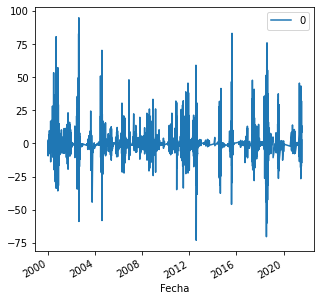

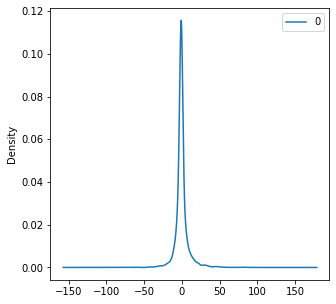

               0
count 4,575.0000
mean     -0.0247
std       9.0179
min     -73.1332
25%      -2.5497
50%      -0.7035
75%       1.2752
max      94.8286


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                                     SARIMAX Results                                     
Dep. Variable:     Vertimientos Volumen miles m3   No. Observations:                 4575
Model:                            ARIMA(5, 0, 5)   Log Likelihood              -48513.599
Date:                           Tue, 31 Aug 2021   AIC                          97051.199
Time:                                   16:15:49   BIC                          97128.339
Sample:                                        0   HQIC                         97078.357
                                          - 4575                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         20.0134     41.909      0.478      0.633     -62.126     102.153
ar.L1          0.4797      1.070      0.448

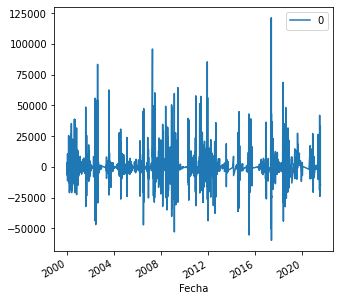

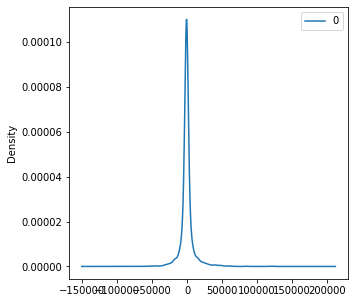

                 0
count   4,575.0000
mean       19.3990
std     9,751.2880
min   -59,721.3479
25%    -2,500.1447
50%      -549.1399
75%     1,428.9980
max   121,240.0901


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                                SARIMAX Results                                
Dep. Variable:     Volumen Energía gWh   No. Observations:                 7865
Model:                ARIMA(15, 0, 15)   Log Likelihood              -40973.869
Date:                 Tue, 31 Aug 2021   AIC                          82011.738
Time:                         16:18:20   BIC                          82234.783
Sample:                     01-02-2000   HQIC                         82088.148
                          - 07-14-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5371      5.914      0.091      0.928     -11.054      12.128
ar.L1          0.3895      0.698      0.558      0.577      -0.978       1.757
ar.L2          0.1171      0.440      0.266 

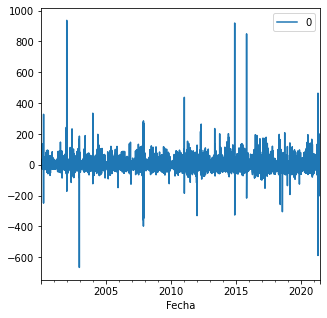

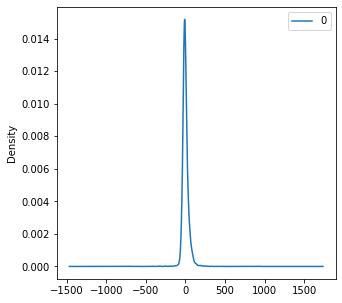

               0
count 7,865.0000
mean      0.0085
std      44.2856
min    -665.9031
25%     -21.2521
50%      -5.2097
75%      15.1511
max     936.8716


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                               SARIMAX Results                                
Dep. Variable:            Volumen Mm3   No. Observations:                 7865
Model:                 ARIMA(3, 0, 1)   Log Likelihood              -43115.943
Date:                Tue, 31 Aug 2021   AIC                          86243.885
Time:                        16:18:29   BIC                          86285.706
Sample:                    01-02-2000   HQIC                         86258.212
                         - 07-14-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0933      3.754      0.291      0.771      -6.264       8.450
ar.L1          1.1632      0.016     70.794      0.000       1.131       1.195
ar.L2         -0.1212      0.006    -20.688      0.0

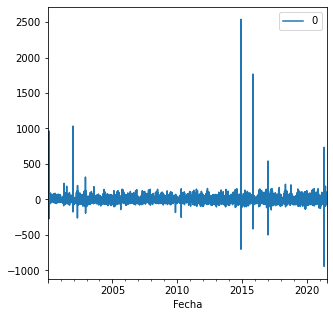

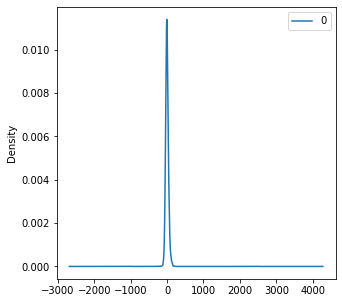

               0
count 7,865.0000
mean      0.0089
std      58.1546
min    -944.6804
25%     -25.8193
50%      -3.6896
75%      20.9355
max   2,538.1019


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters

                                      SARIMAX Results                                      
Dep. Variable:     Volumen Útil Diario Energía gWh   No. Observations:                 7865
Model:                            ARIMA(15, 0, 15)   Log Likelihood              -40285.394
Date:                             Tue, 31 Aug 2021   AIC                          80634.789
Time:                                     16:21:33   BIC                          80857.834
Sample:                                 01-02-2000   HQIC                         80711.199
                                      - 07-14-2021                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4434      4.704      0.094      0.925      -8.777       9.663
ar.L1         -0.3032      

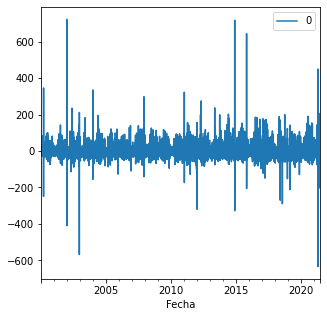

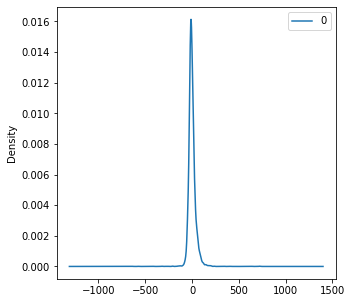

               0
count 7,865.0000
mean      0.0089
std      40.5723
min    -632.9552
25%     -20.2766
50%      -5.4144
75%      14.4745
max     721.7517


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                                  SARIMAX Results                                  
Dep. Variable:     Volumen Útil Diario Mm3   No. Observations:                 7865
Model:                    ARIMA(13, 0, 13)   Log Likelihood              -42345.825
Date:                     Tue, 31 Aug 2021   AIC                          84747.649
Time:                             16:23:46   BIC                          84942.814
Sample:                         01-02-2000   HQIC                         84814.508
                              - 07-14-2021                                         
Covariance Type:                       opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.8189      3.194      0.256      0.798      -5.442       7.080
ar.L1          0.4596      0.595      0.772      0.440      -0.707       1.627
ar.L2       

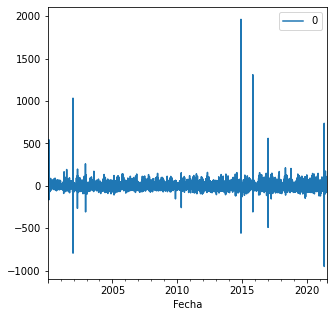

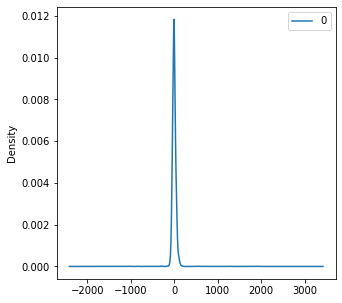

               0
count 7,865.0000
mean      0.0040
std      52.7303
min    -951.4719
25%     -25.0972
50%      -3.2776
75%      20.9912
max   1,962.8382


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceW

                               SARIMAX Results                                
Dep. Variable:        kW/h price mean   No. Observations:                 7865
Model:               ARIMA(15, 0, 15)   Log Likelihood              -35692.467
Date:                Tue, 31 Aug 2021   AIC                          71448.934
Time:                        16:26:26   BIC                          71671.980
Sample:                    01-02-2000   HQIC                         71525.344
                         - 07-14-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0065      0.154      0.042      0.966      -0.296       0.308
ar.L1          0.4409      0.128      3.458      0.001       0.191       0.691
ar.L2         -0.1371      0.084     -1.623      0.1

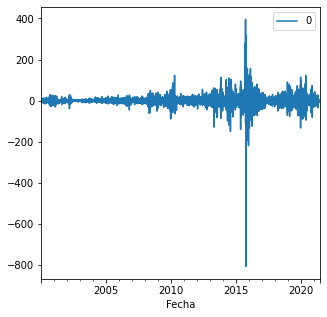

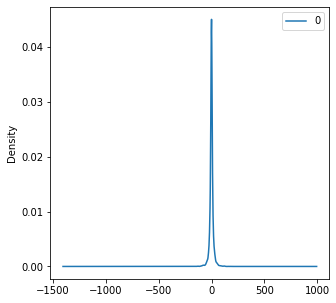

               0
count 7,865.0000
mean      0.0028
std      22.6266
min    -805.9519
25%      -5.6042
50%      -0.1215
75%       5.4530
max     395.2789


In [ ]:
for key in best_models2:
  model = sm.tsa.arima.ARIMA(df_diff[key].dropna(), order=best_models2[key])
  model_fit = model.fit()
  # print(model_fit.aic, i, j)
  # summary of fit model
  print(model_fit.summary())
  # line plot of residuals
  residuals = pd.DataFrame(model_fit.resid) 
  residuals.plot()
  plt.show()
  # density plot of residuals 
  residuals.plot(kind='kde') 
  plt.show()
  # summary stats of residuals
  print(residuals.describe())

## Impulse-Response:

In [ ]:
precio_model = sm.tsa.arima.ARIMA(df_diff['kW/h price mean'].dropna(), order=(3, 0, 3))
precio_fit = precio_model.fit()
Disponibilidad_HIDRAULICA_model = sm.tsa.arima.ARIMA(df_diff['Disponibilidad_HIDRAULICA'].dropna(), order=(3, 0, 3))
Disponibilidad_HIDRAULICA_fit = Disponibilidad_HIDRAULICA_model.fit()
Disponibilidad_TERMICA_model = sm.tsa.arima.ARIMA(df_diff['Disponibilidad_TERMICA'].dropna(), order=(2, 0, 2))
Disponibilidad_TERMICA_fit = Disponibilidad_TERMICA_model.fit()
Disponibilidad_SOLAR_model = sm.tsa.arima.ARIMA(df_diff['Disponibilidad_SOLAR'].dropna(), order=(1, 0, 1))
Disponibilidad_SOLAR_fit = Disponibilidad_SOLAR_model.fit()
Aportes_Caudal_model = sm.tsa.arima.ARIMA(df_diff['Aportes Caudal m3/s'].dropna(), order=(2, 0, 1))
Aportes_Caudal_fit = Aportes_Caudal_model.fit()
Aportes_Energia_model = sm.tsa.arima.ARIMA(df_diff['Aportes Energía gWh'].dropna(), order=(2, 0, 2))
Aportes_Energia_fit = Aportes_Energia_model.fit()
Vertimientos_Volumen_model = sm.tsa.arima.ARIMA(df_diff['Vertimientos Volumen miles m3'].dropna(), order=(2, 0, 3))
Vertimientos_Volumen_fit = Vertimientos_Volumen_model.fit()
Vertimiento_Energia_model = sm.tsa.arima.ARIMA(df_diff['Vertimiento Energía gWh'].dropna(), order=(3, 0, 3))
Vertimiento_Energia_fit = Vertimiento_Energia_model.fit()
Volumen_Energia_model = sm.tsa.arima.ARIMA(df_diff['Volumen Energía gWh'].dropna(), order=(2, 0, 2))
Volumen_Energial_fit = Volumen_Energia_model.fit()
Volumen_Mm3_model = sm.tsa.arima.ARIMA(df_diff['Volumen Mm3'].dropna(), order=(3, 0, 1))
Volumen_Mm3_fit = Volumen_Mm3_model.fit()
Volumen_Diario_Energia_model = sm.tsa.arima.ARIMA(df_diff['Volumen Útil Diario Energía gWh'].dropna(), order=(3, 0, 1))
Volumen_Diario_Energia_model_fit = Volumen_Diario_Energia_model.fit()
Volumen_Diario_Mm3_model = sm.tsa.arima.ARIMA(df_diff['Volumen Útil Diario Mm3'].dropna(), order=(3, 0, 3))
Volumen_Diario_Mm3_fit = Volumen_Diario_Mm3_model.fit()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters

### Precio:

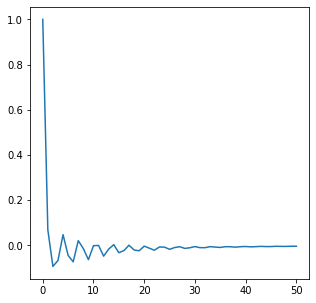

In [ ]:
precio_model_impulse = precio_model.impulse_responses(params=precio_fit.params, steps=50, cumulative=False)
precio_model_impulse.plot()

### Disponibilidad Hidraulica:

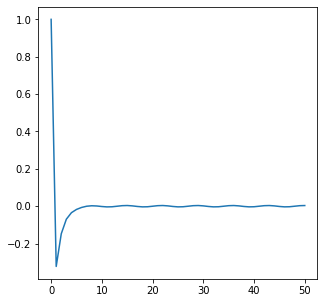

In [ ]:
HIDRAULICA_impulse = Disponibilidad_HIDRAULICA_model.impulse_responses(params=Disponibilidad_HIDRAULICA_fit.params, steps=50, cumulative=False)
HIDRAULICA_impulse.plot()

### Disponibilidad Termica:

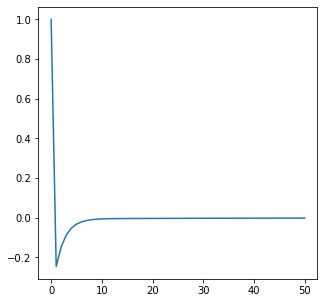

In [ ]:
TERMICA_impulse = Disponibilidad_TERMICA_model.impulse_responses(params=Disponibilidad_TERMICA_fit.params, steps=50, cumulative=False)
TERMICA_impulse.plot()

### Disponibilidad Solar:

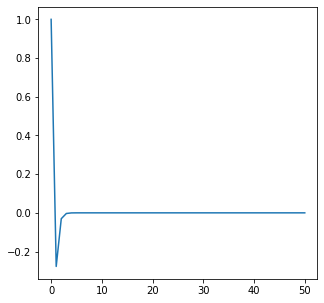

In [ ]:
SOLAR_impulse = Disponibilidad_SOLAR_model.impulse_responses(params=Disponibilidad_SOLAR_fit.params, steps=50, cumulative=False)
SOLAR_impulse.plot()

### Aportes Caudal:

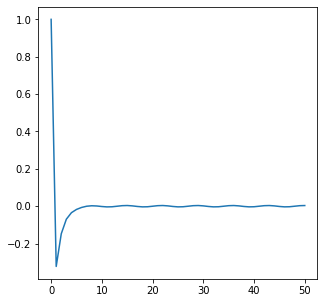

In [ ]:
Aportes_Caudal_impulse = Aportes_Caudal_model.impulse_responses(params=Aportes_Caudal_fit.params, steps=50, cumulative=False)
HIDRAULICA_impulse.plot()

### Aportes Energia:

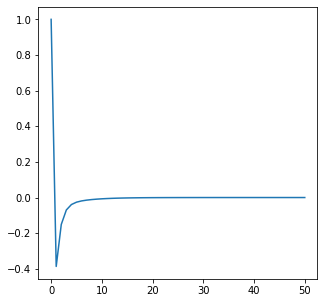

In [ ]:
Aportes_Energia_impulse = Aportes_Energia_model.impulse_responses(params=Aportes_Energia_fit.params, steps=50, cumulative=False)
Aportes_Energia_impulse.plot()

### Vertimientos Volumen:

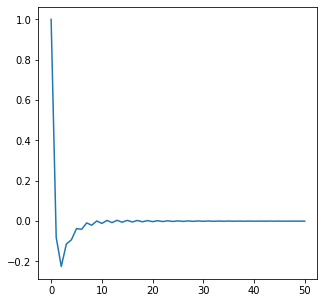

In [ ]:
Vertimientos_Volumen_impulse = Vertimientos_Volumen_model.impulse_responses(params=Vertimientos_Volumen_fit.params, steps=50, cumulative=False)
Vertimientos_Volumen_impulse.plot()

### Vertimientos Energia:

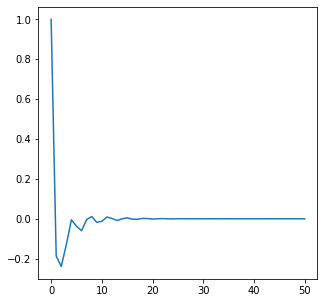

In [ ]:
Vertimiento_Energia_impulse = Vertimiento_Energia_model.impulse_responses(params=Vertimiento_Energia_fit.params, steps=50, cumulative=False)
Vertimiento_Energia_impulse.plot()

### Volumen Energia:

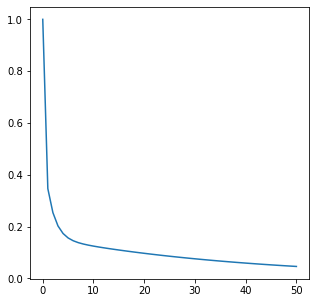

In [ ]:
Volumen_Energia_impulse = Volumen_Energia_model.impulse_responses(params=Volumen_Energial_fit.params, steps=50, cumulative=False)
Volumen_Energia_impulse.plot()

### Volumen Mm3:

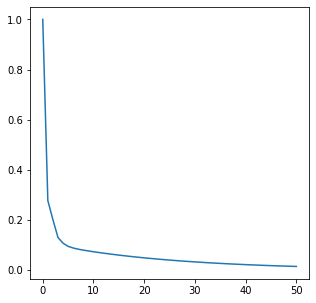

In [ ]:
Volumen_Mm3_impulse = Volumen_Mm3_model.impulse_responses(params=Volumen_Mm3_fit.params, steps=50, cumulative=False)
Volumen_Mm3_impulse.plot()

### Volumen Diario Energia:

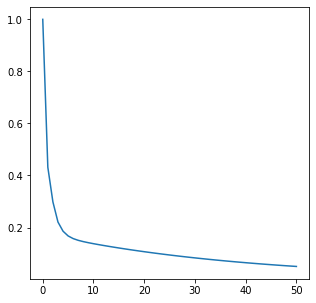

In [ ]:
Volumen_Diario_Energia_impulse = Volumen_Diario_Energia_model.impulse_responses(params=Volumen_Diario_Energia_model_fit.params, steps=50, cumulative=False)
Volumen_Diario_Energia_impulse.plot()

### Volumen Diario Mm3

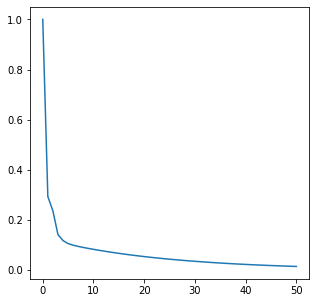

In [ ]:
Volumen_Diario_Mm3_impulse = Volumen_Diario_Mm3_model.impulse_responses(params=Volumen_Diario_Mm3_fit.params, steps=50, cumulative=False)
Volumen_Diario_Mm3_impulse.plot()

## SARIMAX:

In [ ]:
sarimax_order = [(2,0,1),(2,0,2)]
sarimax_exog = ['Disponibilidad_HIDRAULICA',
       'Disponibilidad_TERMICA', 'Aportes Caudal m3/s',
       'Aportes Energía gWh', 'Volumen Útil Diario Mm3', 'Volumen Mm3',
       'Volumen Útil Diario Energía gWh', 'Volumen Energía gWh',]

In [ ]:
import statsmodels

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


71678.001056098 (2, 0, 1)
                               SARIMAX Results                                
Dep. Variable:        kW/h price mean   No. Observations:                 7865
Model:               SARIMAX(2, 0, 1)   Log Likelihood              -35827.001
Date:                Tue, 31 Aug 2021   AIC                          71678.001
Time:                        16:29:03   BIC                          71761.643
Sample:                    01-02-2000   HQIC                         71706.655
                         - 07-14-2021                                         
Covariance Type:                  opg                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Disponibilidad_HIDRAULICA          -0.3215      0.033     -9.831      0.000      -0.386      -0.257
Disponibilidad_TERMICA             -0.1070

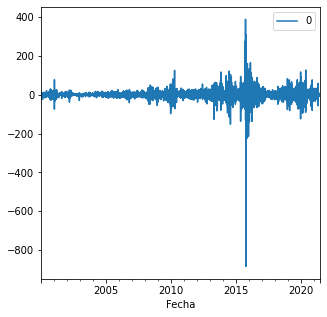

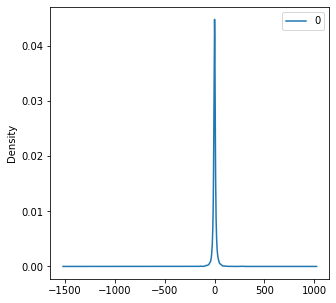

               0
count 7,865.0000
mean      0.0164
std      23.0201
min    -884.3753
25%      -5.4958
50%      -0.0441
75%       5.2221
max     387.9008


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


71679.42592424317 (2, 0, 2)
                               SARIMAX Results                                
Dep. Variable:        kW/h price mean   No. Observations:                 7865
Model:               SARIMAX(2, 0, 2)   Log Likelihood              -35826.713
Date:                Tue, 31 Aug 2021   AIC                          71679.426
Time:                        16:29:34   BIC                          71770.038
Sample:                    01-02-2000   HQIC                         71710.467
                         - 07-14-2021                                         
Covariance Type:                  opg                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Disponibilidad_HIDRAULICA          -0.3224      0.033     -9.886      0.000      -0.386      -0.258
Disponibilidad_TERMICA             -0.10

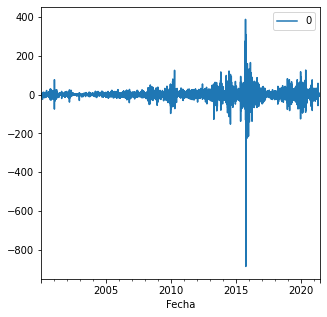

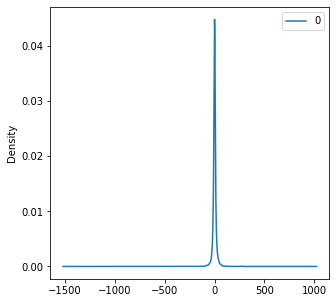

               0
count 7,865.0000
mean      0.0165
std      23.0192
min    -885.3576
25%      -5.5052
50%      -0.0478
75%       5.2546
max     387.8173


In [ ]:
for i in sarimax_order:
  model_sarimax = statsmodels.tsa.statespace.sarimax.SARIMAX(df_diff['kW/h price mean'].dropna(), exog=df_diff[sarimax_exog].dropna(), order=i, freq=df_diff['kW/h price mean'].index.inferred_freq )
  model_sarimax_fit = model_sarimax.fit()
  print(model_sarimax_fit.aic, i)
  # summary of fit model
  print(model_sarimax_fit.summary())
  # line plot of residuals
  residuals2 = pd.DataFrame(model_sarimax_fit.resid) 
  residuals2.plot()
  plt.show()
  # density plot of residuals 
  residuals2.plot(kind='kde') 
  plt.show()
  # summary stats of residuals
  print(residuals2.describe())

In [ ]:
sarimax_exog2 = ['Disponibilidad_HIDRAULICA', 'Disponibilidad_TERMICA','Aportes Caudal m3/s','Volumen Útil Diario Mm3','Volumen Mm3','Volumen Útil Diario Energía gWh']

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


71674.87359056374 (2, 0, 1)
                               SARIMAX Results                                
Dep. Variable:        kW/h price mean   No. Observations:                 7865
Model:               SARIMAX(2, 0, 1)   Log Likelihood              -35827.437
Date:                Tue, 31 Aug 2021   AIC                          71674.874
Time:                        16:29:53   BIC                          71744.575
Sample:                    01-02-2000   HQIC                         71698.752
                         - 07-14-2021                                         
Covariance Type:                  opg                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Disponibilidad_HIDRAULICA          -0.3228      0.033     -9.875      0.000      -0.387      -0.259
Disponibilidad_TERMICA             -0.10

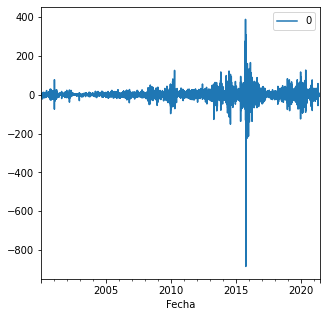

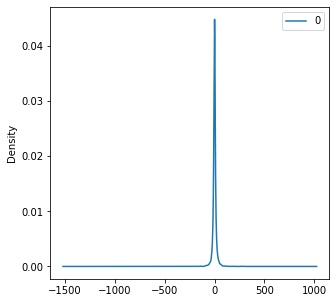

               0
count 7,865.0000
mean      0.0187
std      23.0213
min    -884.4590
25%      -5.4990
50%      -0.0383
75%       5.2188
max     387.9511


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


71676.32551615493 (2, 0, 2)
                               SARIMAX Results                                
Dep. Variable:        kW/h price mean   No. Observations:                 7865
Model:               SARIMAX(2, 0, 2)   Log Likelihood              -35827.163
Date:                Tue, 31 Aug 2021   AIC                          71676.326
Time:                        16:30:15   BIC                          71752.997
Sample:                    01-02-2000   HQIC                         71702.591
                         - 07-14-2021                                         
Covariance Type:                  opg                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Disponibilidad_HIDRAULICA          -0.3229      0.033     -9.902      0.000      -0.387      -0.259
Disponibilidad_TERMICA             -0.10

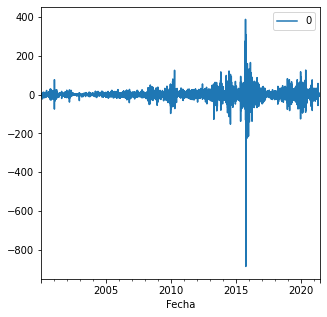

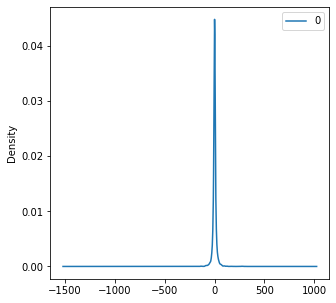

               0
count 7,865.0000
mean      0.0185
std      23.0205
min    -885.3796
25%      -5.4970
50%      -0.0540
75%       5.2117
max     387.7861


In [ ]:
for i in sarimax_order:
  model_sarimax2 = statsmodels.tsa.statespace.sarimax.SARIMAX(df_diff['kW/h price mean'].dropna(), exog=df_diff[sarimax_exog2].dropna(), order=i, freq=df_diff['kW/h price mean'].index.inferred_freq )
  model_sarimax2_fit = model_sarimax2.fit()
  print(model_sarimax2_fit.aic, i)
  # summary of fit model
  print(model_sarimax2_fit.summary())
  # line plot of residuals
  residuals2x = pd.DataFrame(model_sarimax2_fit.resid) 
  residuals2x.plot()
  plt.show()
  # density plot of residuals 
  residuals2x.plot(kind='kde') 
  plt.show()
  # summary stats of residuals
  print(residuals2x.describe())

In [ ]:
model_sarimax2 = statsmodels.tsa.statespace.sarimax.SARIMAX(df_diff['kW/h price mean'].dropna(), exog=df_diff[sarimax_exog2].dropna(), order=(2,0,1), freq='D' )
model_sarimax2_fit = model_sarimax2.fit()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


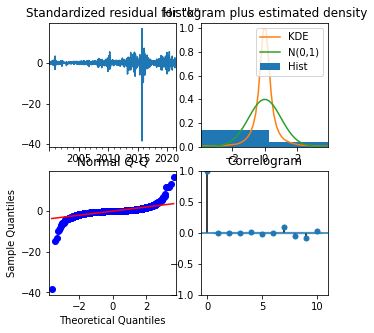

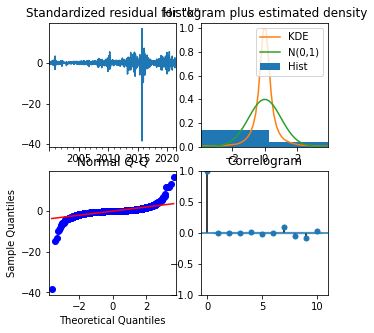

In [ ]:
model_sarimax2_fit.plot_diagnostics()

In [ ]:
# Jarque-Bera: [test_statistic, pvalue, skewness, kurtosis]
model_sarimax2_fit.test_normality(method='jarquebera')

array([[ 3.27078444e+07,  0.00000000e+00, -6.48436661e+00,
         3.18657412e+02]])

### Disponibilidad Hidraulica Response:

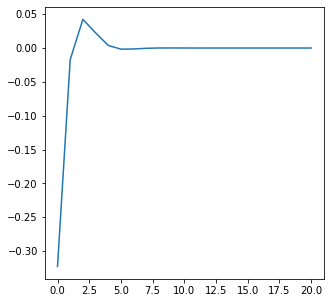

In [ ]:
Disponibilidad_HIDRAULICA_response = model_sarimax2.impulse_responses(params=model_sarimax2_fit.params, steps=20, exog='Disponibilidad_HIDRAULICA')*model_sarimax2_fit.params['Disponibilidad_HIDRAULICA']
Disponibilidad_HIDRAULICA_response.plot()

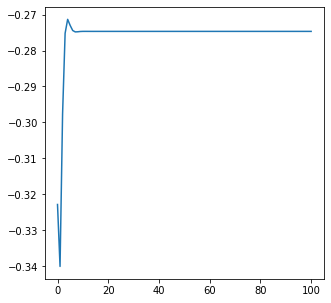

In [ ]:
Disponibilidad_HIDRAULICA_response_cumulative = model_sarimax2.impulse_responses(params=model_sarimax2_fit.params, steps=100, exog='Disponibilidad_HIDRAULICA', cumulative=True)*model_sarimax2_fit.params['Disponibilidad_HIDRAULICA']
Disponibilidad_HIDRAULICA_response_cumulative.plot()

### Disponibilidad Termica Response:

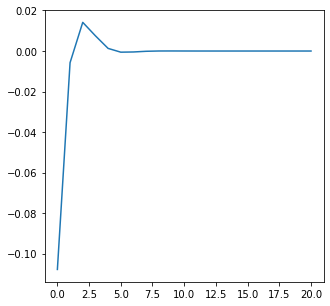

In [ ]:
Disponibilidad_TERMICA_response = model_sarimax2.impulse_responses(params=model_sarimax2_fit.params, steps=20, exog='Disponibilidad_TERMICA')*model_sarimax2_fit.params['Disponibilidad_TERMICA']
Disponibilidad_TERMICA_response.plot()

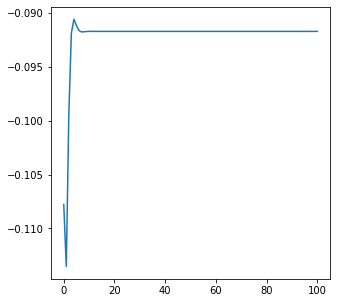

In [ ]:
Disponibilidad_TERMICA_response_cumulative = model_sarimax2.impulse_responses(params=model_sarimax2_fit.params, steps=100, exog='Disponibilidad_TERMICA', cumulative=True)*model_sarimax2_fit.params['Disponibilidad_TERMICA']
Disponibilidad_TERMICA_response_cumulative.plot()

### Aportes Caudal Response:

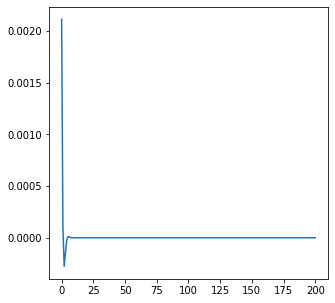

In [ ]:
Aportes_Caudal_response = model_sarimax2.impulse_responses(params=model_sarimax2_fit.params, steps=200, exog='Aportes Caudal m3/s')*model_sarimax2_fit.params['Aportes Caudal m3/s']
Aportes_Caudal_response.plot()

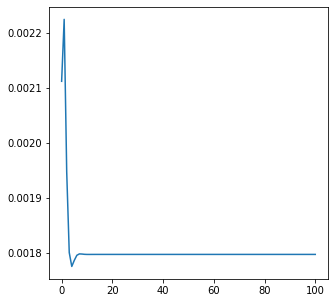

In [ ]:
Aportes_Caudal_response_cumulative = model_sarimax2.impulse_responses(params=model_sarimax2_fit.params, steps=100, exog='Aportes Caudal m3/s', cumulative=True)*model_sarimax2_fit.params['Aportes Caudal m3/s']
Aportes_Caudal_response_cumulative.plot()

### Volumen Util Diario Mm3 Response:

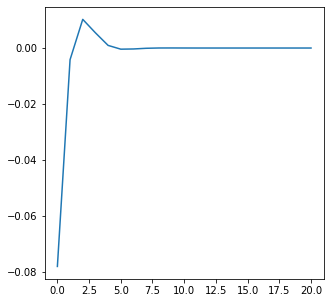

In [ ]:
Volumen_Util_response = model_sarimax2.impulse_responses(params=model_sarimax2_fit.params, steps=20, exog='Volumen Útil Diario Mm3')*model_sarimax2_fit.params['Volumen Útil Diario Mm3']
Volumen_Util_response.plot()

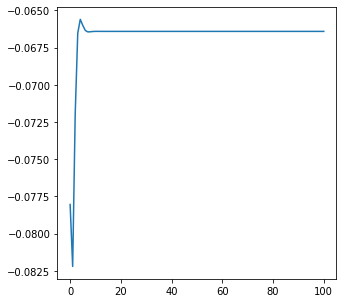

In [ ]:
Volumen_Util_response_cumulative = model_sarimax2.impulse_responses(params=model_sarimax2_fit.params, steps=100, exog='Volumen Útil Diario Mm3', cumulative=True)*model_sarimax2_fit.params['Volumen Útil Diario Mm3']
Volumen_Util_response_cumulative.plot()

### Volumen Mm3 Response:

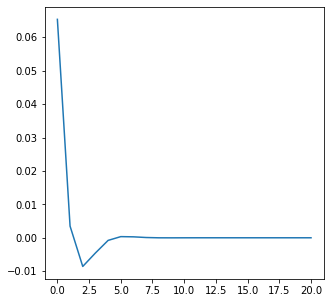

In [ ]:
Volumen_Mm3_response = model_sarimax2.impulse_responses(params=model_sarimax2_fit.params, steps=20, exog='Volumen Mm3')*model_sarimax2_fit.params['Volumen Mm3']
Volumen_Mm3_response.plot()

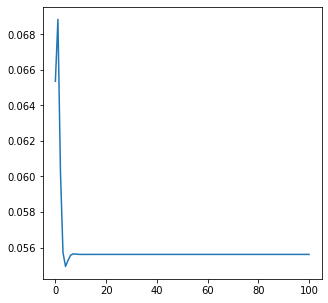

In [ ]:
Volumen_Mm3_response_cumulative = model_sarimax2.impulse_responses(params=model_sarimax2_fit.params, steps=100, exog='Volumen Mm3', cumulative = True)*model_sarimax2_fit.params['Volumen Mm3']
Volumen_Mm3_response_cumulative.plot()

### Volumen Util Diario Energia:

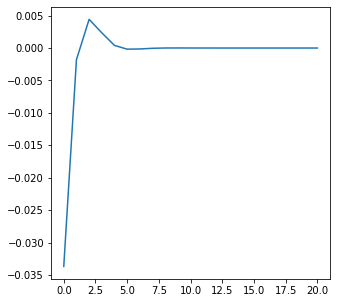

In [ ]:
Volumen_Diario_Energia_response = model_sarimax2.impulse_responses(params=model_sarimax2_fit.params, steps=20, exog='Volumen Útil Diario Energía gWh')*model_sarimax2_fit.params['Volumen Útil Diario Energía gWh']
Volumen_Diario_Energia_response.plot()

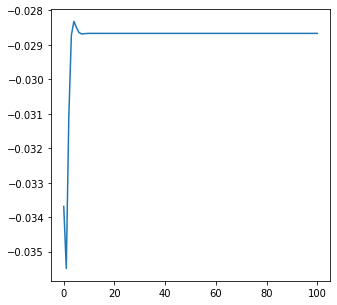

In [ ]:
Volumen_Diario_Energia_response_cumulative = model_sarimax2.impulse_responses(params=model_sarimax2_fit.params, steps=100, exog='Volumen Útil Diario Energía gWh', cumulative=True)*model_sarimax2_fit.params['Volumen Útil Diario Energía gWh']
Volumen_Diario_Energia_response_cumulative.plot()

In [ ]:
import json

impulse_responses = {}
impulse_responses['HYDRAULIC_availability'] = list(Disponibilidad_HIDRAULICA_response)
impulse_responses['Cumulative_HYDRAULIC availability'] = list(Disponibilidad_HIDRAULICA_response_cumulative)
impulse_responses['THERMAL_availability'] = list(Disponibilidad_TERMICA_response)
impulse_responses['Cumulative_THERMAL availability'] = list(Disponibilidad_TERMICA_response_cumulative)
impulse_responses['flow_contribution'] = list(Aportes_Caudal_response)
impulse_responses['Cumulative_flow_contribution'] = list(Aportes_Caudal_response_cumulative)
impulse_responses['daily_volume_(Mm3)'] = list(Volumen_Util_response)
impulse_responses['Cumulative_daily_volume_(Mm3)'] = list(Volumen_Util_response_cumulative)
impulse_responses['Volume_(Mm3)'] = list(Volumen_Mm3_response)
impulse_responses['Cumulative_Volume_(Mm3)'] = list(Volumen_Mm3_response_cumulative)
impulse_responses['Daily_useful_Volume_(gWh)'] = list(Volumen_Diario_Energia_response)
impulse_responses['Cumulative_Daily_useful_Volume_(gWh)'] = list(Volumen_Diario_Energia_response_cumulative)

with open('impulse_responses.json', 'w') as f:
    json.dump(impulse_responses, f)

# Forecasting:

## Test Dataset:

In [ ]:
df_test = pd.read_csv('/content/test.csv', sep=";")
df_test = df_test.set_index('Fecha')
df_test = df_test.replace(',', '.', regex=True)
df_test["Precio"] = pd.to_numeric(df_test["Precio"], downcast="float")
df_test.describe()

,Precio
count,30.0000
mean,93.0624
std,5.1640
min,87.0150
25%,89.9590
50%,91.2073
75%,93.4989
max,107.5638


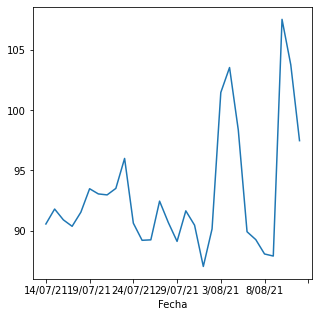

In [ ]:
df_test['Precio'].plot()

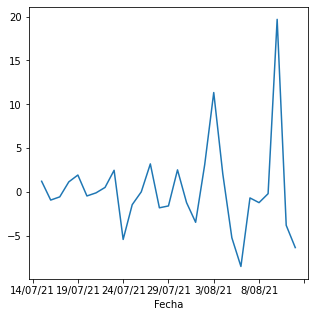

In [ ]:
df_test['Precio'].diff().plot()

## Univariate:

### Price:

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters

                               SARIMAX Results                                
Dep. Variable:        kW/h price mean   No. Observations:                 7865
Model:                 ARIMA(3, 0, 3)   Log Likelihood              -35850.859
Date:                Tue, 31 Aug 2021   AIC                          71717.719
Time:                        16:30:59   BIC                          71773.480
Sample:                    01-02-2000   HQIC                         71736.821
                         - 07-14-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0078      0.112      0.070      0.944      -0.212       0.228
ar.L1          0.3140      0.010     31.837      0.000       0.295       0.333
ar.L2         -0.1752      0.008    -21.730      0.0

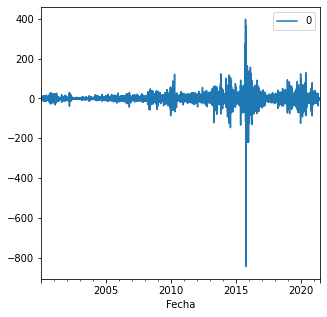

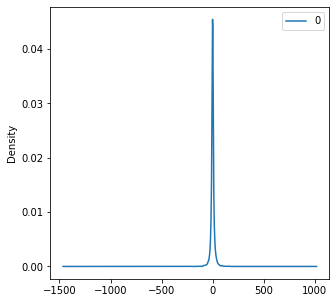

               0
count 7,865.0000
mean      0.0077
std      23.0894
min    -844.4887
25%      -5.5159
50%      -0.2358
75%       5.1436
max     397.4538


In [ ]:
model = sm.tsa.arima.ARIMA(df_diff['kW/h price mean'].dropna(), order=(3, 0, 3), dates=np.array(df_diff.reset_index().Fecha[1:]) )
model_fit = model.fit()
# print(model_fit.aic, i, j)
# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = pd.DataFrame(model_fit.resid) 
residuals.plot()
plt.show()
# density plot of residuals 
residuals.plot(kind='kde') 
plt.show()
# summary stats of residuals
print(residuals.describe())

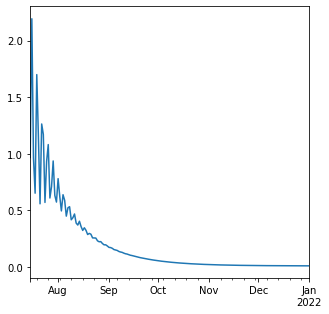

In [ ]:
precio_fit.forecast('2022Q1').plot()

In [ ]:
price_forecast_simulated = precio_fit.simulate(nsimulations=250, anchor="end", repetitions=730).mean()
price_forecast_simulated = price_forecast_simulated.values

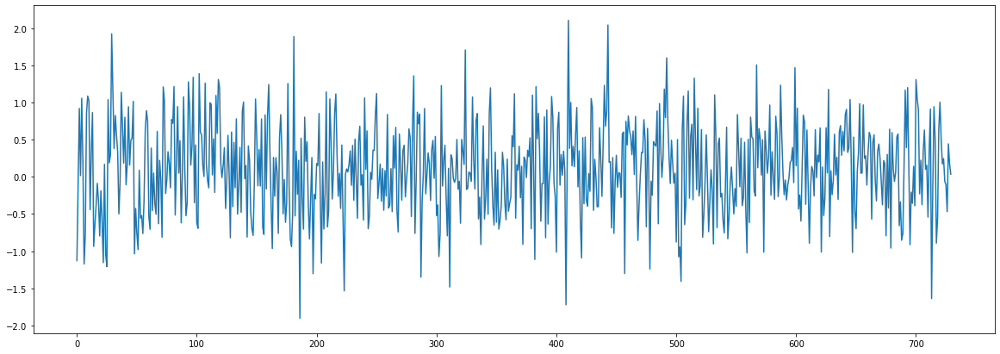

In [ ]:
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=price_forecast_simulated)
plt.show()

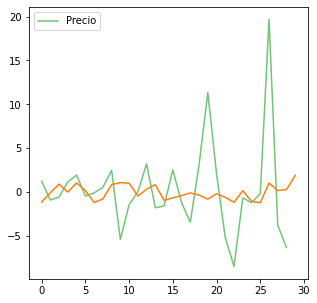

In [ ]:
sns.lineplot(data=df_test.diff().Precio[1:].reset_index(), palette= 'Greens')
sns.lineplot(data=price_forecast_simulated[:30])

In [ ]:
def original_level_forecasting(forecasting, variable):
  origin = df[variable][-1]
  original_level_temp = []
  for i in range(0,len(forecasting)):
    if i == 0:
      x = origin + forecasting[0]
      original_level_temp.append(x)
    else:
      x = forecasting[i] + original_level_temp[-1]
      original_level_temp.append(x)
  forecast_df = pd.DataFrame(original_level_temp)
  forecast_df.columns = [variable]
  return forecast_df

In [ ]:
df.columns

Index(['kW/h price mean', 'kW/h price std', 'Disponibilidad_HIDRAULICA',
       'Disponibilidad_TERMICA', 'Disponibilidad_SOLAR', 'Aportes Caudal m3/s',
       'Aportes Energía gWh', 'Volumen Útil Diario Mm3', 'Volumen Mm3',
       'Volumen Útil Diario Energía gWh', 'Volumen Energía gWh',
       'Vertimientos Volumen miles m3', 'Vertimiento Energía gWh', 'Year',
       'Month'],
      dtype='object')

In [ ]:
original_level_forecasting(price_forecast_simulated, 'kW/h price mean')

,kW/h price mean
0,82.1603
1,82.0986
2,83.0184
3,83.0343
4,84.0914
...,...
725,163.5259
726,163.0571
727,163.5002
728,163.6717


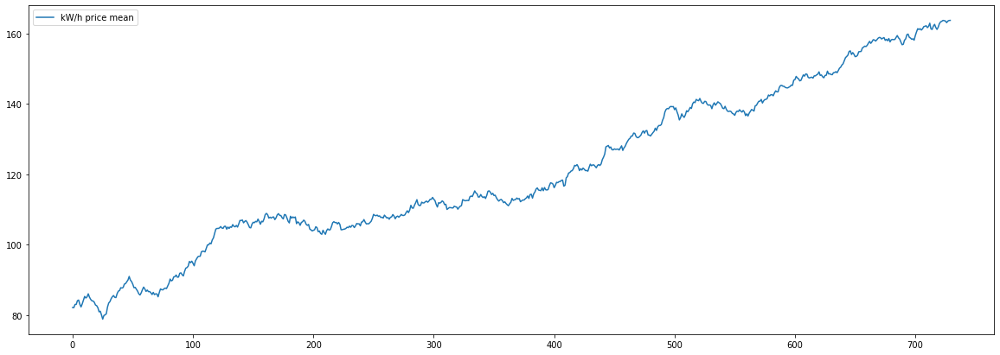

In [ ]:
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=original_level_forecasting(price_forecast_simulated, 'kW/h price mean'))
plt.show()

### Disponibilidad Hidraulica:

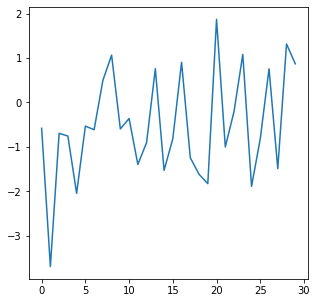

In [ ]:
sns.lineplot(data=(Disponibilidad_HIDRAULICA_fit.simulate(nsimulations=100, anchor="end", repetitions=30).mean()*5).values)

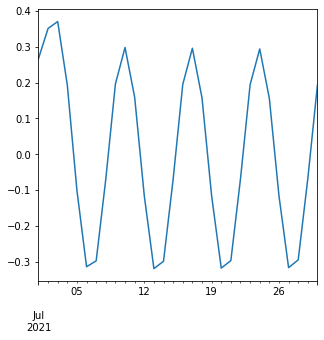

In [ ]:
Disponibilidad_HIDRAULICA_fit.get_prediction(start= '2021Q3', end='2022Q1', dynamic=True).summary_frame()['mean'][:30].plot()

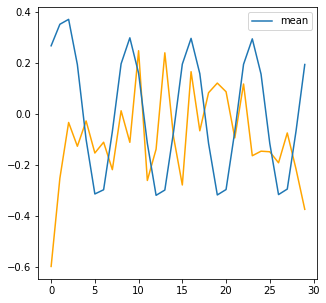

In [ ]:
sns.lineplot(data=(Disponibilidad_HIDRAULICA_fit.simulate(nsimulations=100, anchor="end", repetitions=30).mean()).values, color='orange')
sns.lineplot(data=Disponibilidad_HIDRAULICA_fit.get_prediction(start= '2021Q3', end='2022Q1', dynamic=True).summary_frame()['mean'][:30].reset_index())

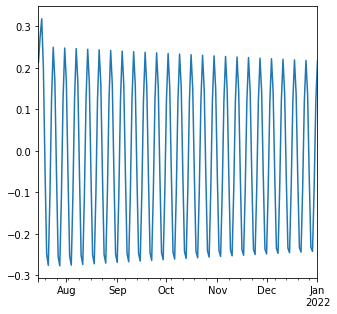

In [ ]:
Disponibilidad_HIDRAULICA_fit.forecast('2022Q1').plot()

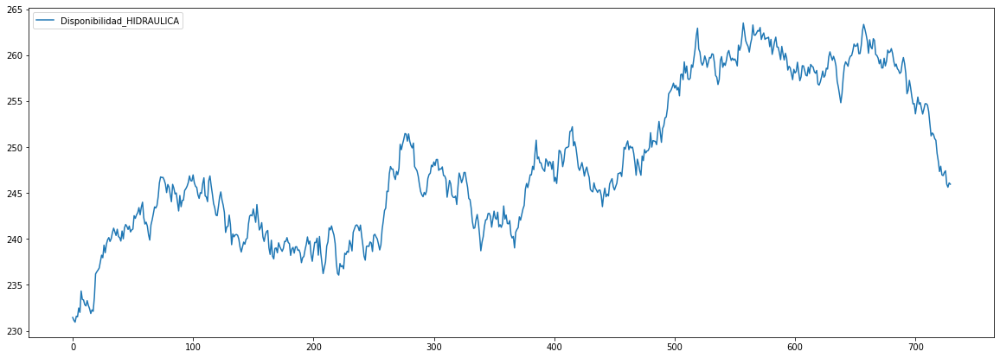

In [ ]:
HIDRAULICA_forecast_simulated = Disponibilidad_HIDRAULICA_fit.simulate(nsimulations=10, anchor="end", repetitions=730).mean()
HIDRAULICA_forecast_simulated = HIDRAULICA_forecast_simulated.values
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=original_level_forecasting(HIDRAULICA_forecast_simulated, 'Disponibilidad_HIDRAULICA'))
plt.show()

In [ ]:
pd.DataFrame(HIDRAULICA_forecast_simulated)

,0
0,-1.1613
1,-0.8667
2,1.0235
3,0.2832
4,-0.5728
...,...
725,-0.1395
726,0.5344
727,-1.7083
728,1.1043


### Disponibilidad Termica:

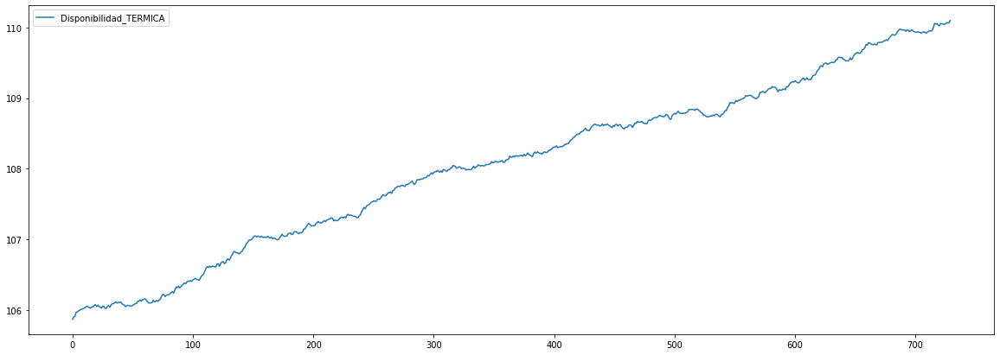

In [ ]:
TERMICA_forecast_simulated = Disponibilidad_TERMICA_fit.simulate(nsimulations=1000, anchor="end", repetitions=730).mean()
TERMICA_forecast_simulated = TERMICA_forecast_simulated.values
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=original_level_forecasting(TERMICA_forecast_simulated, 'Disponibilidad_TERMICA'))
plt.show()

### Disponibilidad Solar:

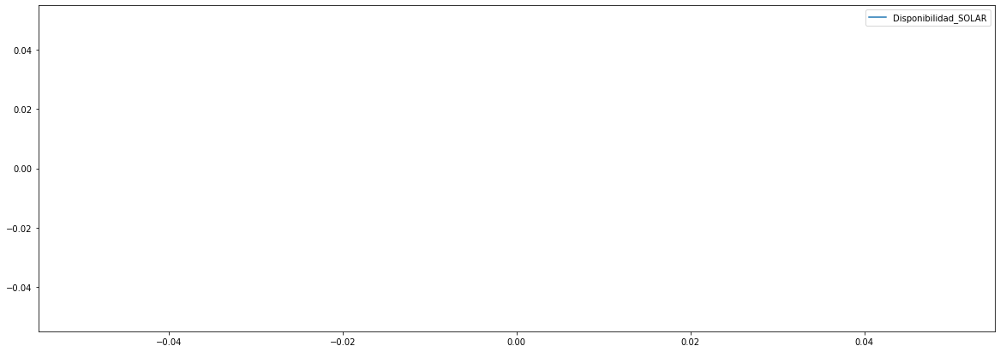

In [ ]:
SOLAR_forecast_simulated = Disponibilidad_SOLAR_fit.simulate(nsimulations=1000, anchor="end", repetitions=730).mean()
SOLAR_forecast_simulated = SOLAR_forecast_simulated.values
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=original_level_forecasting(SOLAR_forecast_simulated, 'Disponibilidad_SOLAR'))
plt.show()

### Aportes Caudal:

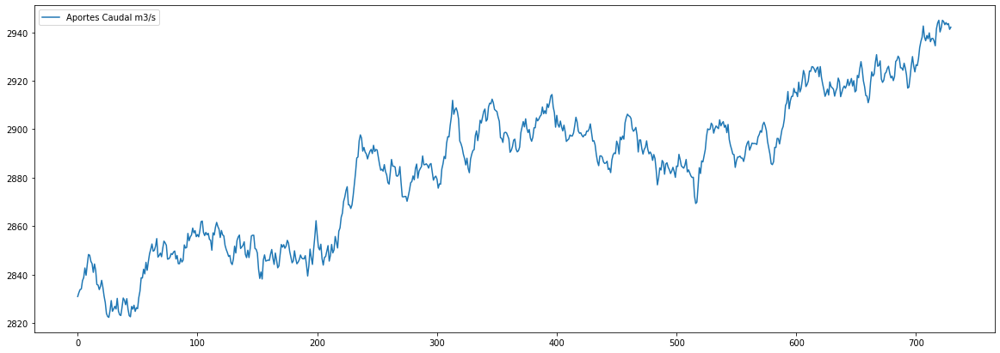

In [ ]:
Aportes_Caudal_forecast_simulated = Aportes_Caudal_fit.simulate(nsimulations=1000, anchor="end", repetitions=730).mean()
Aportes_Caudal_simulated = Aportes_Caudal_forecast_simulated.values
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=original_level_forecasting(Aportes_Caudal_forecast_simulated, 'Aportes Caudal m3/s'))
plt.show()

### Aportes Energia:

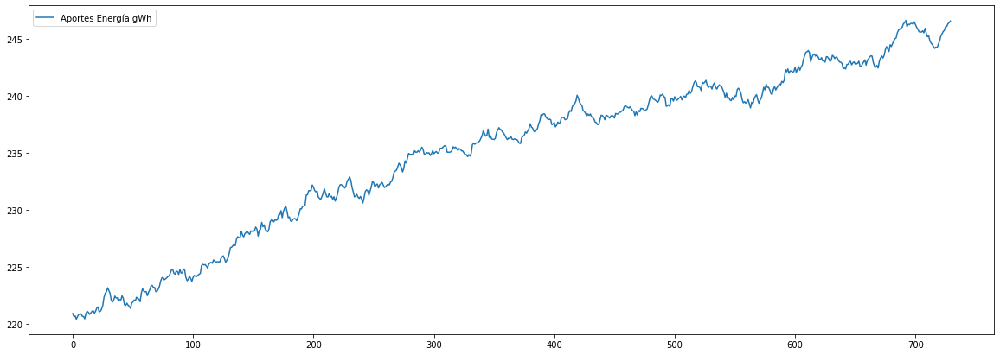

In [ ]:
Aportes_Energia_forecast_simulated = Aportes_Energia_fit.simulate(nsimulations=1000, anchor="end", repetitions=730).mean()
Aportes_Energia_simulated = Aportes_Energia_forecast_simulated.values
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=original_level_forecasting(Aportes_Energia_forecast_simulated, 'Aportes Energía gWh'))
plt.show()

### Vertimientos Volumen miles m3:

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


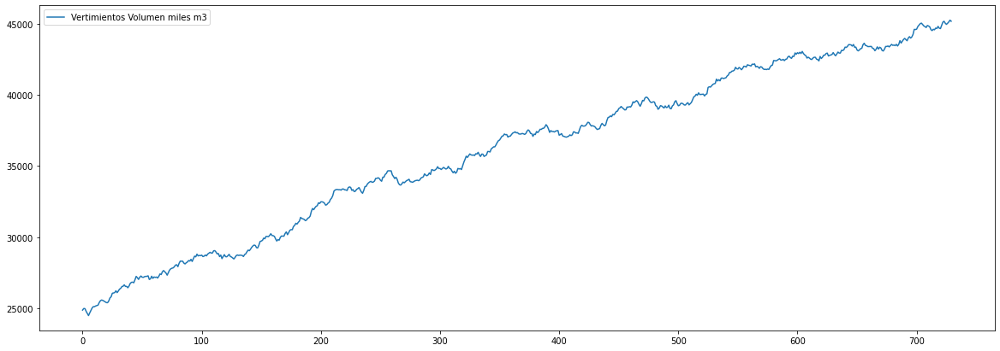

In [ ]:
Vertimientos_Volumen_forecast_simulated = Vertimientos_Volumen_fit.simulate(nsimulations=1000, anchor="end", repetitions=730).mean()
Vertimientos_Volumen_simulated = Vertimientos_Volumen_forecast_simulated.values
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=original_level_forecasting(Vertimientos_Volumen_forecast_simulated, 'Vertimientos Volumen miles m3'))
plt.show()

### Vertimiento Energía gWh:

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


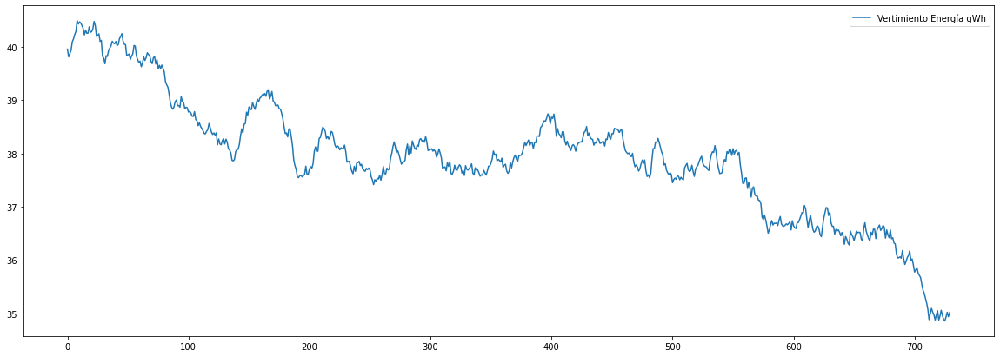

In [ ]:
Vertimientos_Energia_forecast_simulated = Vertimiento_Energia_fit.simulate(nsimulations=1000, anchor="end", repetitions=730).mean()
Vertimientos_Energia_simulated = Vertimientos_Energia_forecast_simulated.values
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=original_level_forecasting(Vertimientos_Energia_forecast_simulated, 'Vertimiento Energía gWh'))
plt.show()

### Volumen Energía gWh:

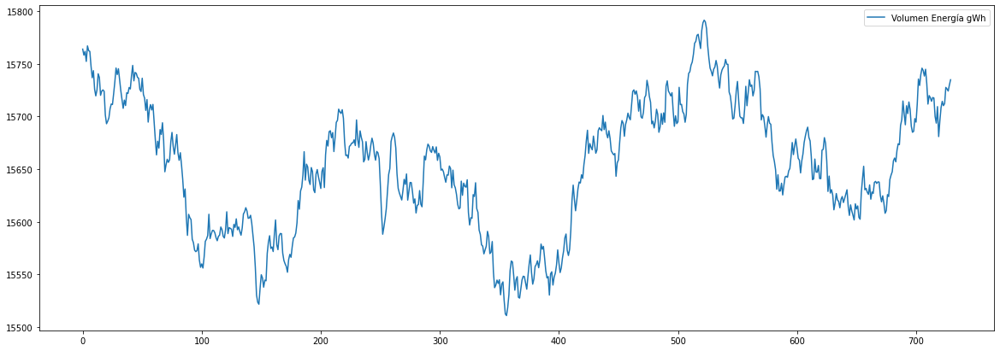

In [ ]:
Volumen_Energia_forecast_simulated = Volumen_Energial_fit.simulate(nsimulations=1000, anchor="end", repetitions=730).mean()
Volumen_Energia_forecast_simulated = Volumen_Energia_forecast_simulated.values
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=original_level_forecasting(Volumen_Energia_forecast_simulated, 'Volumen Energía gWh'))
plt.show()

### Volumen Mm3:

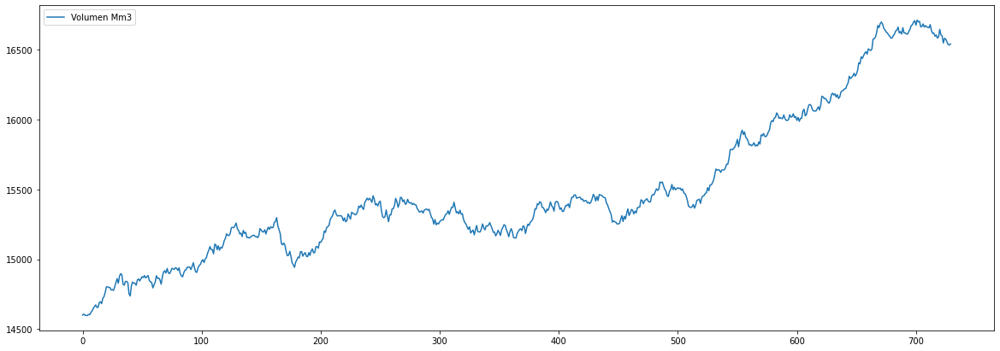

In [ ]:
Volumen_Mm3_forecast_simulated = Volumen_Mm3_fit.simulate(nsimulations=50, anchor="end", repetitions=730).mean()
Volumen_Mm3_forecast_simulated = Volumen_Mm3_forecast_simulated.values
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=original_level_forecasting(Volumen_Mm3_forecast_simulated, 'Volumen Mm3'))
plt.show()

### Volumen Útil Diario Energía gWh:

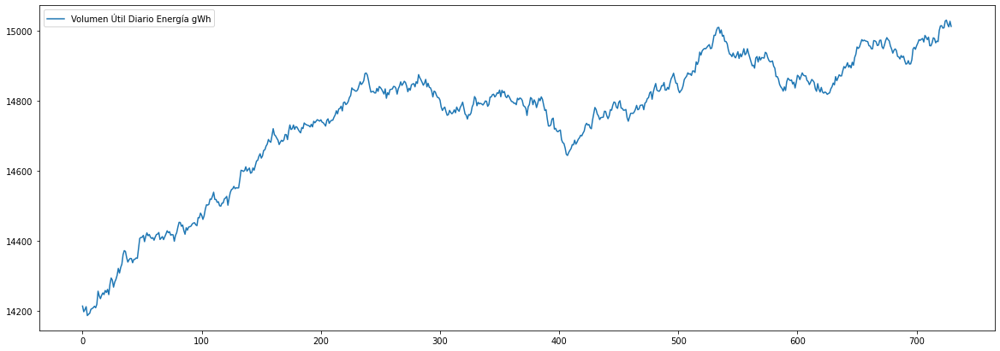

In [ ]:
Volumen_Diario_Energia_forecast_simulated = Volumen_Diario_Energia_model_fit.simulate(nsimulations=1000, anchor="end", repetitions=730).mean()
Volumen_Diario_Energia_forecast_simulated = Volumen_Diario_Energia_forecast_simulated.values
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=original_level_forecasting(Volumen_Diario_Energia_forecast_simulated, 'Volumen Útil Diario Energía gWh'))
plt.show()

### Volumen Útil Diario Mm3:

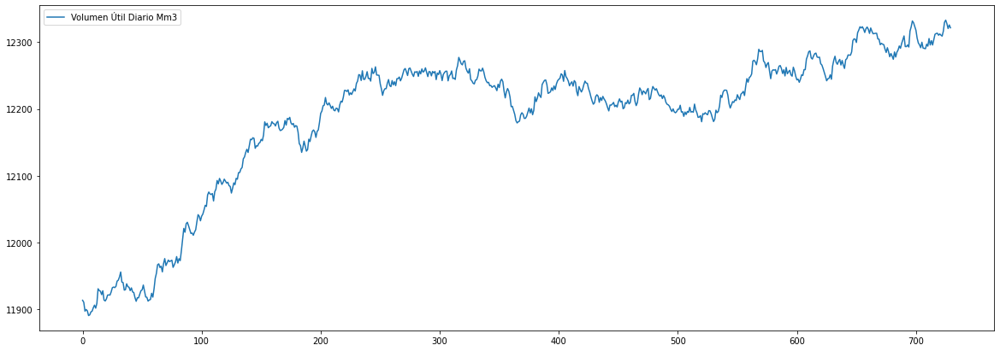

In [ ]:
Volumen_Diario_Mm3_forecast_simulated = Volumen_Diario_Mm3_fit.simulate(nsimulations=1000, anchor="end", repetitions=730).mean()
Volumen_Diario_Mm3_forecast_simulated = Volumen_Diario_Mm3_forecast_simulated.values
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=original_level_forecasting(Volumen_Diario_Mm3_forecast_simulated, 'Volumen Útil Diario Mm3'))
plt.show()

## Multivariate:

### Dataframe:

In [ ]:
df_price = pd.DataFrame(original_level_forecasting(price_forecast_simulated, 'kW/h price mean'))
df_hidra = pd.DataFrame(original_level_forecasting(HIDRAULICA_forecast_simulated, 'Disponibilidad_HIDRAULICA'))
df_term = pd.DataFrame(original_level_forecasting(TERMICA_forecast_simulated, 'Disponibilidad_TERMICA'))
df_ap_caud = pd.DataFrame(original_level_forecasting(Aportes_Caudal_forecast_simulated, 'Aportes Caudal m3/s'))
df_ap_ener = pd.DataFrame(original_level_forecasting(Aportes_Energia_forecast_simulated, 'Aportes Energía gWh'))
df_ver_vol = pd.DataFrame(original_level_forecasting(Vertimientos_Volumen_forecast_simulated, 'Vertimientos Volumen miles m3'))
df_ver_ener = pd.DataFrame(original_level_forecasting(Vertimientos_Energia_forecast_simulated, 'Vertimiento Energía gWh'))
df_vol_ener = pd.DataFrame(original_level_forecasting(Volumen_Energia_forecast_simulated, 'Volumen Energía gWh'))
df_vol_Mm3 = pd.DataFrame(original_level_forecasting(Volumen_Mm3_forecast_simulated, 'Volumen Mm3'))
df_vol_d_ener = pd.DataFrame(original_level_forecasting(Volumen_Diario_Energia_forecast_simulated, 'Volumen Útil Diario Energía gWh'))
df_vol_d_Mm3 = pd.DataFrame(original_level_forecasting(Volumen_Diario_Mm3_forecast_simulated, 'Volumen Útil Diario Mm3'))

In [ ]:
result = pd.concat([df_price, df_hidra, df_term, df_ap_caud, df_ap_ener, df_ver_vol, df_ver_ener, df_vol_ener, df_vol_Mm3, df_vol_d_ener, df_vol_d_Mm3], axis=1)
result

,kW/h price mean,Disponibilidad_HIDRAULICA,Disponibilidad_TERMICA,Aportes Caudal m3/s,Aportes Energía gWh,Vertimientos Volumen miles m3,Vertimiento Energía gWh,Volumen Energía gWh,Volumen Mm3,Volumen Útil Diario Energía gWh,Volumen Útil Diario Mm3
0,82.1603,229.8356,105.8871,"2,829.8140",221.1345,"25,056.2884",39.9892,"15,782.7238","14,625.4203","14,199.2733","11,892.2916"
1,82.0986,228.9689,105.9173,"2,830.1993",221.4823,"25,016.4189",39.9150,"15,775.4229","14,631.7822","14,192.4302","11,900.7819"
2,83.0184,229.9924,105.8949,"2,828.8889",221.4800,"25,021.9540",39.9853,"15,774.9226","14,629.9629","14,177.7285","11,904.7858"
3,83.0343,230.2756,105.9033,"2,831.4752",221.6104,"25,129.9075",40.0259,"15,792.3256","14,636.3772","14,172.1863","11,924.5469"
4,84.0914,229.7028,105.8963,"2,835.2694",221.8497,"25,200.0941",39.9407,"15,797.9193","14,639.2574","14,174.9679","11,932.8189"
...,...,...,...,...,...,...,...,...,...,...,...
725,163.5259,287.8291,110.8474,"2,936.0202",255.6910,"54,121.9097",36.4192,"16,583.7211","15,477.2386","14,941.4576","12,567.1949"
726,163.0571,288.3635,110.8518,"2,935.7202",255.1975,"54,320.2656",36.5141,"16,555.0992","15,488.1046","14,938.5991","12,568.2419"
727,163.5002,286.6552,110.8715,"2,937.1872",255.2639,"54,393.2886",36.6878,"16,554.4746","15,498.0784","14,909.3710","12,556.9151"
728,163.6717,287.7595,110.8717,"2,942.4534",255.0283,"54,605.5019",36.6899,"16,536.4743","15,503.0923","14,900.3236","12,564.5824"


In [ ]:
result.to_excel('forecasting.xlsx')

In [ ]:
result.columns

Index(['kW/h price mean', 'Disponibilidad_HIDRAULICA',
       'Disponibilidad_TERMICA', 'Aportes Caudal m3/s', 'Aportes Energía gWh',
       'Vertimientos Volumen miles m3', 'Vertimiento Energía gWh',
       'Volumen Energía gWh', 'Volumen Mm3', 'Volumen Útil Diario Energía gWh',
       'Volumen Útil Diario Mm3'],
      dtype='object')

### Dataframe to model:

In [ ]:
sarimax_forecast_df = result[['Disponibilidad_HIDRAULICA','Disponibilidad_TERMICA','Aportes Caudal m3/s','Volumen Útil Diario Mm3','Volumen Mm3','Volumen Útil Diario Energía gWh']]

In [ ]:
model_sarimax2_fit.params

Disponibilidad_HIDRAULICA          -0.3228
Disponibilidad_TERMICA             -0.1078
Aportes Caudal m3/s                 0.0021
Volumen Útil Diario Mm3            -0.0780
Volumen Mm3                         0.0654
Volumen Útil Diario Energía gWh    -0.0337
ar.L1                               0.4667
ar.L2                              -0.1561
ma.L1                              -0.4133
sigma2                            530.2738
dtype: float64

Disponibilidad_HIDRAULICA          -0.3228

Disponibilidad_TERMICA             -0.1078

Aportes Caudal m3/s                 0.0021

Volumen Útil Diario Mm3            -0.0780

Volumen Mm3                         0.0654

Volumen Útil Diario Energía gWh    -0.0337

ar.L1                               0.4667

ar.L2                              -0.1561

ma.L1                              -0.4133

sigma2                            530.2738

dtype: float64

In [ ]:
sarimax_df_forecast = model_sarimax2_fit.simulate(exog=sarimax_forecast_df.diff()[1:],anchor='end', nsimulations=729, repetitions=100)
sarimax_df_forecast2 = sarimax_df_forecast.mean(axis = 1)

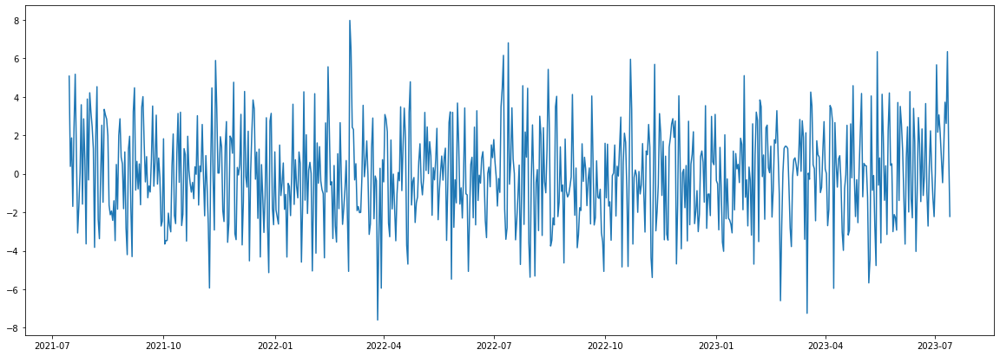

In [ ]:
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=sarimax_df_forecast2)
plt.show()

In [ ]:
def original_level_price_multivariate_model(forecasting):
  origin = df['kW/h price mean'][-1]
  original_level_temp = []
  for i in range(0,len(forecasting)):
    if i == 0:
      x = origin + forecasting[0]
      original_level_temp.append(x)
    else:
      x = forecasting[i] + original_level_temp[-1]
      original_level_temp.append(x)
  forecast_df = pd.DataFrame(original_level_temp)
  return forecast_df

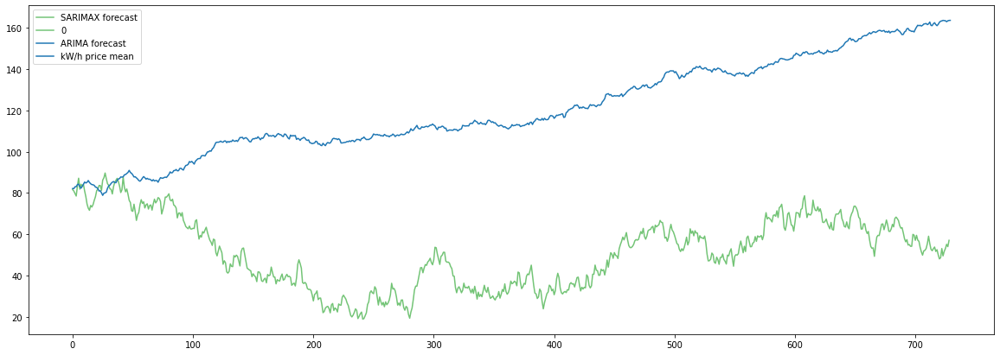

In [ ]:
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=original_level_price_multivariate_model(sarimax_df_forecast2), palette='Greens', label='SARIMAX forecast')
sns.lineplot(data=original_level_forecasting(price_forecast_simulated, 'kW/h price mean'), label='ARIMA forecast')
plt.show()

In [ ]:
original_level_price_multivariate_model(sarimax_df_forecast2).to_excel('price_multivarite_forecast.xlsx')

# Simulating Shocks:

In [ ]:
impulse_date = '2021-07-20'
variable = Disponibilidad_HIDRAULICA_response_cumulative
variable_cumulative = Disponibilidad_HIDRAULICA_response_cumulative
expansion = 3

In [ ]:
Disponibilidad_HIDRAULICA_response

0    -0.3228
1    -0.0172
2     0.0424
3     0.0225
4     0.0039
5    -0.0017
6    -0.0014
7    -0.0004
8     0.0000
9     0.0001
10    0.0000
11    0.0000
12   -0.0000
13   -0.0000
14   -0.0000
15    0.0000
16    0.0000
17    0.0000
18   -0.0000
19   -0.0000
20   -0.0000
Name: kW/h price mean, dtype: float64

In [ ]:
expansion = 1
var = Disponibilidad_HIDRAULICA_response_cumulative
impulse_date = '2021-10-17'

impulse_dataframe = pd.DataFrame(var)*expansion
impulse_dataframe['date'] = pd.date_range(start=impulse_date, periods=len(var), freq='D')
impulse_dataframe['date'] = pd.to_datetime(impulse_dataframe['date'])
impulse_dataframe = impulse_dataframe.set_index('date')
impulse_dataframe

,kW/h price mean
date,
2021-10-17,-0.3228
2021-10-18,-0.3400
2021-10-19,-0.2977
2021-10-20,-0.2752
2021-10-21,-0.2713
...,...
2022-01-21,-0.2747
2022-01-22,-0.2747
2022-01-23,-0.2747


In [ ]:
def impulse_dataframe(date, var, expansion):
  impulse_dataframe = pd.DataFrame(var)*expansion
  impulse_dataframe['date'] = pd.date_range(start=impulse_date, periods=len(var), freq='D')
  impulse_dataframe['date'] = pd.to_datetime(impulse_dataframe['date'])
  impulse_dataframe = impulse_dataframe.set_index('date')
  impulse_dataframe
  return impulse_dataframe

In [ ]:
impulse_dataframe('2021-07-20', Disponibilidad_TERMICA_response_cumulative, 1)

,kW/h price mean
date,
2021-07-20,-0.1078
2021-07-21,-0.1135
2021-07-22,-0.0994
2021-07-23,-0.0919
2021-07-24,-0.0906
...,...
2021-10-24,-0.0917
2021-10-25,-0.0917
2021-10-26,-0.0917


In [ ]:
def response_dataframe(date, var, expansion):
  temp_dataframe = pd.concat([pd.DataFrame(sarimax_df_forecast2), impulse_dataframe(impulse_date, variable, expansion)], axis=1)
  temp_dataframe.columns = ['original', 'impulse']
  temp_dataframe = temp_dataframe.replace(np.nan, 0)
  temp_dataframe['response'] = temp_dataframe['original'] + temp_dataframe['impulse']
  return temp_dataframe

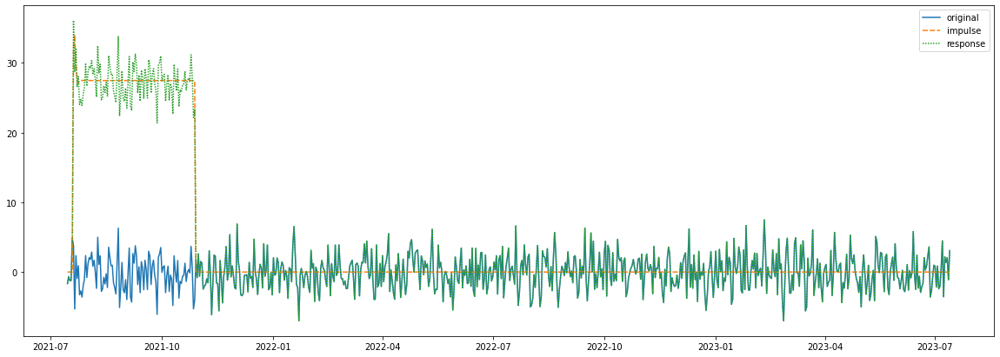

In [ ]:
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=response_dataframe(impulse_date, Aportes_Caudal_response, -100))
plt.show()

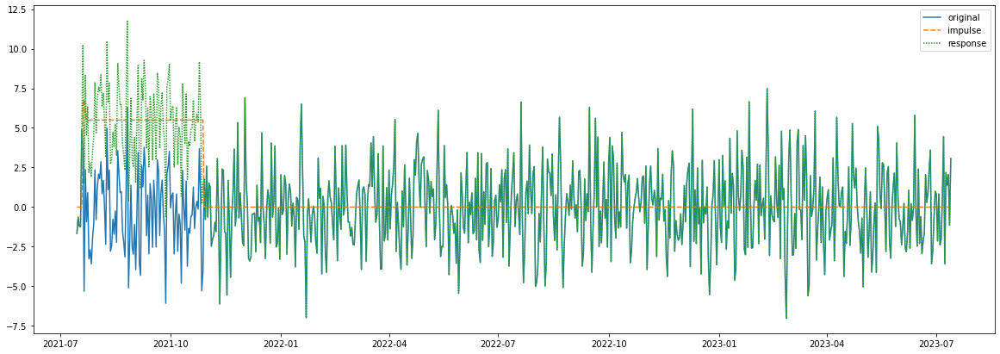

In [ ]:
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=response_dataframe(impulse_date, variable_cumulative, -20))
plt.show()

In [ ]:
def original_level_shock_simulation(impulse_date, variable, expansion):
  origin = df['kW/h price mean'][-1]
  original_level_temp = []
  temp_dataframe = pd.concat([pd.DataFrame(sarimax_df_forecast2), impulse_dataframe(impulse_date, variable, expansion)], axis=1)
  temp_dataframe.columns = ['original', 'impulse']
  temp_dataframe = temp_dataframe.replace(np.nan, 0)
  temp_dataframe['response'] = temp_dataframe['original'] + temp_dataframe['impulse']
  for i in range(0,len(temp_dataframe['response'])):
    if i == 0:
      x = origin + temp_dataframe['response'][0]
      original_level_temp.append(x)
    else:
      x = temp_dataframe['response'][i] + original_level_temp[-1]
      original_level_temp.append(x)
  forecast_df = pd.DataFrame(original_level_temp)
  return forecast_df

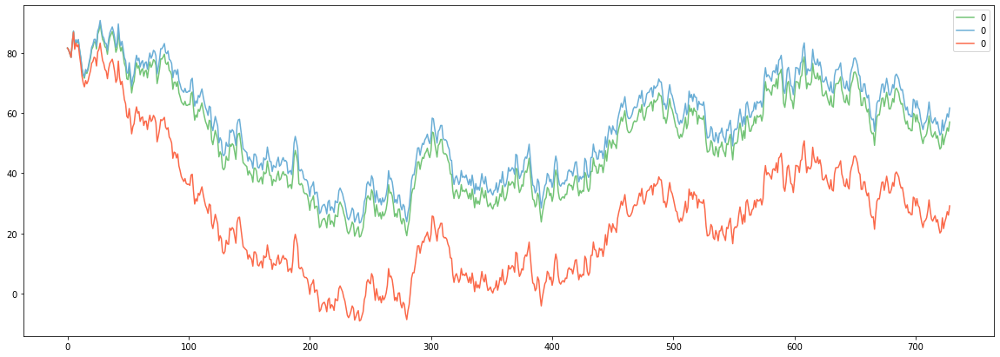

In [ ]:
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=original_level_shock_simulation(impulse_date, variable, 0), palette = 'Greens')
sns.lineplot(data=original_level_shock_simulation('2021-10-10', Disponibilidad_TERMICA_response_cumulative, -0.5), palette = 'Blues')
sns.lineplot(data=original_level_shock_simulation('2022-10-10', variable_cumulative, 1), palette = 'Reds')
plt.show()

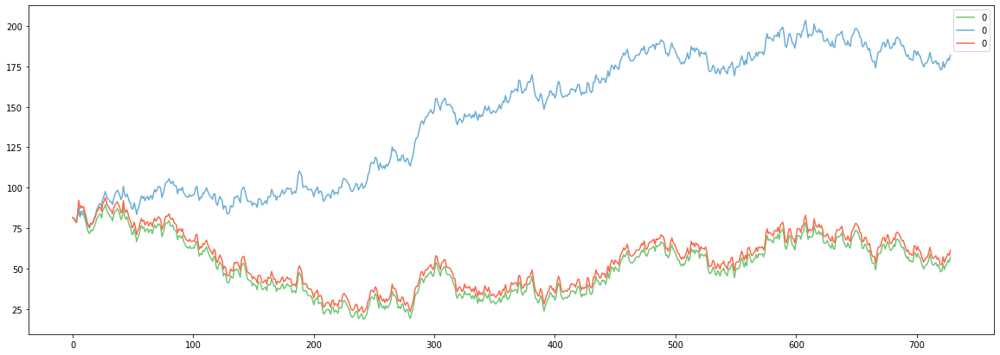

In [ ]:
fig, ax = plt.subplots(figsize=(20,7))
sns.lineplot(data=original_level_shock_simulation(impulse_date, variable, 0), palette = 'Greens')
sns.lineplot(data=original_level_shock_simulation(impulse_date, variable_cumulative, 0.4), palette = 'Blues')
sns.lineplot(data=original_level_shock_simulation(impulse_date, variable, 5), palette = 'Reds')
plt.show()

# Testing Results: